In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from scipy import optimize
from scipy import stats
import matplotlib.ticker as mtick
import matplotlib.dates as mdates
import seaborn as sns
import urllib.request, json 

from src.data_collection import *
from src.constants import *

# Response and effect time line

In [4]:
def linear_fit(x, a, b):
    return  a*x+b

def country_dynamics(category, country, cut, days):
    fig, ax = plt.subplots(nrows=1, ncols=1, sharey=True, figsize=(16,9))
    ax.set_yscale('log')
    cum = data[category].copy().T[[country]]
    focus = (cum - cum.shift(1)).iloc[cut:,:]
    
    ax.plot(cum.iloc[cut:,:], alpha=0.8, lw=2, label=category + ' cases in ' + country )
    ax.scatter(focus.index, focus[country], c='gray', s=5)
    
    for i,(a,b) in enumerate(days):
        slope, intercept = optimize.curve_fit(linear_fit, np.arange(a,b), np.log(focus[country].values[a:b]+1))[0]
        ax.plot(np.arange(a,b), np.exp(np.arange(a,b)*slope + intercept), c=('C'+str(i+1)))
        ax.annotate(np.round(np.exp(slope),2), 
                    xy=((a+b-2)/2, np.exp((a+b)/2*slope + intercept)), fontsize=20, c=('C'+str(i+1)))                    
            
    ax.legend(prop={'size': 20})
    ax.tick_params(labelsize=20)
    ax.xaxis.set_major_locator(plt.MaxNLocator(12))
    plt.tight_layout()
    return fig, ax

def country_dynamics_all(country, cut, days):
    fig, ax = plt.subplots(nrows=3, ncols=1, sharex=True, figsize=(12,12))
    fig.subplots_adjust(wspace=0, hspace=0)
    
    for i,category in enumerate(data.keys()):
        ax[i].set_yscale('log')
        cum = data[category].copy().T[[country]]
        focus = (cum - cum.shift(1)).iloc[cut:,:]

        ax[i].plot(cum.iloc[cut:,:], alpha=0.5, lw=2, label=category + ' cases in ' + country )
        ax[i].scatter(focus.index, focus[country], c='gray', s=5)

        for j,(a,b) in enumerate(days[i]):
            slope, intercept = optimize.curve_fit(linear_fit, np.arange(a,b), np.log(focus[country].values[a:b]+1))[0]
            ax[i].plot(np.arange(a,b), np.exp(np.arange(a,b)*slope + intercept), c=('C'+str(j+1)))
            ax[i].annotate(np.round(np.exp(slope),2), 
                    xy=((a+b-2)/2, np.exp((a+b)/2*slope + intercept)), fontsize=14, c=('C'+str(j+1)))  

        ax[i].legend(prop={'size': 12})
        ax[i].tick_params(labelrotation=90, labelsize=14)
        # ax.xaxis.set_major_locator(plt.MaxNLocator(15))
        plt.tight_layout()
        
def country_dynamics_all_in_one(country, cut, days):
    fig, ax = plt.subplots(nrows=1, ncols=1, sharex=True, figsize=(12,10))
    fig.subplots_adjust(wspace=0, hspace=0)
    
    for i,category in enumerate(data.keys()):
        ax.set_yscale('log')
        focus = (cum - cum.shift(1)).iloc[cut:,:]

#         ax.plot(cum.iloc[cut:,:], alpha=0.5, lw=2, label=category + ' cases in ' + country )
        ax.scatter(focus.index, focus[country], c='gray', s=5)

        for j,(a,b) in enumerate(days[i]):
            slope, intercept = optimize.curve_fit(linear_fit, np.arange(a,b), np.log(focus[country].values[a:b]+1))[0]
            ax[i].plot(np.arange(a,b), np.exp(np.arange(a,b)*slope + intercept), c=('C'+str(j+1)))
            ax[i].annotate(np.round(np.exp(slope),2), 
                    xy=((a+b-2)/2, np.exp((a+b)/2*slope + intercept)), fontsize=14, c=('C'+str(j+1)))  

        ax[i].legend(prop={'size': 12})
        ax[i].tick_params(labelrotation=90, labelsize=14)
        # ax.xaxis.set_major_locator(plt.MaxNLocator(15))
        plt.tight_layout()

        
confirm = pd.read_csv('data/JH/confirm_agg.csv').set_index('Country/Region')
death = pd.read_csv('data/JH/death_agg.csv').set_index('Country/Region')
recover = pd.read_csv('data/JH/recover_agg.csv').set_index('Country/Region')
data = {'Confirmed':confirm, 'Death':death, 'Recovered':recover}

Text(18, 12, 'All Wuhan apartment\ncomplex "close\nmanagement"')

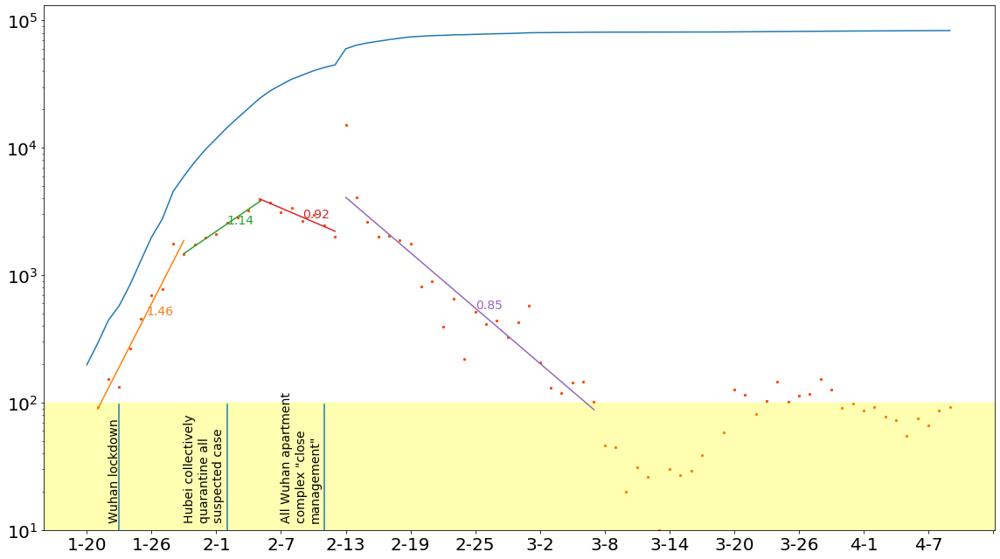

In [5]:
df = pd.read_csv('data/2019-nCov stats - International.csv', ).set_index('time')\
    .drop(['Hongkong','Macao','Taiwan','Diamond Princess'])\
    .T.dropna(how='all')\
    .drop('Alert Level')

def country_dynamic(province, days):
    fig, ax = plt.subplots(nrows=1, ncols=1, sharey=True, figsize=(16,9))
   
    focus = df[[province]].copy()
    focus['d_'+province] = focus[province] - focus[province].shift(1)

    ax.set_yscale('log')
    ax.plot(focus.index, focus[province], label=province)
    ax.scatter(focus.index, focus[('d_'+province)], c='orangered', s=5)
    # ax.legend(prop={'size': 12})

    for i,(a,b) in enumerate(days):
            slope, intercept, _,_,_ = stats.linregress(np.arange(a,b),np.log(focus[('d_'+province)][a:b].values))
            x = np.arange(a,b)
            y = np.exp(slope*x + intercept)
            ax.plot(x, y, c=('C'+str(i+1)))
            ax.annotate(np.round(np.exp(slope),2), xy=((a+b)/2,np.exp(slope*(a+b)/2+intercept)), fontsize=14, c=('C'+str(i+1)))

    ax.tick_params(labelsize=20)
    ax.xaxis.set_major_locator(plt.MaxNLocator(17))
#     ax.set_xlim(left=25)
    plt.tight_layout()
    return fig, ax
    
fig, ax = country_dynamic('China', [(1,10),(9,17),(16,24),(24,48)])
plt.axhspan(ymin=10, ymax=100, color='yellow', alpha=0.3)
ax.set_ylim(bottom=10)

ax.axvline(x=3, ymin=0, ymax=0.24)
ax.annotate('Wuhan lockdown',xy=(2,12), rotation=90, size=14)

ax.axvline(x=13, ymin=0, ymax=0.24)
ax.annotate('Hubei collectively \nquarantine all\nsuspected case',xy=(9,12), rotation=90, size=14)

ax.axvline(x=22, ymin=0, ymax=0.24)
ax.annotate('All Wuhan apartment\ncomplex "close\nmanagement"',xy=(18,12), rotation=90, size=14)


In [6]:
df = pd.read_clipboard().set_index('US')
df

KeyError: "None of ['US'] are in the columns"

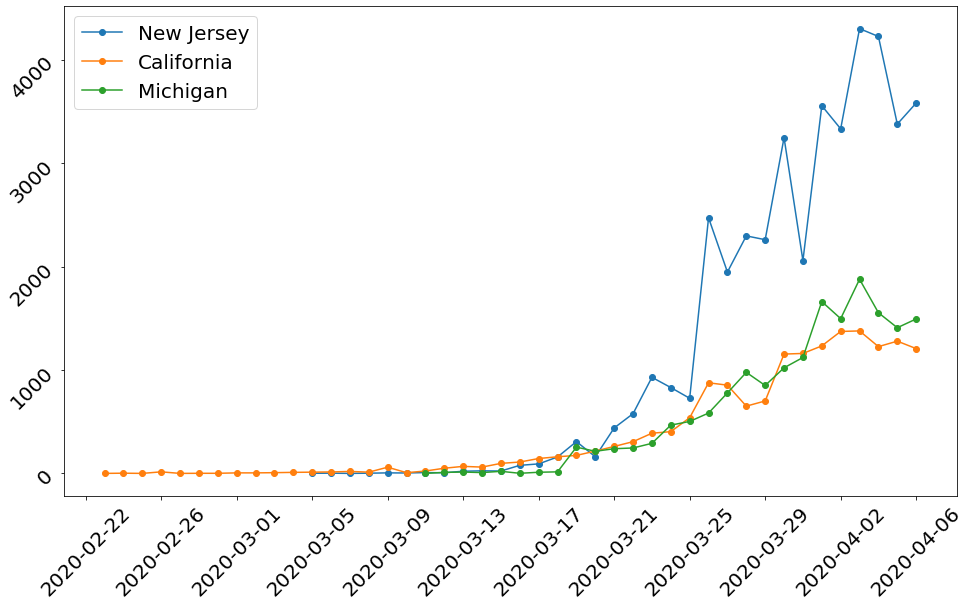

In [135]:
fig, ax = plt.subplots(nrows=1, ncols=1, sharey=True, figsize=(16,9))
for i in list(df)[1:4]:
    ax.plot(df[i], 'o-', label=i)
# ax.set_yscale('log')
ax.tick_params(rotation=45, labelsize=20)
ax.xaxis.set_major_locator(plt.MaxNLocator(12))
ax.legend(fontsize=20)

# https://covidcurvetracker.org/

In [3]:
df = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_deaths_global.csv')
focus = df.copy().drop(['Lat','Long'], axis=1).set_index(['Country/Region','Province/State'])
death = focus.groupby('Country/Region').sum()

In [36]:
china = death.T[['China']]

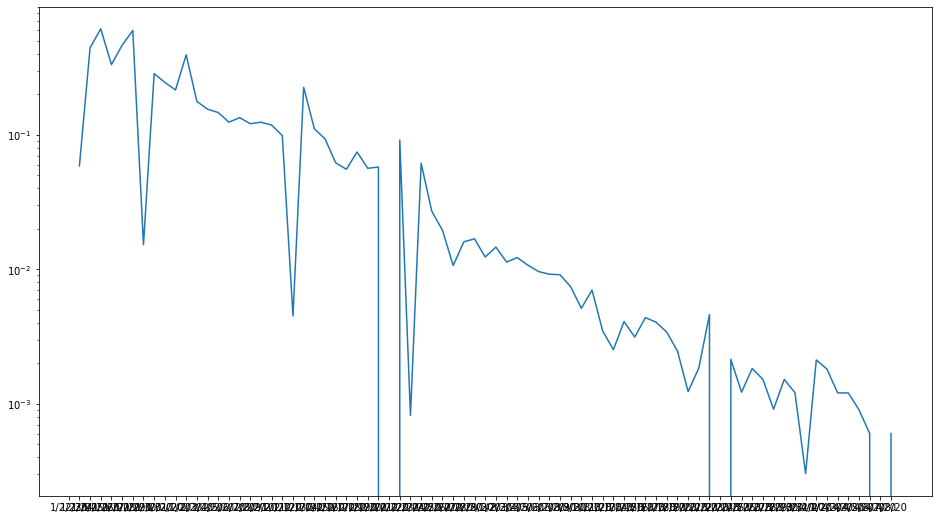

In [43]:
china['new'] = (china['China'] - china['China'].shift(1)) / china['China'].shift(1)
china

fig, ax = plt.subplots(nrows=1, ncols=1, sharey=True, figsize=(16,9))
ax.plot(china['new'])
ax.set_yscale('log')

# Days after quatantine

In [6]:
focus = pd.read_csv('data/country detailed/2019-nCov stats - temp.csv').set_index('Unnamed: 0').fillna(0).iloc[:-1,:]
focus

,Hubei,Lombardy,California,Austria
Unnamed: 0,,,,
1-20,270,0.0,0.0,0.0
1-21,375,0.0,0.0,0.0
1-22,444,0.0,0.0,0.0
1-23,549,0.0,0.0,0.0
1-24,729,0.0,0.0,0.0
...,...,...,...,...
43927,67803,51534.0,16284.0,12297.0
43928,67803,52325.0,17540.0,12639.0
43929,67803,53414.0,19043.0,12942.0


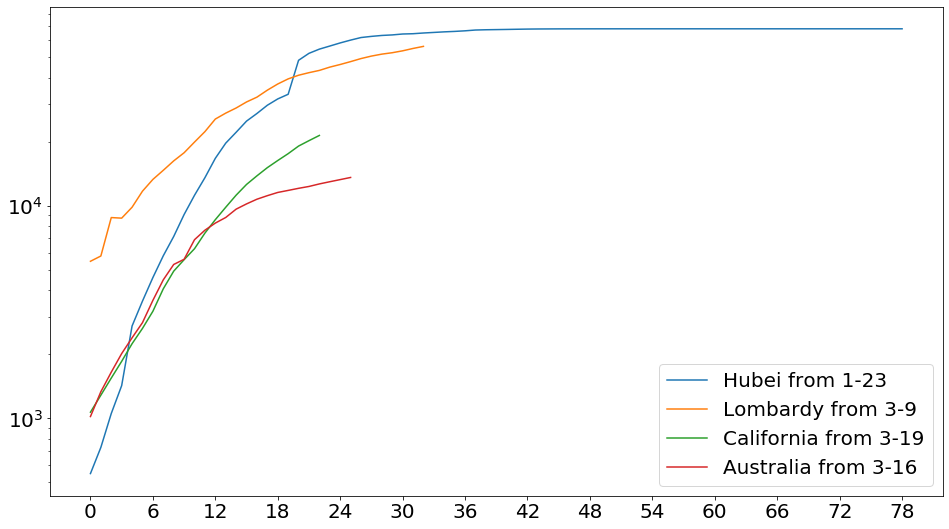

In [7]:
fig, ax = plt.subplots(nrows=1, ncols=1, sharey=True, figsize=(16,9))

ax.set_yscale('log')
ax.plot(focus.Hubei.values[3:], label='Hubei from 1-23')
ax.plot(focus.Lombardy.values[49:], label='Lombardy from 3-9')
ax.plot(focus.California.values[59:], label='California from 3-19')
ax.plot(focus.Austria.values[56:], label='Australia from 3-16')

ax.legend(fontsize=20)
ax.tick_params(labelsize=20)
ax.xaxis.set_major_locator(plt.MaxNLocator(15))

In [8]:
window = 5
for i in list(focus):
    focus[i] = focus[i].rolling(window=window, min_periods=1, center=True).mean()
    focus[i + '_r'] = focus[i] / focus[i].shift(1) - 1

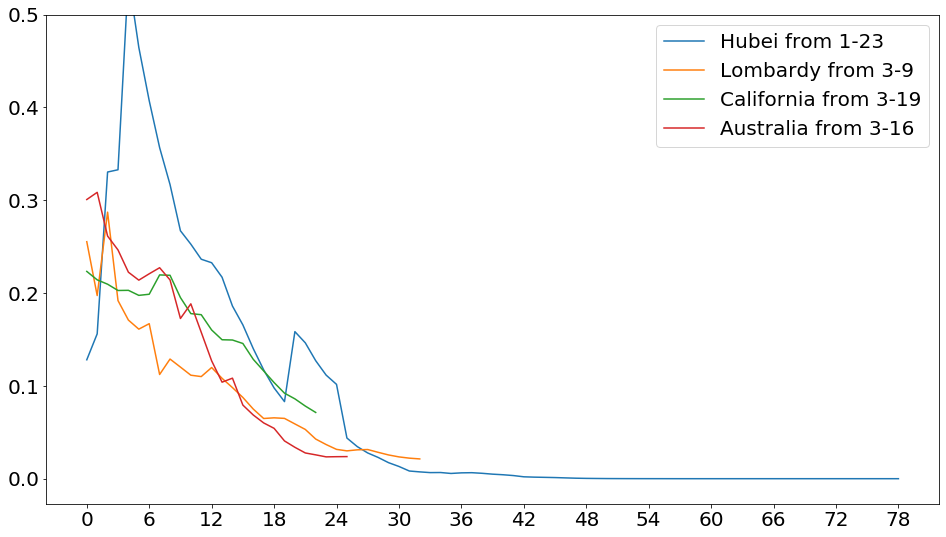

In [111]:


fig, ax = plt.subplots(nrows=1, ncols=1, sharey=True, figsize=(16,9))

# ax.set_yscale('log')
ax.plot(focus.Hubei_r.values[3:], label='Hubei from 1-23')
ax.plot(focus.Lombardy_r.values[49:], label='Lombardy from 3-9')
ax.plot(focus.California_r.values[59:], label='California from 3-19')
ax.plot(focus.Austria_r.values[56:], label='Australia from 3-16')

ax.set_ylim(top=0.5)
# ax.axvline(x=5)

ax.legend(fontsize=20)
ax.tick_params(labelsize=20)
ax.xaxis.set_major_locator(plt.MaxNLocator(15))

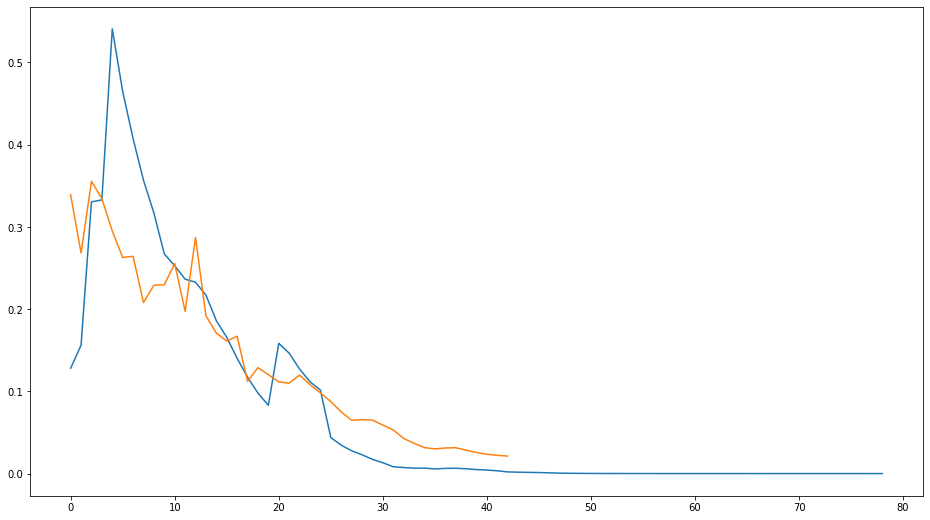

In [118]:
fig, ax = plt.subplots(nrows=1, ncols=1, sharey=True, figsize=(16,9))

# ax.set_yscale('log')
ax.plot(focus.Hubei_r.values[3:], label='Hubei from 1-23')
ax.plot(focus.Lombardy_r.values[39:], label='Lombardy from 3-9')

# Regional Dynamics

In [103]:
s = '1nhZ0LaPdxgniyJa22MpqgQxUM88AIgSgJagyyA-VjGU'
gid = '&gid=1476893770'
path = 'https://docs.google.com/spreadsheets/d/' + s + '/export?format=csv&id=' + s + gid

df = pd.read_csv(path, skiprows=[1]).set_index(['Italy'])

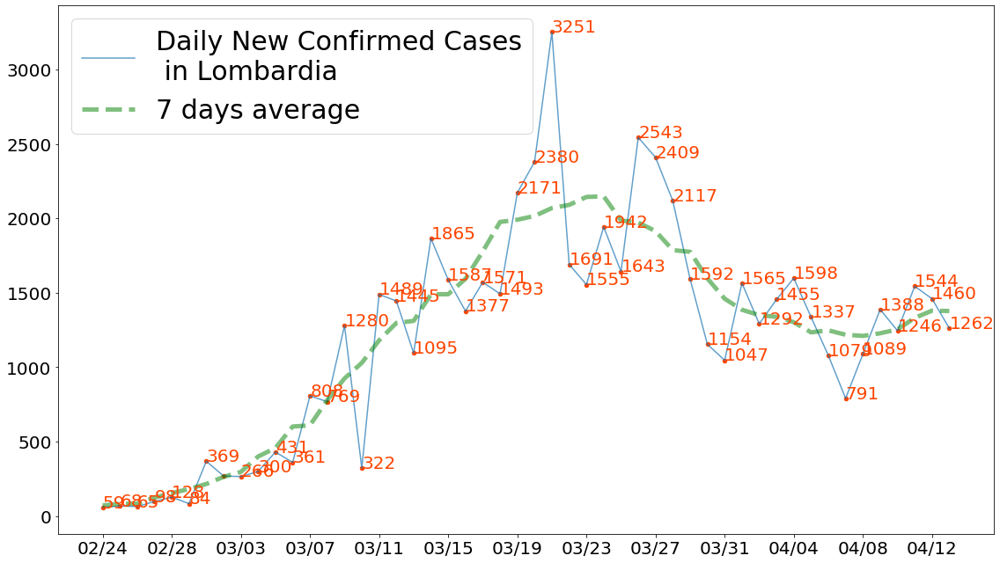

In [77]:
focus = df.iloc[:,:21].clip(lower=0)
focus['time'] = pd.to_datetime(focus.index)
focus.index = focus.time.dt.strftime('%m/%d')
focus.drop('time',axis=1,inplace=True)

offset = 5
date = '_4_15'
country = 'Lombardia'

focus = focus[[country]][offset:]

fig, ax=plt.subplots(nrows=1, ncols=1, figsize=(16,9))
ax.plot(focus.index, focus[country], label='Daily New Confirmed Cases\n in ' + country, alpha=0.7)
ax.scatter(focus.index, focus[country], c='orangered',s=20, label='')

# average
window = 7
focus['average'] = focus[country].rolling(window=window, min_periods=1, center=True).mean()
ax.plot(focus.index, focus.average, 'g--', lw=5, alpha=0.5, label='%d days average'%window)

for i, v in enumerate(focus[country]):
    if v > 0 and v not in [5974,4050,5210,4668,3590,6549,3836,3951,3148,19444,4056,32829,29595,5267,7967,6969,5051,
                          7846,7947,6824,4790,29861,17821,5526,432,323,1119,1175,582,270,196,163,1178,1028,1289,1617,
                          1991,2926,1192,958,591]:
        ax.text(focus.index[i], v+0.3, str(int(v)), color='orangered', fontsize=20)

# ax.set_yscale('log')
ax.tick_params(labelsize=20)
ax.legend(loc=0, fontsize=30)

plt.tight_layout()
ax.xaxis.set_major_locator(plt.MaxNLocator(15))
ax.format_xdata = mdates.DateFormatter('%m-%d')

# plt.savefig(r'figures/%s.png'% (country+date), dpi=600)

Text(16.5, 300, 'Northern Italy lockdown')

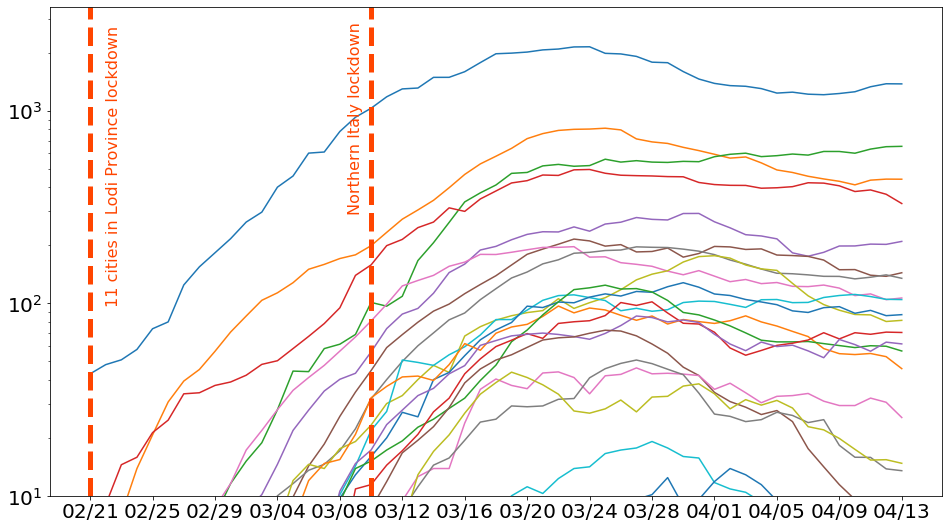

In [141]:
s = '1nhZ0LaPdxgniyJa22MpqgQxUM88AIgSgJagyyA-VjGU'
gid = '&gid=1476893770'
path = 'https://docs.google.com/spreadsheets/d/' + s + '/export?format=csv&id=' + s + gid

df = pd.read_csv(path, skiprows=[1]).set_index(['Italy'])

focus = df.iloc[2:,:21].clip(lower=0)
focus['time'] = pd.to_datetime(focus.index)
focus.index = focus.time.dt.strftime('%m/%d')
focus.drop('time',axis=1,inplace=True)

fig, ax=plt.subplots(nrows=1, ncols=1, figsize=(16,9))

for i in list(focus):
    ax.plot(focus[i].rolling(window=window, min_periods=1, center=True).mean(), label=i)
ax.set_yscale('log')
ax.set_ylim(bottom=10)
ax.xaxis.set_major_locator(plt.MaxNLocator(15))
# ax.legend()
ax.tick_params(labelsize=20)

ax.axvline(x=0, lw=5, ls='--', color='orangered')
ax.axvline(x=18, lw=5, ls='--', color='orangered')

ax.annotate('11 cities in Lodi Province lockdown', xy=(1,100), color='orangered', rotation=90, fontsize=16)
ax.annotate('Northern Italy lockdown', xy=(16.5,300), color='orangered', rotation=90, fontsize=16)

Text(0.2, 700, 'Wuhan lockdown')

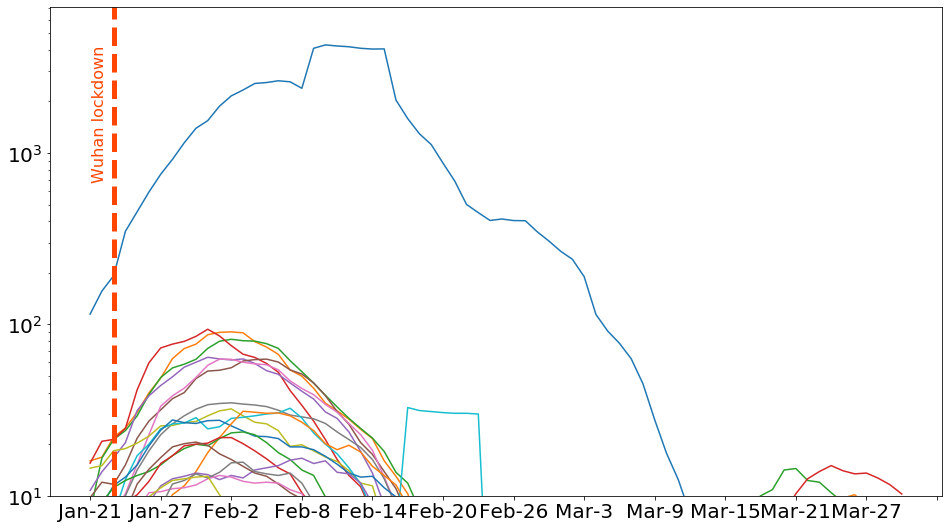

In [150]:
s = '1nhZ0LaPdxgniyJa22MpqgQxUM88AIgSgJagyyA-VjGU'
gid = '&gid=48820'
path = 'https://docs.google.com/spreadsheets/d/' + s + '/export?format=csv&id=' + s + gid

df = pd.read_csv(path, skiprows=[0]).set_index('Unnamed: 0').iloc[:,35:66].dropna(how='all')

focus = df.copy()
fig, ax=plt.subplots(nrows=1, ncols=1, figsize=(16,9))

for i in list(focus):
    ax.plot(focus[i].rolling(window=window, min_periods=1, center=True).mean(), label=i)
ax.set_yscale('log')
ax.set_ylim(bottom=10)
ax.xaxis.set_major_locator(plt.MaxNLocator(15))
# ax.legend()
ax.tick_params(labelsize=20)
ax.axvline(x=2, lw=5, ls='--', color='orangered')
ax.annotate('Wuhan lockdown', xy=(0.2,700), color='orangered', rotation=90, fontsize=16)

# Incubation distribution

In [34]:
import seaborn as sns
sample = np.random.weibull(a=2.04, size=10000000) / 0.103

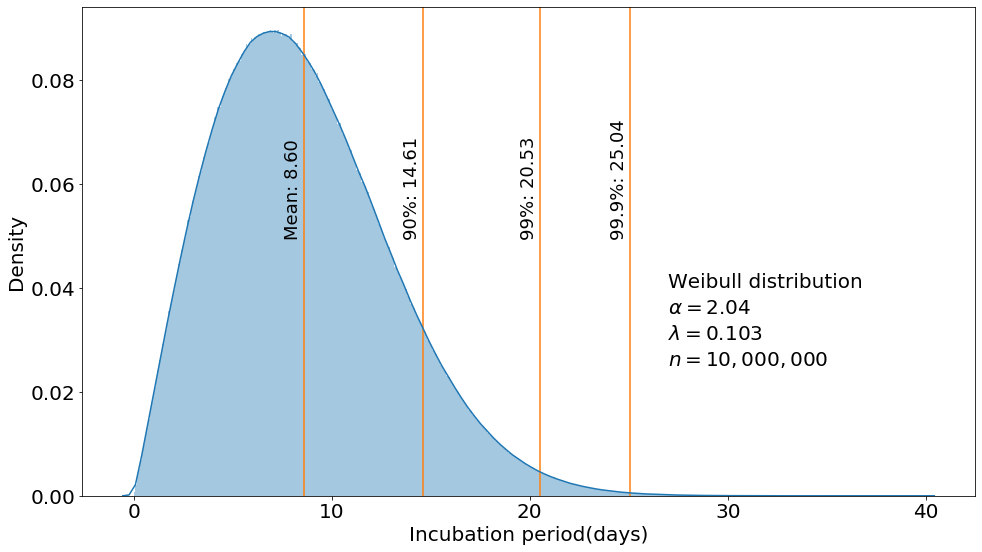

In [35]:
fig, ax = plt.subplots(figsize=(16,9))
ax.tick_params(labelsize=20)
ax.set_xlabel('Incubation period(days)', fontsize=20)
ax.set_ylabel('Density', fontsize=20)

ax.axvline(x=sample.mean(), c='C1')
ax.annotate('Mean: %.2f'%sample.mean(), xy=(sample.mean()-1, 0.05), rotation=90, fontsize=18)

ax.axvline(x=np.percentile(sample, 90), c='C1')
ax.annotate('90%: '+'%.2f'%np.percentile(sample, 90), xy=(np.percentile(sample, 90)-1, 0.05), rotation=90, fontsize=18)

ax.axvline(x=np.percentile(sample, 99), c='C1')
ax.annotate('99%: ' + '%.2f'%np.percentile(sample, 99), xy=(np.percentile(sample, 99)-1, 0.05), rotation=90, fontsize=18)

ax.axvline(x=np.percentile(sample, 99.9), c='C1')
ax.annotate('99.9%: ' + '%.2f'%np.percentile(sample, 99.9), xy=(np.percentile(sample, 99.9)-1, 0.05), rotation=90, fontsize=18)

ax.annotate('Weibull distribution', xy=(27,0.04), fontsize=20)
ax.annotate(r'$\alpha = 2.04$', xy=(27,0.035), fontsize=20)
ax.annotate(r'$\lambda = 0.103$', xy=(27,0.03), fontsize=20)
ax.annotate(r'$n  = 10,000,000$', xy=(27,0.025), fontsize=20)

sns.distplot(sample, ax=ax, bins=500)
plt.savefig('figures/Weibull distribution')

# Wikipedia

In [154]:
import requests

In [156]:
website_url = requests.get('https://en.wikipedia.org/wiki/2020_coronavirus_pandemic_in_Canada').text

In [173]:
from bs4 import BeautifulSoup
soup = BeautifulSoup(website_url,'lxml')
My_table = soup.find('table',{'class':'wikitable', 'style':'text-align:center; font-size:85%;'})
links = My_table.findAll('a')

In [175]:
My_table

<table class="wikitable" style="text-align:center; font-size:85%;">
<caption><span class="nowrap"><a class="mw-selflink selflink">COVID-19 cases in Canada</a> by province and territory(<div class="plainlinks hlist navbar mini"><ul><li class="nv-view"><a href="/wiki/Template:2019%E2%80%9320_coronavirus_pandemic_data/Canada_medical_cases" title="Template:2019–20 coronavirus pandemic data/Canada medical cases"><abbr title="View this template">v</abbr></a></li><li class="nv-talk"><a href="/wiki/Template_talk:2019%E2%80%9320_coronavirus_pandemic_data/Canada_medical_cases" title="Template talk:2019–20 coronavirus pandemic data/Canada medical cases"><abbr title="Discuss this template">t</abbr></a></li><li class="nv-edit"><a class="external text" href="https://en.wikipedia.org/w/index.php?title=Template:2019%E2%80%9320_coronavirus_pandemic_data/Canada_medical_cases&amp;action=edit"><abbr title="Edit this template">e</abbr></a></li></ul></div>)</span>
<p class="mw-empty-elt"></p></caption>
<tbo

# Greece and Spain comparison

In [13]:
confirm = pd.read_csv('data/JH/confirm_agg.csv').set_index('Country/Region').T
confirm['time'] = pd.to_datetime(confirm.index)
confirm.index = confirm.time.dt.strftime('%m/%d')

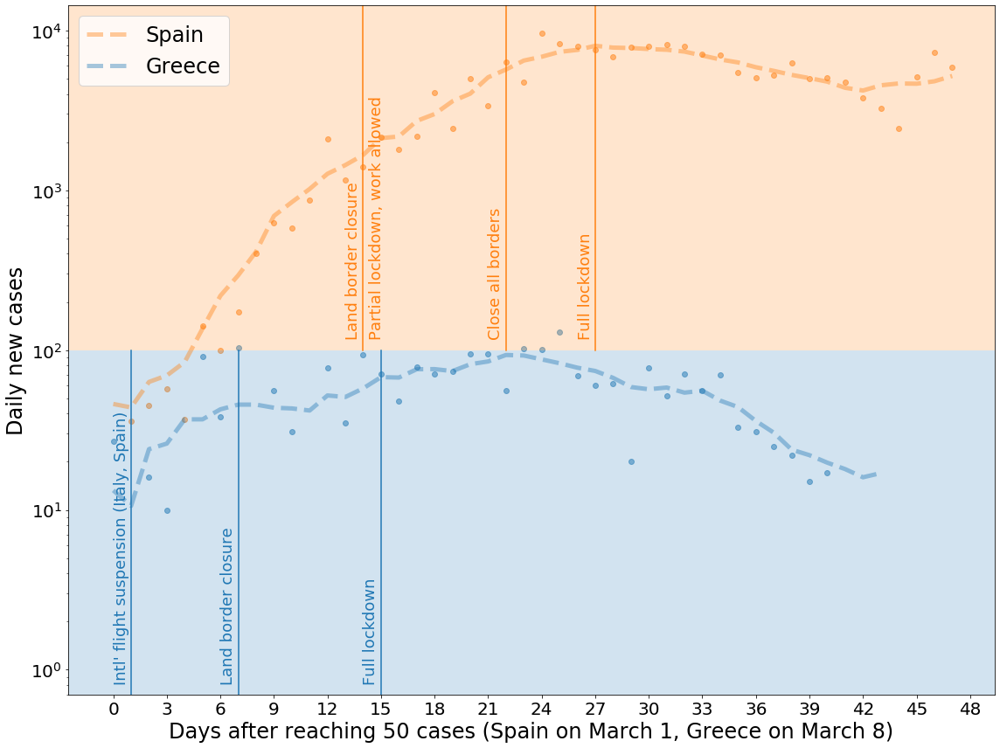

In [245]:
focus = confirm[['Greece','Spain']].copy().iloc[39:]
for i in list(focus):
    focus[i] = focus[i] - focus[i].shift(1)
    
offset = -7
focus['Greece'] = focus['Greece'].shift(offset)
focus = focus.reset_index(drop=True)
    
fig, ax=plt.subplots(nrows=1, ncols=1, figsize=(16,12), sharex=True)

ax.scatter(x=focus.index, y=focus['Spain'], color='C1', alpha=0.5)
ax.plot(focus.index, focus['Spain'].rolling(window=7, min_periods=1, center=True).mean(), color='C1', ls='--', lw=5, alpha=0.4, label='Spain')

ax.scatter(x=focus.index, y=focus['Greece'], color='C0', alpha=0.5)
ax.plot(focus.index, focus['Greece'].rolling(window=7, min_periods=1, center=True).mean(), color='C0', ls='--', lw=5, alpha=0.4, label='Greece')


ax.set_yscale('log')
# ax.plot(focus.index, focus['Spain'], 'o--', label='Daily Cases in Spain', alpha=0.7)

plt.axhspan(ymin=0.5, ymax=100, facecolor='C0', alpha=0.2)
plt.axhspan(ymin=100, ymax=14285, facecolor='C1', alpha=0.2)

# Spain
# ax.axvline(x=16, ymin=0.5, color='C1')
# ax.annotate('School closure', xy=(15,123), rotation=90, color='C1', fontsize=18)

# ax.axvline(x=17, ymin=0.5, color='C1')
# ax.annotate('Limit gathering', xy=(16,123), rotation=90, color='C1', fontsize=18)

ax.axvline(x=14, ymin=0.5, color='C1')
ax.annotate('Land border closure', xy=(13,123), rotation=90, color='C1', fontsize=18)

# ax.axvline(x=23, ymin=0.5, color='C1')
ax.annotate('Partial lockdown, work allowed', xy=(14.3,123), rotation=90, color='C1', fontsize=18)

ax.axvline(x=22, ymin=0.5, color='C1')
ax.annotate('Close all borders', xy=(21,123), rotation=90, color='C1', fontsize=18)

ax.axvline(x=27, ymin=0.5, color='C1')
ax.annotate('Full lockdown', xy=(26,123), rotation=90, color='C1', fontsize=18)


# Greece
ax.axvline(x=8+offset, ymax=0.5)
ax.annotate('Intl\' flight suspension (Italy, Spain)', xy=(7+offset,0.85), rotation=90, color='C0', fontsize=18)

# ax.axvline(x=18, ymax=0.5)
# ax.annotate('School closure', xy=(17,0.85), rotation=90, color='C0', fontsize=18)

# ax.axvline(x=20, ymax=0.5)
# ax.annotate('Limit gathering', xy=(19,0.85), rotation=90, color='C0', fontsize=18)

ax.axvline(x=14+offset, ymax=0.5)
ax.annotate('Land border closure', xy=(13+offset,0.85), rotation=90, color='C0', fontsize=18)

ax.axvline(x=22+offset, ymax=0.5)
ax.annotate('Full lockdown', xy=(21+offset,0.85), rotation=90, color='C0', fontsize=18)


# ax.set_xlim(left=7)
ax.set_ylabel('Daily new cases', fontsize=24)
ax.set_xlabel('Days after reaching 50 cases (Spain on March 1, Greece on March 8)', fontsize=24)
ax.set_ylim(bottom=0.7, top=14285)
ax.tick_params(labelsize=20)
ax.legend(loc=0, fontsize=24)
ax.xaxis.set_major_locator(plt.MaxNLocator(20))
ax.format_xdata = mdates.DateFormatter('%m-%d')
plt.tight_layout()
plt.savefig('figures/Greece_Spain.png', dpi=600)

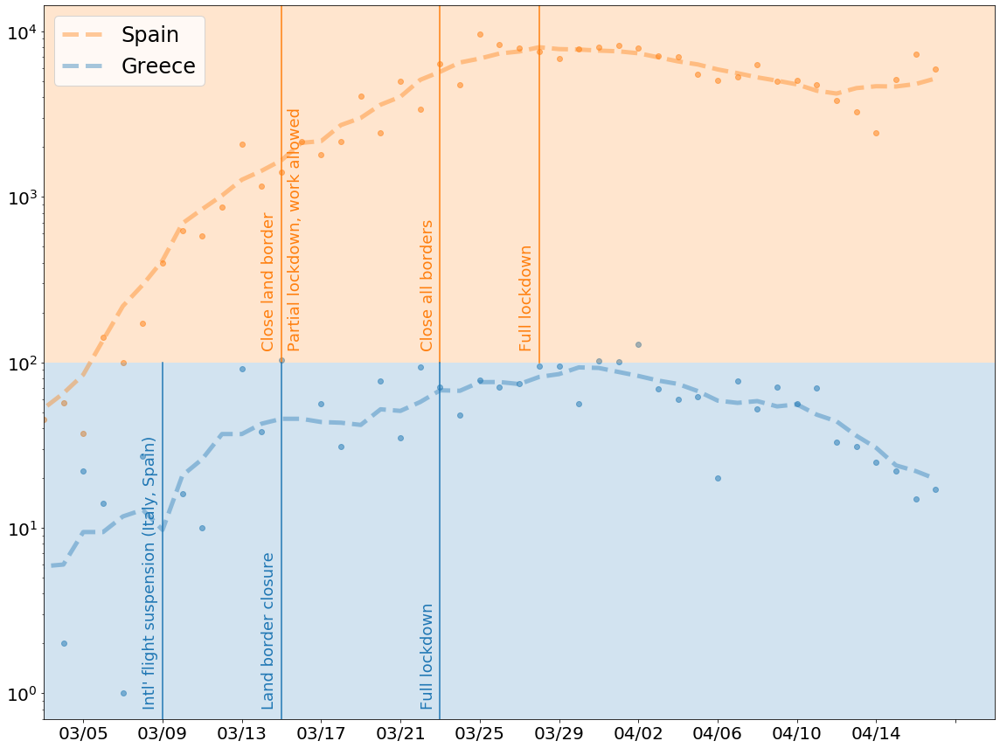

In [244]:
focus = confirm[['Greece','Spain']].copy().iloc[31:]
for i in list(focus):
    focus[i] = focus[i] - focus[i].shift(1)
    
    
fig, ax=plt.subplots(nrows=1, ncols=1, figsize=(16,12), sharex=True)

ax.scatter(x=focus.index, y=focus['Spain'], color='C1', alpha=0.5)
ax.plot(focus.index, focus['Spain'].rolling(window=7, min_periods=1, center=True).mean(), color='C1', ls='--', lw=5, alpha=0.4, label='Spain')

ax.scatter(x=focus.index, y=focus['Greece'], color='C0', alpha=0.5)
ax.plot(focus.index, focus['Greece'].rolling(window=7, min_periods=1, center=True).mean(), color='C0', ls='--', lw=5, alpha=0.4, label='Greece')


ax.set_yscale('log')
# ax.plot(focus.index, focus['Spain'], 'o--', label='Daily Cases in Spain', alpha=0.7)

plt.axhspan(ymin=0.5, ymax=100, facecolor='C0', alpha=0.2)
plt.axhspan(ymin=100, ymax=14285, facecolor='C1', alpha=0.2)

# Spain
# ax.axvline(x=16, ymin=0.5, color='C1')
# ax.annotate('School closure', xy=(15,123), rotation=90, color='C1', fontsize=18)

# ax.axvline(x=17, ymin=0.5, color='C1')
# ax.annotate('Limit gathering', xy=(16,123), rotation=90, color='C1', fontsize=18)

ax.axvline(x=22, ymin=0.5, color='C1')
ax.annotate('Close land border', xy=(21,123), rotation=90, color='C1', fontsize=18)

# ax.axvline(x=23, ymin=0.5, color='C1')
ax.annotate('Partial lockdown, work allowed', xy=(22.3,123), rotation=90, color='C1', fontsize=18)

ax.axvline(x=30, ymin=0.5, color='C1')
ax.annotate('Close all borders', xy=(29,123), rotation=90, color='C1', fontsize=18)

ax.axvline(x=35, ymin=0.5, color='C1')
ax.annotate('Full lockdown', xy=(34,123), rotation=90, color='C1', fontsize=18)

# Greece
ax.axvline(x=16, ymax=0.5)
ax.annotate('Intl\' flight suspension (Italy, Spain)', xy=(15,0.85), rotation=90, color='C0', fontsize=18)

# ax.axvline(x=18, ymax=0.5)
# ax.annotate('School closure', xy=(17,0.85), rotation=90, color='C0', fontsize=18)

# ax.axvline(x=20, ymax=0.5)
# ax.annotate('Limit gathering', xy=(19,0.85), rotation=90, color='C0', fontsize=18)

ax.axvline(x=22, ymax=0.5)
ax.annotate('Land border closure', xy=(21,0.85), rotation=90, color='C0', fontsize=18)

ax.axvline(x=30, ymax=0.5)
ax.annotate('Full lockdown', xy=(29,0.85), rotation=90, color='C0', fontsize=18)


ax.set_xlim(left=10)
ax.set_ylim(bottom=0.7, top=14285)
ax.tick_params(labelsize=20)
ax.legend(loc=0, fontsize=24)
ax.xaxis.set_major_locator(plt.MaxNLocator(15))
ax.format_xdata = mdates.DateFormatter('%m-%d')
plt.tight_layout()
# plt.savefig('figures/Greece_Spain.png', dpi=600)

# Australia and New Zealand

In [256]:
confirm = pd.read_csv('data/JH/confirm_agg.csv').set_index('Country/Region').T
confirm['time'] = pd.to_datetime(confirm.index)
confirm.index = confirm.time.dt.strftime('%m/%d')

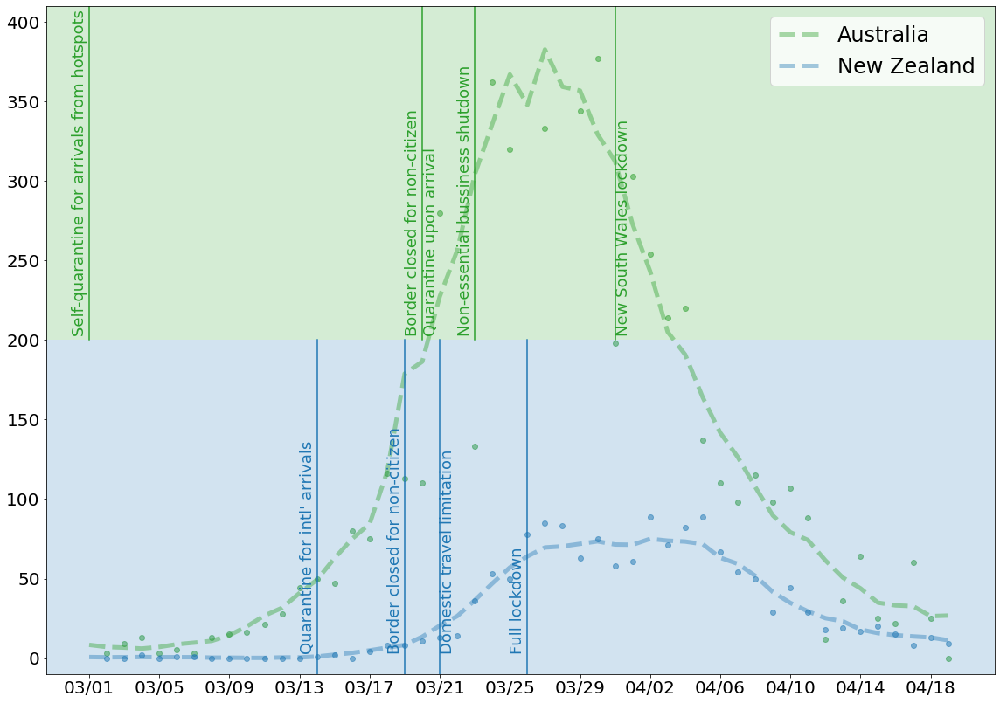

In [302]:
focus = confirm[['Australia','New Zealand']].copy().iloc[39:]
for i in list(focus):
    focus[i] = focus[i] - focus[i].shift(1)
    
    
fig, ax=plt.subplots(nrows=1, ncols=1, figsize=(16,12), sharex=True)

ax.scatter(x=focus.index, y=focus['Australia'], color='C2', alpha=0.5)
ax.plot(focus.index, focus['Australia'].rolling(window=7, min_periods=1, center=True).mean(), color='C2', ls='--', lw=5, alpha=0.4, label='Australia')

ax.scatter(x=focus.index, y=focus['New Zealand'], color='C0', alpha=0.5)
ax.plot(focus.index, focus['New Zealand'].rolling(window=7, min_periods=1, center=True).mean(), color='C0', ls='--', lw=5, alpha=0.4, label='New Zealand')


# ax.set_yscale('log')
# ax.plot(focus.index, focus['Australia'], 'o--', label='Daily Cases in Spain', alpha=0.7)

plt.axhspan(ymin=-10, ymax=200, facecolor='C0', alpha=0.2)
plt.axhspan(ymin=200, ymax=410, facecolor='C2', alpha=0.2)

# Australia
ax.axvline(x=0, ymin=0.5, color='C2')
ax.annotate('Self-quarantine for arrivals from hotspots', xy=(-1,205), rotation=90, color='C2', fontsize=18)

ax.axvline(x=19, ymin=0.5, color='C2')
ax.annotate('Border closed for non-citizen\nQuarantine upon arrival', xy=(18,205), rotation=90, color='C2', fontsize=18)

ax.axvline(x=22, ymin=0.5, color='C2')
ax.annotate('Non-essential bussiness shutdown', xy=(21,205), rotation=90, color='C2', fontsize=18)

ax.axvline(x=30, ymin=0.5, color='C2')
ax.annotate('New South Wales lockdown', xy=(30,205), rotation=90, color='C2', fontsize=18)


# New Zealand
ax.axvline(x=13, ymax=0.5)
ax.annotate('Quarantine for intl\' arrivals', xy=(12,5), rotation=90, color='C0', fontsize=18)

ax.axvline(x=18, ymax=0.5)
ax.annotate('Border closed for non-citizen', xy=(17,5), rotation=90, color='C0', fontsize=18)

ax.axvline(x=20, ymax=0.5)
ax.annotate('Domestic travel limitation', xy=(20,5), rotation=90, color='C0', fontsize=18)

ax.axvline(x=25, ymax=0.5)
ax.annotate('Full lockdown', xy=(24,5), rotation=90, color='C0', fontsize=18)

# ax.set_xlim(left=10)
ax.set_ylim(bottom=-10, top=410)
ax.tick_params(labelsize=20)
ax.legend(loc=0, fontsize=24)
ax.xaxis.set_major_locator(plt.MaxNLocator(15))
ax.format_xdata = mdates.DateFormatter('%m-%d')
plt.tight_layout()

plt.savefig('figures/Aus_NZ.png', dpi=600)

# New York vs rest of US

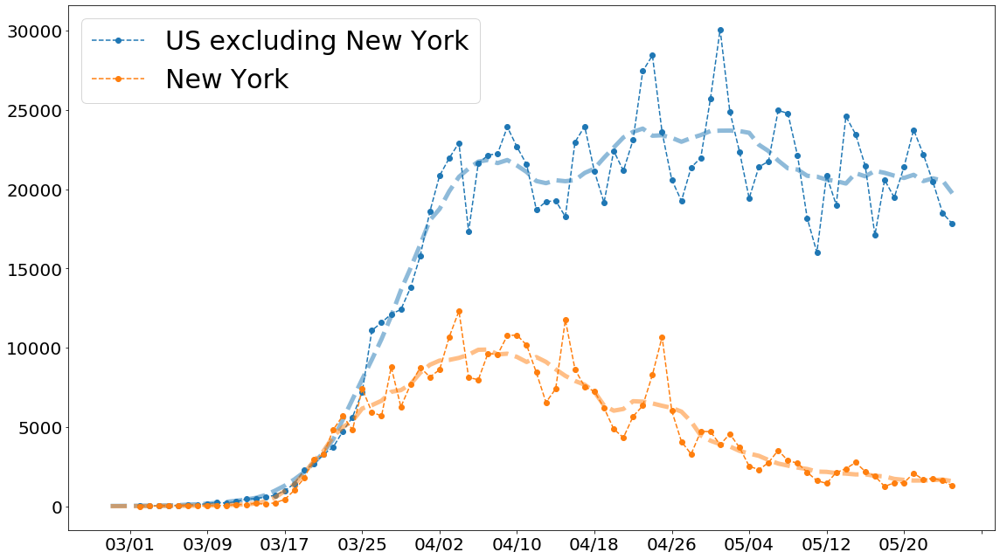

In [340]:
df = pd.read_csv('data/Country detailed/US by state.csv').set_index('date')
df['time'] = pd.to_datetime(df.index)
df.index = df.time.dt.strftime('%m/%d')
df.drop('time', axis=1, inplace=True)

fig, ax=plt.subplots(nrows=1, ncols=1, figsize=(16,9))
for i in list(df):
    df[i] = df[i] - df[i].shift(1)
ax.plot(df.sum(axis=1)-df['New York'], 'o--', label='US excluding New York')

window = 7
df['average1'] = (df.sum(axis=1)-df['New York']).rolling(window=window, min_periods=1, center=True).mean()
ax.plot(df.index, df.average1, color='C0',ls='--', lw=5, alpha=0.5)

ax.plot(df['New York'], 'o--', label='New York')
df['average2'] = (df['New York']).rolling(window=window, min_periods=1, center=True).mean()
ax.plot(df.index, df.average2, color='C1',ls='--', lw=5, alpha=0.5)

ax.tick_params(labelsize=20)
ax.legend(loc="upper left", fontsize=30)

plt.tight_layout()
ax.xaxis.set_major_locator(plt.MaxNLocator(15))
# plt.savefig('figures/NY_vs_US.png' , dpi=600)

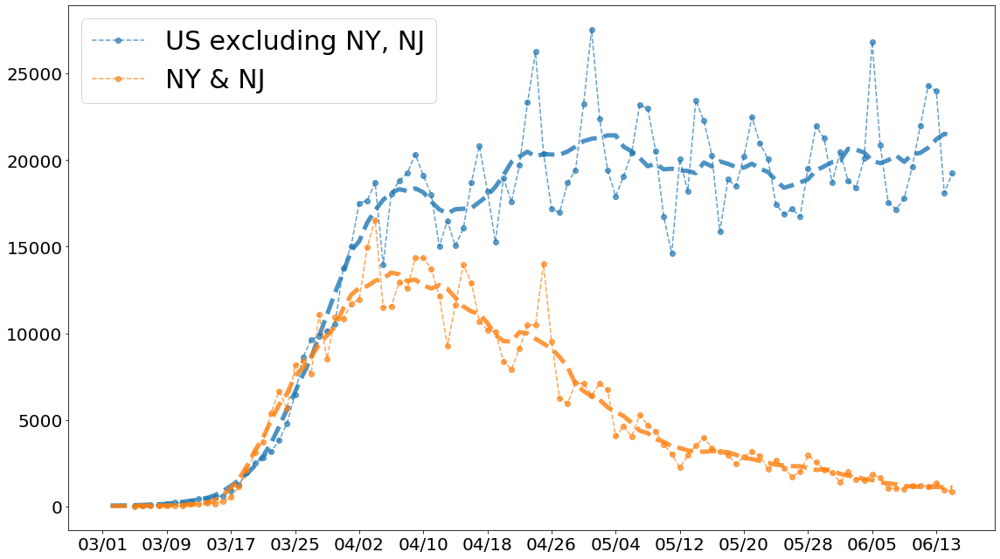

In [7]:
df = pd.read_csv('data/Country detailed/US by state.csv').set_index('date')
df['time'] = pd.to_datetime(df.index)
df.index = df.time.dt.strftime('%m/%d')
df.drop('time', axis=1, inplace=True)

fig, ax=plt.subplots(nrows=1, ncols=1, figsize=(16,9))
for i in list(df):
    df[i] = df[i] - df[i].shift(1)
ax.plot(df.sum(axis=1)-df['New York']-df['New Jersey'], 'o--', label='US excluding NY, NJ',  alpha=0.7)

window = 7
df['average1'] = (df.sum(axis=1)-df['New York']-df['New Jersey']).rolling(window=window, min_periods=1, center=True).mean()
ax.plot(df.index, df.average1, color='C0',ls='--', lw=5, alpha=0.8)

ax.plot(df['New York']+df['New Jersey'], 'o--', label='NY & NJ', alpha=0.7)
df['average2'] = (df['New York']+df['New Jersey']).rolling(window=window, min_periods=1, center=True).mean()
ax.plot(df.index, df.average2, color='C1',ls='--', lw=5, alpha=0.8)

ax.tick_params(labelsize=20)
ax.legend(loc="upper left", fontsize=30)

plt.tight_layout()
ax.xaxis.set_major_locator(plt.MaxNLocator(15))
# plt.savefig('figures/NYNJ_vs_US.png' , dpi=100)

# US by party

In [260]:
# by 2016 election
dem = 'Hawaii,Vermont,New York,Rhode Island,Maryland,Massachusetts,California,Delaware,Illinois,Connecticut,New Jersey,Maine,Oregon,Washington,Michigan,New Mexico,Minnesota,Nevada,Wisconsin,Colorado,Iowa,New Hampshire,Pennsylvania'.split(',')
rep = 'Ohio,Florida,North Carolina,Indiana,Missouri,Georgia,Arizona,Montana,South Carolina,Mississippi,North Dakota,South Dakota,Texas,Alaska,Kansas,Louisiana,Nebraska,Tennessee,Kentucky,West Virginia,Alabama,Arkansas,Idaho,Oklahoma,Utah,Wyoming'.split(',')

In [262]:
# by current governor
dem = 'Hawaii,New York,Rhode Island,California,Delaware,Connecticut,Oregon,Washington,Minnesota,Colorado,Pennsylvania,Virginia,Montana,Louisiana,West Virginia,North Carolina'.split(',')
rep = 'Vermont,New Hampshire,Missouri,Maryland,Massachusetts,Illinois,New Jersey,Maine,Michigan,New Mexico,Nevada,Wisconsin,Iowa,Ohio,Florida,Indiana,Georgia,Arizona,South Carolina,Mississippi,North Dakota,South Dakota,Texas,Kansas,Nebraska,Tennessee,Kentucky,Alabama,Arkansas,Idaho,Oklahoma,Utah,Wyoming'.split(',')

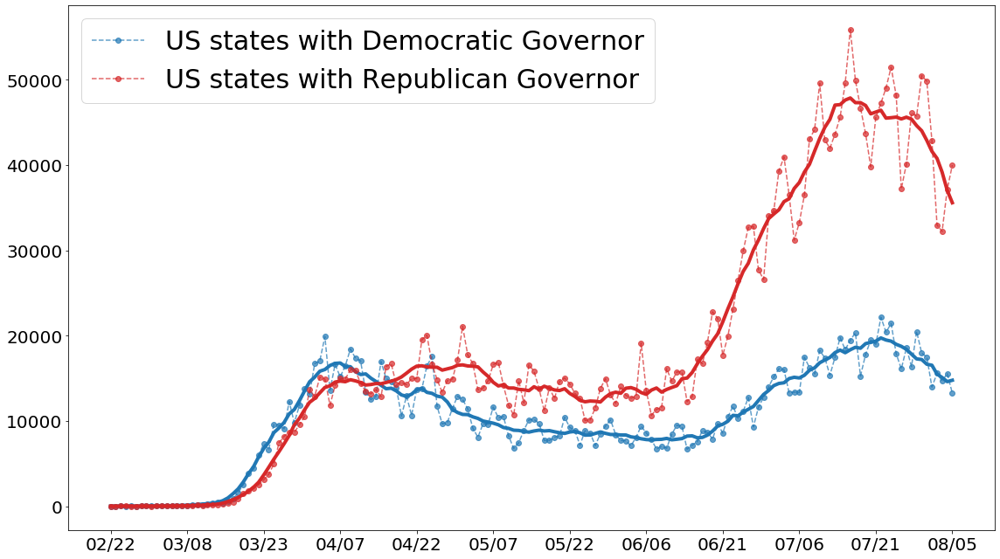

In [263]:
df = pd.read_csv('data/Country detailed/US by state.csv').set_index('date')
df['time'] = pd.to_datetime(df.index)
df.index = df.time.dt.strftime('%m/%d')
df.drop('time', axis=1, inplace=True)

fig, ax=plt.subplots(nrows=1, ncols=1, figsize=(16,9))
for i in list(df):
    df[i] = df[i] - df[i].shift(1)
    
ax.plot(df[dem].sum(axis=1), 'o--', label='US states with Democratic Governor',  alpha=0.7)
ax.plot(df[dem].sum(axis=1).rolling(window=7, min_periods=1, center=True).mean(), lw=4, c='C0', alpha=3)

ax.plot(df[rep].sum(axis=1), 'o--', label='US states with Republican Governor',  alpha=0.7, c='C3')
ax.plot(df[rep].sum(axis=1).rolling(window=7, min_periods=1, center=True).mean(), lw=4, c='C3', alpha=3)

ax.tick_params(labelsize=20)
ax.legend(loc="upper left", fontsize=30)

plt.tight_layout()
ax.xaxis.set_major_locator(plt.MaxNLocator(15))
# plt.savefig('figures/Dem_Rep.png' , dpi=600)

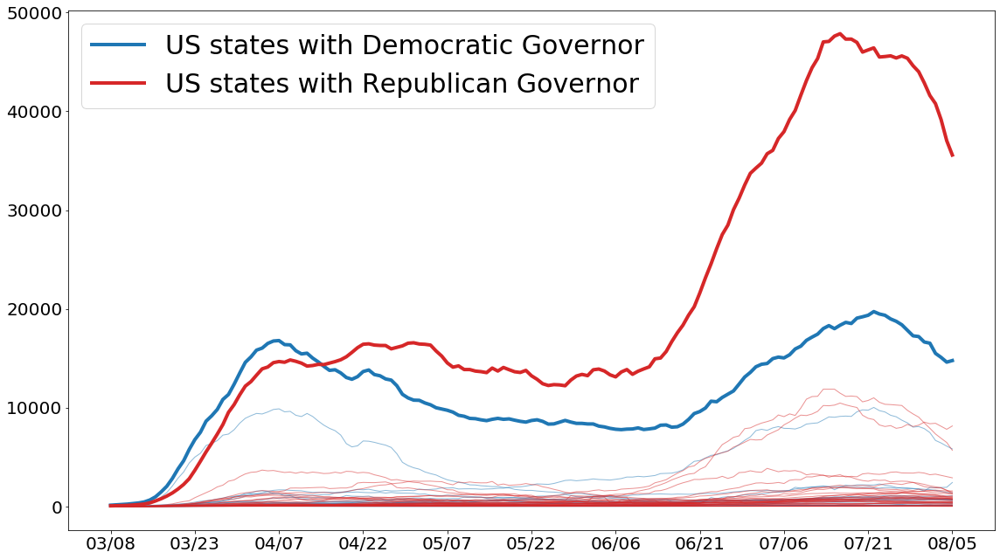

In [266]:
df = pd.read_csv('data/Country detailed/US by state.csv').set_index('date').iloc[15:]
df['time'] = pd.to_datetime(df.index)
df.index = df.time.dt.strftime('%m/%d')
df.drop('time', axis=1, inplace=True)

fig, ax=plt.subplots(nrows=1, ncols=1, figsize=(16,9))
for i in list(df):
    df[i] = df[i] - df[i].shift(1)
    
ax.plot(df[dem].sum(axis=1).rolling(window=7, min_periods=1, center=True).mean(), lw=4, c='C0',label='US states with Democratic Governor')
for i in dem:
    ax.plot(df[i].rolling(window=7, min_periods=1, center=True).mean(), lw=1,c='C0', alpha=0.5)


ax.plot(df[rep].sum(axis=1).rolling(window=7, min_periods=1, center=True).mean(), lw=4, c='C3',label='US states with Republican Governor')
for i in rep:
    ax.plot(df[i].rolling(window=7, min_periods=1, center=True).mean(), lw=1,c='C3', alpha=0.5)

# ax.set_yscale('log')
ax.tick_params(labelsize=20)
ax.legend(loc="upper left", fontsize=30)
# ax.set_yscale('log')

plt.tight_layout()
ax.xaxis.set_major_locator(plt.MaxNLocator(15))
# plt.savefig('figures/NYNJ_vs_US.png' , dpi=600)

# States dymamics

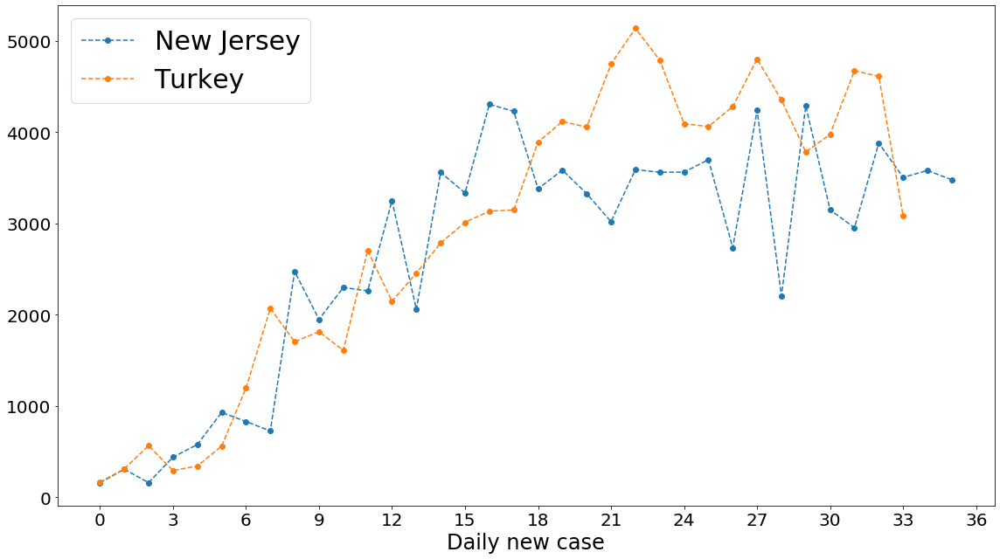

In [517]:
state = 'New Jersey'
country = 'Turkey'
threshold = 100
window = 7

df = pd.read_csv('data/Country detailed/US by state.csv').set_index('date')
s1 = df[state]

df = pd.read_csv('data/JH/confirm_agg.csv').set_index('Country/Region').T
s2  = df[country]

s1 = s1 - s1.shift(1)
s2 = s2 - s2.shift(1)

s1 = s1.fillna(0).astype(int).values
s2 = s2.fillna(0).astype(int).values
s1 = s1[s1>threshold]
s2 = s2[s2>threshold]

fig, ax=plt.subplots(nrows=1, ncols=1, figsize=(16,9))

ax.plot(s1, 'o--', label=state)
ax.plot(s2, 'o--', label=country)
# ax.set_yscale('log')

ax.tick_params(labelsize=20)
ax.legend(loc="upper left", fontsize=30)
ax.set_xlabel('Days after more cumulates more than 100 cases', fontsize=24)
ax.set_xlabel('Daily new case', fontsize=24)

plt.tight_layout()
ax.xaxis.set_major_locator(plt.MaxNLocator(15))
plt.savefig('figures/Daily_misc_4_23.png', dpi=600)

# Country comparisons

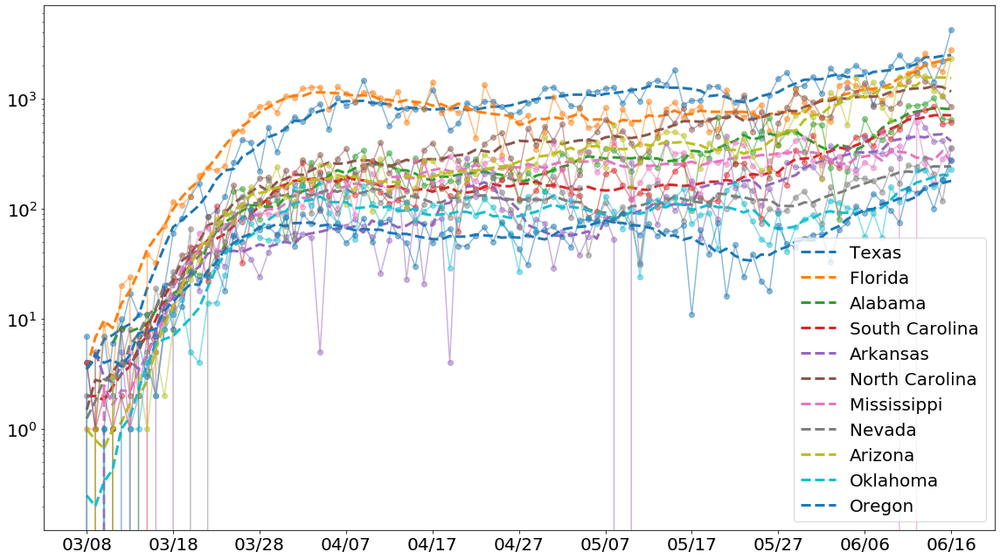

In [56]:
df = pd.read_csv('data/Country detailed/US by state.csv').set_index('date')
for i in list(df):
    df[i] = df[i] - df[i].shift(1)

focus = df[[
    'Texas',
    'Florida',
    'Alabama',
    'South Carolina',
    'Arkansas',
    'North Carolina',
    'Mississippi',
    'Nevada',
    'Arizona',
    'Oklahoma',
#     'New Mexico',
    'Oregon'
]].copy().iloc[15:]
focus['time'] = pd.to_datetime(focus.index)
focus.index = focus.time.dt.strftime('%m/%d')
focus.drop('time',axis=1,inplace=True)

# focus.at['04/24','Ecuador'] = np.nan
# focus.at['04/30','Peru'] = 3045
# focus.at['04/30','Brazil'] = 6019
# focus.at['04/30','Chile'] = 1138
# focus.at['04/30','Mexico'] = 1047

fig, ax=plt.subplots(nrows=1, ncols=1, figsize=(16,9))

for j, i in enumerate(list(focus)):
    ax.plot(focus[i], 'o-',c='C'+str(j), alpha=0.5)
    ax.plot(focus[i].rolling(window=7, min_periods=1, center=True).mean(), lw=3, ls='--', label=i)
    

ax.set_yscale('log')
ax.tick_params(labelsize=20)
ax.legend(loc=0, fontsize=20)

plt.tight_layout()
ax.xaxis.set_major_locator(plt.MaxNLocator(12))
plt.savefig('figures/States_comparison_6_17a.png', dpi=600)

In [5]:
state_names = ["Alaska", "Alabama", "Arkansas", "American Samoa", "Arizona", "California", "Colorado", "Connecticut", "District ", "of Columbia", "Delaware", "Florida", "Georgia", "Guam", "Hawaii", "Iowa", "Idaho", "Illinois", "Indiana", "Kansas", "Kentucky", "Louisiana", "Massachusetts", "Maryland", "Maine", "Michigan", "Minnesota", "Missouri", "Mississippi", "Montana", "North Carolina", "North Dakota", "Nebraska", "New Hampshire", "New Jersey", "New Mexico", "Nevada", "New York", "Ohio", "Oklahoma", "Oregon", "Pennsylvania", "Puerto Rico", "Rhode Island", "South Carolina", "South Dakota", "Tennessee", "Texas", "Utah", "Virginia", "Virgin Islands", "Vermont", "Washington", "Wisconsin", "West Virginia", "Wyoming"]
state_names

['Alaska',
 'Alabama',
 'Arkansas',
 'American Samoa',
 'Arizona',
 'California',
 'Colorado',
 'Connecticut',
 'District ',
 'of Columbia',
 'Delaware',
 'Florida',
 'Georgia',
 'Guam',
 'Hawaii',
 'Iowa',
 'Idaho',
 'Illinois',
 'Indiana',
 'Kansas',
 'Kentucky',
 'Louisiana',
 'Massachusetts',
 'Maryland',
 'Maine',
 'Michigan',
 'Minnesota',
 'Missouri',
 'Mississippi',
 'Montana',
 'North Carolina',
 'North Dakota',
 'Nebraska',
 'New Hampshire',
 'New Jersey',
 'New Mexico',
 'Nevada',
 'New York',
 'Ohio',
 'Oklahoma',
 'Oregon',
 'Pennsylvania',
 'Puerto Rico',
 'Rhode Island',
 'South Carolina',
 'South Dakota',
 'Tennessee',
 'Texas',
 'Utah',
 'Virginia',
 'Virgin Islands',
 'Vermont',
 'Washington',
 'Wisconsin',
 'West Virginia',
 'Wyoming']

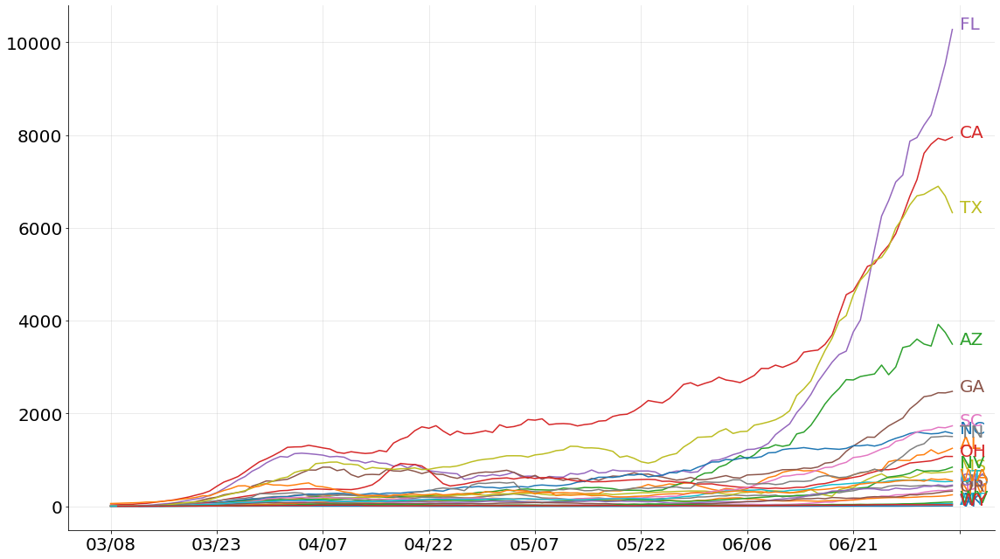

In [53]:
df = pd.read_csv('data/Country detailed/US by state.csv').set_index('date')
for i in list(df):
    df[i] = df[i] - df[i].shift(1)

focus = df[[
'Alaska',
 'Alabama',
#  'Arkansas',
 'Arizona',
 'California',
#  'Colorado',
#  'Connecticut',
#  'District of Columbia',
#  'Delaware',
 'Florida',
 'Georgia',
#  'Guam',
#  'Hawaii',
#  'Iowa',
 'Idaho',
#  'Illinois',
#  'Indiana',
#  'Kansas',
#  'Kentucky',
#  'Louisiana',
#  'Massachusetts',
#  'Maryland',
#  'Maine',
#  'Michigan',
#  'Minnesota',
 'Missouri',
 'Mississippi',
 'Montana',
 'North Carolina',
#  'North Dakota',
#  'Nebraska',
#  'New Hampshire',
#  'New Jersey',
 'New Mexico',
 'Nevada',
#  'New York',
 'Ohio',
 'Oklahoma',
 'Oregon',
#  'Pennsylvania',
#  'Puerto Rico',
#  'Rhode Island',
 'South Carolina',
#  'South Dakota',
 'Tennessee',
 'Texas',
 'Utah',
#  'Virginia',
 'Virgin Islands',
#  'Vermont',
 'Washington',
#  'Wisconsin',
 'West Virginia',
 'Wyoming'    
]].copy().iloc[15:]
focus['time'] = pd.to_datetime(focus.index)
focus.index = focus.time.dt.strftime('%m/%d')
focus.drop('time',axis=1,inplace=True)

# focus.at['04/24','Ecuador'] = np.nan
# focus.at['04/30','Peru'] = 3045
# focus.at['04/30','Brazil'] = 6019
# focus.at['04/30','Chile'] = 1138
# focus.at['04/30','Mexico'] = 1047

fig, ax=plt.subplots(nrows=1, ncols=1, figsize=(16,9))

for j, i in enumerate(list(focus)):
#     ax.plot(focus[i], 'o-',c='C'+str(j), alpha=0.5)
    ax.plot(focus[i].rolling(window=7, min_periods=1, center=True).mean(), label=i)
    ax.annotate(us_state_abbrev[i], 
                xy=(len(focus), focus[i].rolling(window=7, min_periods=1, center=True).mean().values[-1]), 
                fontsize=20, c='C'+str(j))

# ax.set_yscale('log')
# ax.set_ylim(bottom=50)
ax.tick_params(labelsize=20)
# ax.legend(loc=0, fontsize=20)
ax.grid(alpha=0.)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

plt.tight_layout()
ax.grid(alpha=0.3)
ax.xaxis.set_major_locator(plt.MaxNLocator(12))
# plt.savefig('figures/States_comparison_7_3.png', dpi=100)

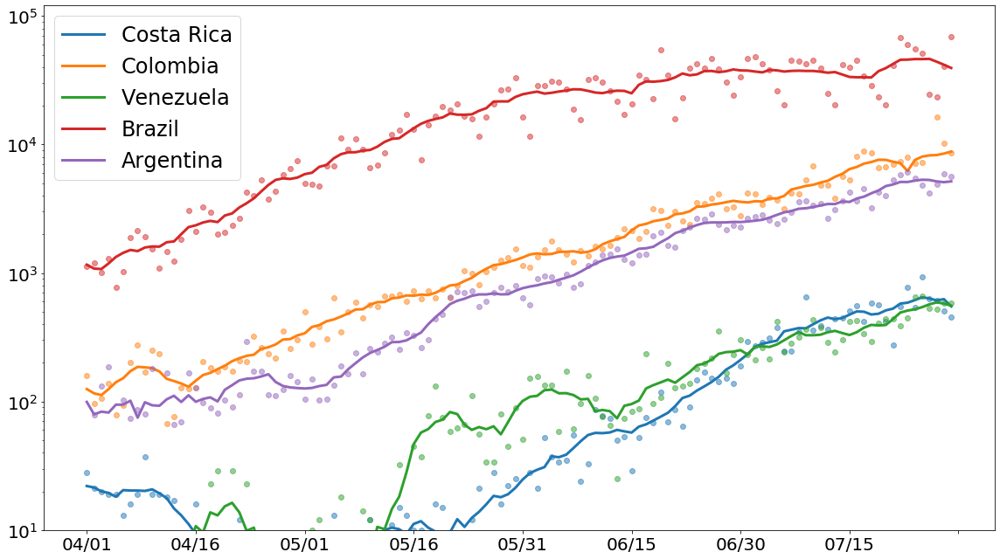

In [124]:
df = pd.read_csv('data/JH/confirm_agg.csv').set_index('Country/Region').T
for i in list(df):
    df[i] = df[i].diff()

focus = df[[
#     'Mexico',
#  'Guatemala',
#  'Honduras',
#  'El Salvador',
 
 'Costa Rica',
 
 'Colombia',
 'Venezuela',
#   'Bolivia',
 
 
 
 'Brazil',
 'Argentina', 
#  'Dominican Republic',
 
 

  
 
 
]].copy().iloc[70:]
focus['time'] = pd.to_datetime(focus.index)
focus.index = focus.time.dt.strftime('%m/%d')
focus.drop('time',axis=1,inplace=True)

# focus.at['06/10','India'] = 12375
# focus.at['06/10','Bangladesh'] = 3190
# focus.at['06/10','Pakistan'] = 5385


fig, ax=plt.subplots(nrows=1, ncols=1, figsize=(16,9))

for j, i in enumerate(list(focus)):
    ax.plot(focus[i], 'o',c='C'+str(j), alpha=0.5)
    ax.plot(focus[i].rolling(window=7, min_periods=1, center=True).mean(), lw=3, ls='-', label=i)
    
ax.set_yscale('log')
ax.set_ylim(bottom=10)
ax.tick_params(labelsize=20)
ax.legend(loc=0, fontsize=24)

plt.tight_layout()
ax.xaxis.set_major_locator(plt.MaxNLocator(12))
plt.savefig('figures/Daily_misc_7_30a.png', dpi=100)

In [49]:
africa

['South Africa',
 'Algeria',
 'Cameroon',
 'Burkina Faso',
 "Cote d'Ivoire",
 'Mauritius',
 'Nigeria',
 'Senegal',
 'Ghana',
 'Niger',
 'Congo (Kinshasa)',
 'Kenya',
 'Guinea',
 'Rwanda',
 'Madagascar',
 'Uganda',
 'Congo (Brazzaville)',
 'Togo',
 'Ethiopia',
 'Zambia',
 'Mali',
 'Guinea-Bissau',
 'Eritrea',
 'Tanzania',
 'Benin',
 'Gabon',
 'Equatorial Guinea',
 'Namibia',
 'Angola',
 'Liberia',
 'Seychelles',
 'Mozambique',
 'Eswatini',
 'Zimbabwe',
 'Central African Republic',
 'Chad',
 'Cabo Verde',
 'Mauritania',
 'Sierra Leone',
 'Botswana',
 'Gambia',
 'Malawi',
 'Sao Tome and Principe',
 'Burundi',
 'South Sudan',
 'Western Sahara',
 'Comoros',
 'Lesotho']

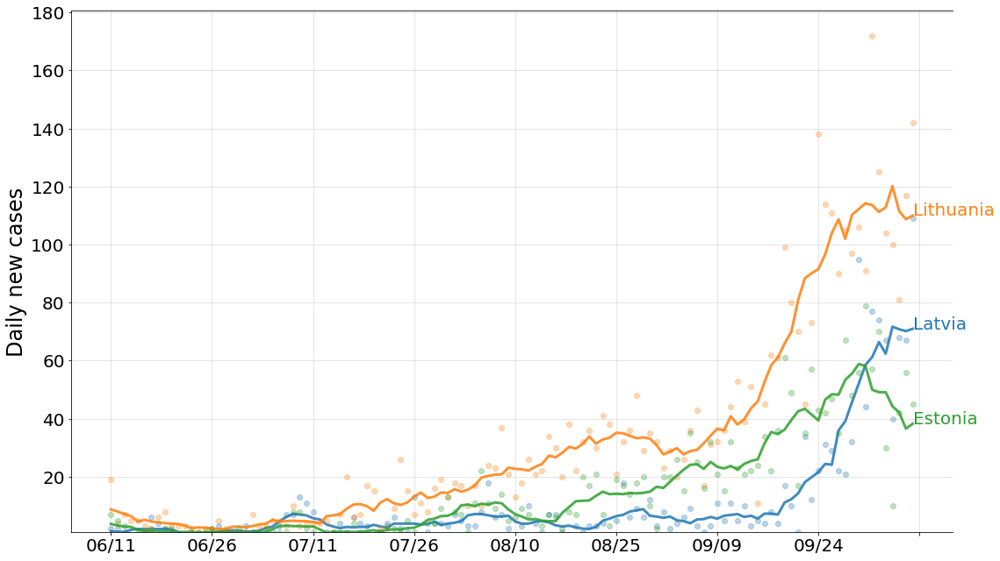

In [55]:
df = pd.read_csv('data/JH/confirm_agg.csv').set_index('Country/Region').T.diff()

df = df.iloc[-120:]
focus = df[
    
[
   
    'Latvia',
    'Lithuania',
    'Estonia',
#     'Sweden'
    

 
 ]

].copy()
focus['time'] = pd.to_datetime(focus.index)
focus.index = focus.time.dt.strftime('%m/%d')
focus.drop('time',axis=1,inplace=True)

fig, ax=plt.subplots(nrows=1, ncols=1, figsize=(16,9))

for j, i in enumerate(list(focus)):
    ax.plot(focus[i], 'o',alpha=0.3, c='C'+str(j))
    ax.plot(focus[i].rolling(window=7, min_periods=1, center=True).mean(), lw=3, ls='-', label=i, alpha=0.85, c='C'+str(j))
    ax.annotate(i, xy=(focus.index[-1], focus[i].rolling(window=7, min_periods=1, center=True).mean().values[-1]), fontsize=20, c='C'+str(j))
    
# ax.set_yscale('log')
ax.set_ylim(bottom=1)
ax.tick_params(labelsize=20)
# ax.legend(loc=0, fontsize=24)
ax.grid(alpha=0.4)
ax.set_ylabel('Daily new cases', fontsize=24)
ax.set_ylim()
ax.spines['right'].set_visible(False)

plt.tight_layout()
ax.xaxis.set_major_locator(plt.MaxNLocator(12))
plt.savefig('figures/Daily_misc_10_9.png', dpi=100)

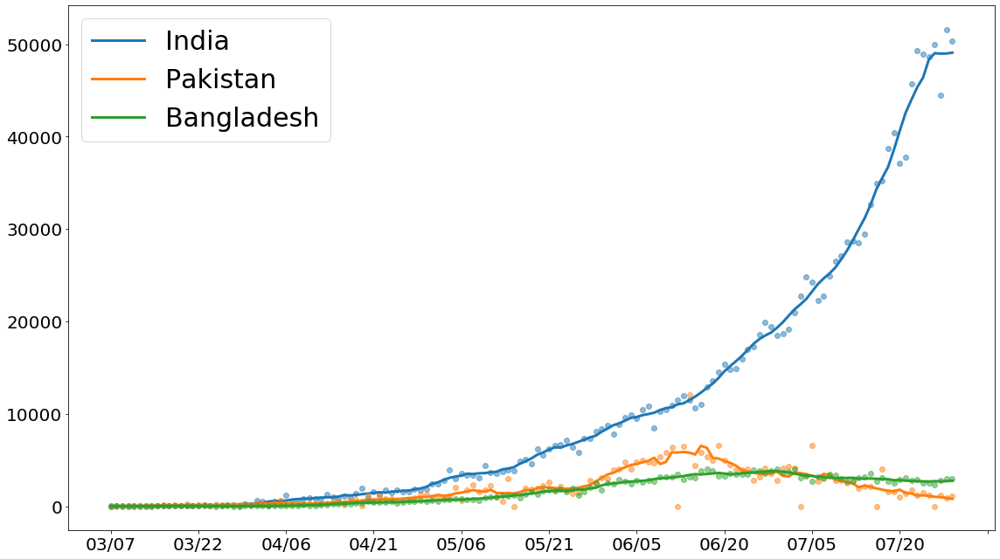

In [126]:
df = pd.read_csv('data/JH/confirm_agg.csv').set_index('Country/Region').T.diff()

focus = df[[
    'India',
    'Pakistan',
    'Bangladesh',
#     'Armenia',
    
#     'Afghanistan',
#     'Tajikistan',
#     'Azerbaijan',    
#     'Qatar',
#     'Kuwait',
#     'Saudi Arabia',
#     'Bahrain'
    
#     'South Africa',
#     'Egypt',
#     'Nigeria',
#     'Ghana',
#     'Algeria',    
#     'Kenya',
#     'Liberia',
    
#     'Albania',
# #     'Bosnia and Herzegovina',
#     'Bulgaria',
#     'Croatia',

# #     'Kosovo',
#     'Montenegro',
#     'North Macedonia',
#     'Romania',
#     'Serbia',
#     'Slovenia'
    
#     'Seychelles',
]].copy().iloc[45:]
focus['time'] = pd.to_datetime(focus.index)
focus.index = focus.time.dt.strftime('%m/%d')
focus.drop('time',axis=1,inplace=True)

# focus.at['05/02','Russia'] = 9623
# focus.at['05/02','Ukraine'] = 550
# focus.at['05/02','Kazakhstan'] = 260

fig, ax=plt.subplots(nrows=1, ncols=1, figsize=(16,9))

for j, i in enumerate(list(focus)):
    ax.plot(focus[i], 'o',c='C'+str(j), alpha=0.5)
    ax.plot(focus[i].rolling(window=7, min_periods=1, center=True).mean(), lw=3, ls='-', label=i)
    
# ax.set_yscale('log')
ax.tick_params(labelsize=20)
ax.legend(loc=0, fontsize=30)

plt.tight_layout()
ax.xaxis.set_major_locator(plt.MaxNLocator(12))
# plt.savefig('figures/Daily_misc_7_11.png', dpi=100)

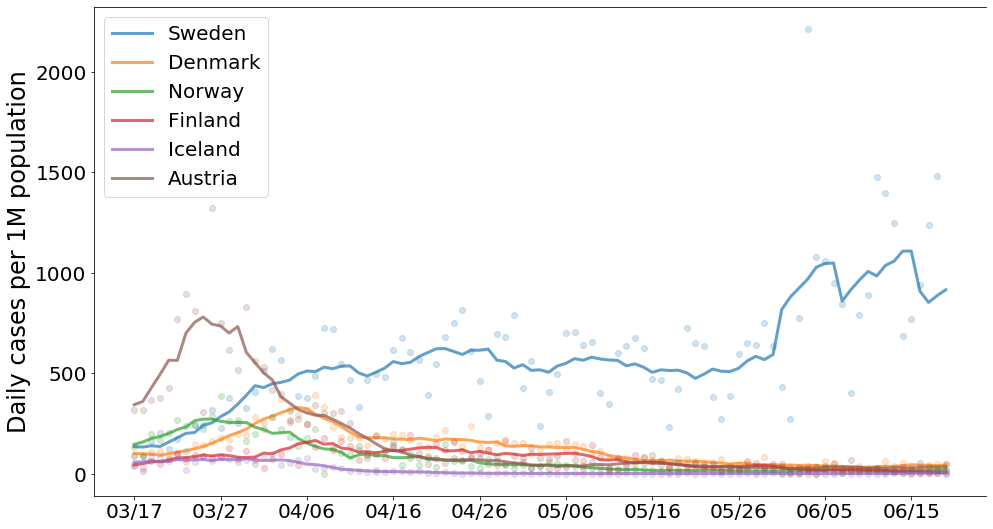

In [167]:
df = pd.read_csv('data/JH/confirm_agg.csv').set_index('Country/Region').T
for i in list(df):
    df[i] = df[i] - df[i].shift(1)

focus = df[[
    'Sweden',
    'Denmark',
    'Norway',
    
    'Finland',
    'Iceland',
    'Austria'
]].copy().iloc[55:]
focus['time'] = pd.to_datetime(focus.index)
focus.index = focus.time.dt.strftime('%m/%d')
focus.drop('time',axis=1,inplace=True)

pop = pd.Series({
    'Denmark':5.806,
    'Norway':5.368,
    'Sweden':10.23,
    'Finland':5.518,
    'Iceland':0.364,
    'Greece':10.72,
    'Albania':2.846,
    'Slovakia':5.25,
    'Estonia':1.32,
})


fig, ax=plt.subplots(nrows=1, ncols=1, figsize=(16,9))

for j, i in enumerate(list(focus)):
    ax.plot(focus[i], 'o',c='C'+str(j), alpha=0.2)
    ax.plot(focus[i].rolling(window=7, min_periods=1, center=True).mean(), lw=3, ls='-', label=i, alpha=0.7)
    



ax.set_ylabel('Daily cases per 1M population', fontsize=24)

ax.tick_params(labelsize=20)
ax.legend(loc=2, fontsize=20)
ax.xaxis.set_major_locator(plt.MaxNLocator(12))
ax.spines['right'].set_visible(False)

# ax2 = plt.axes([0.50, 0.45, 0.4, 0.4])

# for j, i in enumerate(list(focus)[1:]):
# #     ax2.plot(focus[i][-21:]/pop[i], 'o',c='C'+str(j+1), alpha=0.5)
#     ax2.plot(focus[i][-21:].rolling(window=7, min_periods=1, center=True).mean()/pop[i], lw=3, ls='-', label=i, alpha=0.7,c='C'+str(j+1))

# ax2.xaxis.set_major_locator(plt.MaxNLocator(5))

# ax2.spines['right'].set_visible(False)
# ax2.spines['top'].set_visible(False)

# ax2.tick_params(labelsize=20)
# plt.savefig('figures/Daily_misc_5_12.png', dpi=600)

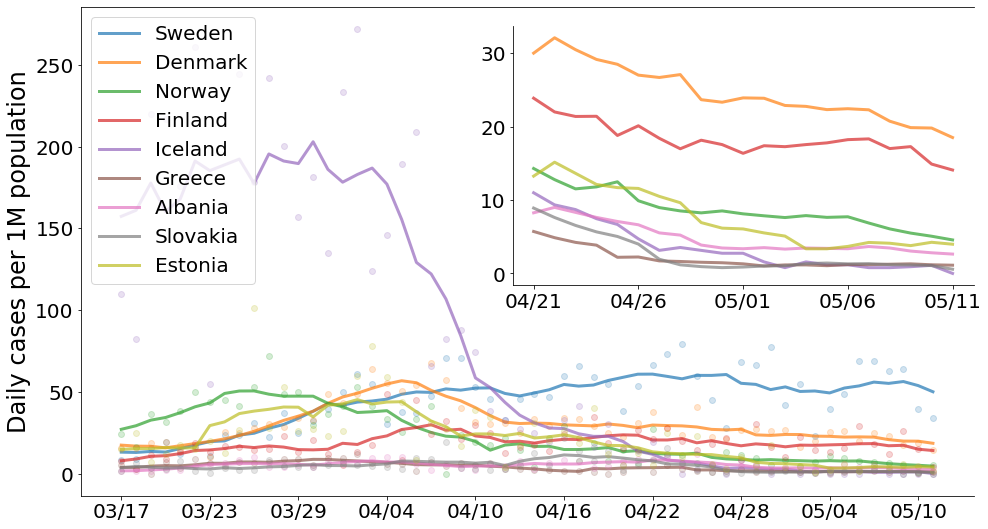

In [200]:
df = pd.read_csv('data/JH/confirm_agg.csv').set_index('Country/Region').T
for i in list(df):
    df[i] = df[i] - df[i].shift(1)

focus = df[[
    'Sweden',
    'Denmark',
    'Norway',
    
    'Finland',
    'Iceland',
    'Greece',
    'Albania',
    'Slovakia',
    'Estonia'
]].copy().iloc[55:]
focus['time'] = pd.to_datetime(focus.index)
focus.index = focus.time.dt.strftime('%m/%d')
focus.drop('time',axis=1,inplace=True)

pop = pd.Series({
    'Denmark':5.806,
    'Norway':5.368,
    'Sweden':10.23,
    'Finland':5.518,
    'Iceland':0.364,
    'Greece':10.72,
    'Albania':2.846,
    'Slovakia':5.25,
    'Estonia':1.32,
})


fig, ax=plt.subplots(nrows=1, ncols=1, figsize=(16,9))

for j, i in enumerate(list(focus)):
    ax.plot(focus[i]/pop[i], 'o',c='C'+str(j), alpha=0.2)
    ax.plot(focus[i].rolling(window=7, min_periods=1, center=True).mean()/pop[i], lw=3, ls='-', label=i, alpha=0.7)
    



ax.set_ylabel('Daily cases per 1M population', fontsize=24)

ax2 = plt.axes([0.50, 0.45, 0.4, 0.4])

for j, i in enumerate(list(focus)[1:]):
#     ax2.plot(focus[i][-21:]/pop[i], 'o',c='C'+str(j+1), alpha=0.5)
    ax2.plot(focus[i][-21:].rolling(window=7, min_periods=1, center=True).mean()/pop[i], lw=3, ls='-', label=i, alpha=0.7,c='C'+str(j+1))

ax.legend(loc=2, fontsize=20)
ax.xaxis.set_major_locator(plt.MaxNLocator(12))
ax2.xaxis.set_major_locator(plt.MaxNLocator(5))
ax.spines['right'].set_visible(False)
ax2.spines['right'].set_visible(False)
ax2.spines['top'].set_visible(False)
ax.tick_params(labelsize=20)
ax2.tick_params(labelsize=20)
# plt.savefig('figures/Daily_misc_5_12.png', dpi=600)

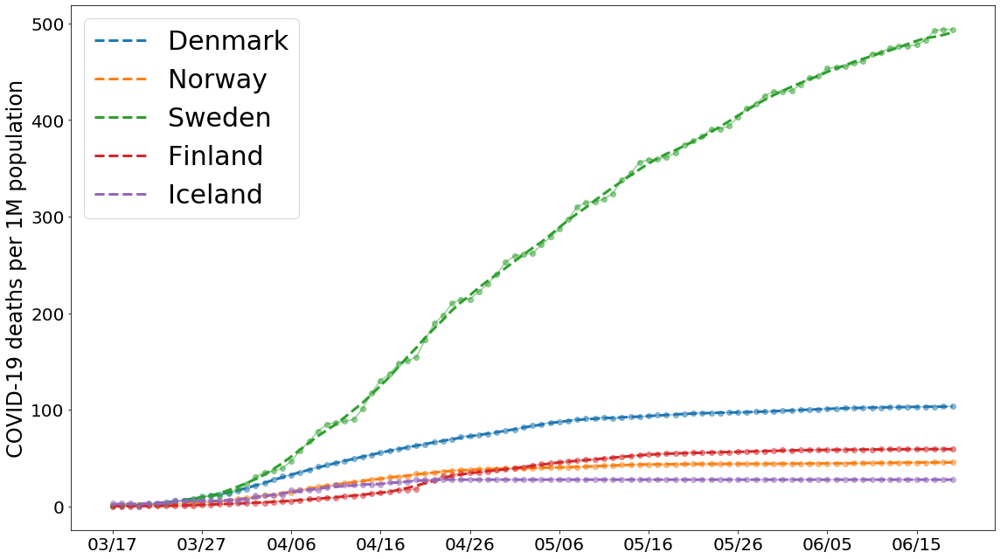

In [168]:
df = pd.read_csv('data/JH/death_agg.csv').set_index('Country/Region').T
# for i in list(df):
#     df[i] = df[i] - df[i].shift(1)

focus = df[[
    'Denmark',
    'Norway',
    'Sweden',
    'Finland',
    'Iceland'
]].copy().iloc[55:]
focus['time'] = pd.to_datetime(focus.index)
focus.index = focus.time.dt.strftime('%m/%d')
focus.drop('time',axis=1,inplace=True)

pop = pd.Series({'Denmark':5.806,
                'Norway':5.368,
                'Sweden':10.23,
                'Finland':5.518,
                'Iceland':0.364})


fig, ax=plt.subplots(nrows=1, ncols=1, figsize=(16,9))

for j, i in enumerate(list(focus)):
    ax.plot(focus[i]/pop[i], 'o-',c='C'+str(j), alpha=0.5)
    ax.plot(focus[i].rolling(window=7, min_periods=1, center=True).mean()/pop[i], lw=3, ls='--', label=i)
    

ax.tick_params(labelsize=20)
ax.legend(loc=0, fontsize=30)
ax.set_ylabel('COVID-19 deaths per 1M population', fontsize=24)

plt.tight_layout()
ax.xaxis.set_major_locator(plt.MaxNLocator(12))
# plt.savefig('figures/Daily_misc_5_12.png', dpi=600)

NameError: name 'window' is not defined

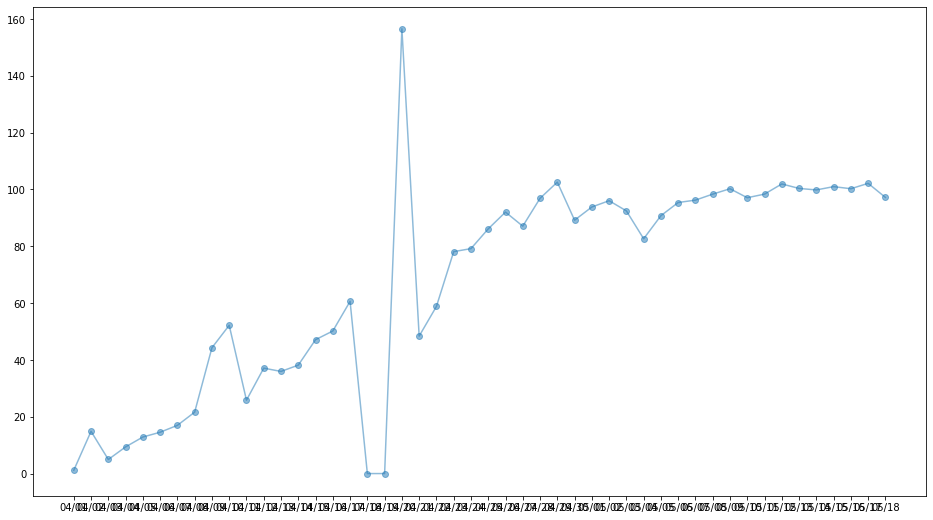

In [71]:
df = pd.read_csv('data/JH/confirm_agg.csv').set_index('Country/Region').T
for i in list(df):
    df[i] = df[i] - df[i].shift(1)

focus = df[[
    'Russia',
    'Belarus',
    'Ukraine',
    'Kazakhstan',
#     'Iceland'
]].copy().iloc[70:]
focus['time'] = pd.to_datetime(focus.index)
focus.index = focus.time.dt.strftime('%m/%d')
focus.drop('time',axis=1,inplace=True)

pop = pd.Series({'Russia':144.5,
                'Belarus':9.485,
                'Ukraine':41.98,
                'Kazakhstan':18.28,
                })


fig, ax=plt.subplots(nrows=1, ncols=1, figsize=(16,9))

for j, i in enumerate(list(focus)):
    ax.plot(focus[i]/pop[i], 'o-',c='C'+str(j), alpha=0.5)
    ax.plot(focus[i].rolling(window=window, min_periods=1, center=True).mean()/pop[i], lw=3, ls='--', label=i)
    

ax.tick_params(labelsize=20)
ax.legend(loc=2, fontsize=30)
ax.set_ylabel('Daily new cases per 1M population', fontsize=24)

plt.tight_layout()
ax.xaxis.set_major_locator(plt.MaxNLocator(12))
# plt.savefig('figures/Daily_misc_4_27.png', dpi=600)

# UK data try

In [58]:
df = pd.read_csv('https://raw.githubusercontent.com/tomwhite/covid-19-uk-data/master/data/covid-19-cases-uk.csv', date_parser='Date')
df = df[~((df['Area']=='Not Known') | (df['Area'] == 'Unknown'))]
df = df.pivot(index='Date',columns='Area',values='TotalCases').fillna(0)
df = df[np.argmax(focus.sum(axis=1)>1):]
df

Area,Aneurin Bevan,Antrim and Newtownabbey,Ards and North Down,"Armagh City, Banbridge and Craigavon","Armagh, Banbridge and Craigavon",Ayrshire and Arran,Barking and Dagenham,Barnet,Barnsley,Bath and North East Somerset,...,Western Isles,Westminster,Wigan,Wiltshire,Windsor and Maidenhead,Wirral,Wokingham,Wolverhampton,Worcestershire,York
Date,,,,,,,,,,,,,,,,,,,,,
2020-01-08,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2020-01-09,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2020-01-10,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2020-01-11,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2020-01-12,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-05-15,2393.0,360.0,307.0,469.0,0.0,964.0,488.0,1270.0,860.0,0.0,...,6.0,0.0,1106.0,503.0,279.0,1180.0,431.0,968.0,1337.0,436.0
2020-05-16,2401.0,366.0,311.0,478.0,0.0,966.0,489.0,1271.0,869.0,228.0,...,6.0,0.0,1117.0,507.0,0.0,1186.0,432.0,973.0,1342.0,437.0
2020-05-17,2401.0,366.0,311.0,478.0,0.0,974.0,0.0,1273.0,878.0,230.0,...,6.0,645.0,0.0,508.0,0.0,1187.0,0.0,974.0,0.0,439.0


In [155]:
focus = df.copy()
for i in list(focus):
    focus[i] = focus[i].diff()

In [156]:
focus.tail(10)

Area,Aneurin Bevan,Antrim and Newtownabbey,Ards and North Down,"Armagh City, Banbridge and Craigavon","Armagh, Banbridge and Craigavon",Ayrshire and Arran,Barking and Dagenham,Barnet,Barnsley,Bath and North East Somerset,...,Western Isles,Westminster,Wigan,Wiltshire,Windsor and Maidenhead,Wirral,Wokingham,Wolverhampton,Worcestershire,York
Date,,,,,,,,,,,,,,,,,,,,,
2020-04-27,20.0,0.0,0.0,0.0,0.0,16.0,3.0,6.0,17.0,2.0,...,0.0,5.0,24.0,5.0,2.0,17.0,3.0,24.0,19.0,13.0
2020-04-28,19.0,0.0,0.0,0.0,0.0,17.0,2.0,12.0,22.0,2.0,...,0.0,5.0,27.0,11.0,6.0,16.0,2.0,12.0,17.0,9.0
2020-04-29,17.0,0.0,0.0,0.0,0.0,7.0,2.0,12.0,14.0,1.0,...,0.0,8.0,13.0,16.0,4.0,15.0,7.0,36.0,17.0,19.0
2020-04-30,23.0,0.0,0.0,0.0,0.0,17.0,-454.0,9.0,9.0,1.0,...,0.0,18.0,9.0,6.0,2.0,6.0,10.0,8.0,12.0,12.0
2020-05-01,18.0,0.0,0.0,0.0,0.0,16.0,459.0,4.0,4.0,3.0,...,0.0,4.0,24.0,6.0,2.0,17.0,8.0,26.0,12.0,3.0
2020-05-02,45.0,0.0,0.0,0.0,0.0,15.0,1.0,4.0,3.0,2.0,...,0.0,3.0,11.0,10.0,1.0,11.0,5.0,1.0,14.0,6.0
2020-05-03,12.0,303.0,242.0,374.0,0.0,6.0,1.0,1.0,10.0,-217.0,...,0.0,-629.0,2.0,1.0,-261.0,3.0,-397.0,4.0,1.0,10.0
2020-05-04,6.0,3.0,7.0,18.0,0.0,19.0,1.0,0.0,4.0,217.0,...,0.0,629.0,0.0,0.0,261.0,0.0,397.0,0.0,0.0,0.0
2020-05-05,0.0,12.0,6.0,5.0,0.0,7.0,-462.0,-1224.0,-705.0,-217.0,...,0.0,-629.0,-818.0,-465.0,-261.0,-1056.0,-397.0,-887.0,-1201.0,-329.0


In [182]:
focus = df[df.iloc[-3].sort_values(ascending=False).index].copy()
for i in list(focus):
    focus[i] = focus[i].diff()

In [184]:
focus.to_clipboard()

In [4]:
england = pd.read_csv('https://raw.githubusercontent.com/tomwhite/covid-19-uk-data/master/data/covid-19-totals-england.csv').set_index('Date')
northern_ireland = pd.read_csv('https://raw.githubusercontent.com/tomwhite/covid-19-uk-data/master/data/covid-19-totals-northern-ireland.csv').set_index('Date')
scotland = pd.read_csv('https://raw.githubusercontent.com/tomwhite/covid-19-uk-data/master/data/covid-19-totals-scotland.csv').set_index('Date')
wales = pd.read_csv('https://raw.githubusercontent.com/tomwhite/covid-19-uk-data/master/data/covid-19-totals-wales.csv').set_index('Date')

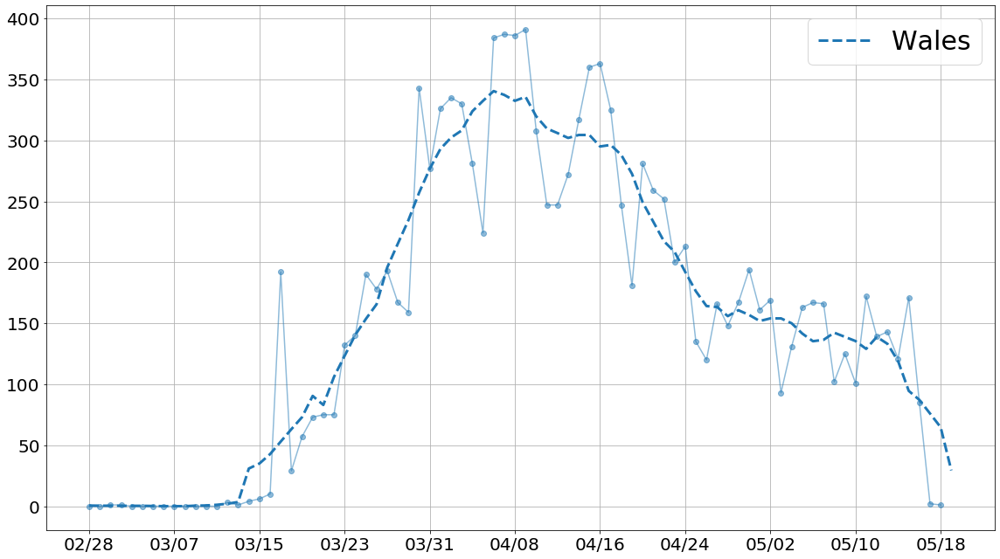

In [35]:
focus = pd.DataFrame({'England':england['ConfirmedCases'],
                     'Northern Ireland':northern_ireland['ConfirmedCases'],
                     'Scotland':scotland['ConfirmedCases'],
                     'Wales':wales['ConfirmedCases']}).diff().dropna(how='all').iloc[50:]
focus['time'] = pd.to_datetime(focus.index)
focus.index = focus.time.dt.strftime('%m/%d')
focus.drop('time',axis=1,inplace=True)

fig, ax=plt.subplots(nrows=1, ncols=1, figsize=(16,9))

for j, i in enumerate(list(focus)[3:4]):
    ax.plot(focus[i], 'o-',c='C'+str(j), alpha=0.5)
    ax.plot(focus[i].rolling(window=7, min_periods=1, center=True).mean(), lw=3, ls='--', label=i)
    
# ax.set_yscale('log')
# ax.set_ylim(bottom=10)
ax.tick_params(labelsize=20)
ax.legend(loc=0, fontsize=30)
ax.grid()
plt.tight_layout()
ax.xaxis.set_major_locator(plt.MaxNLocator(12))
# plt.savefig('figures/Daily_misc_5_18.png', dpi=600)


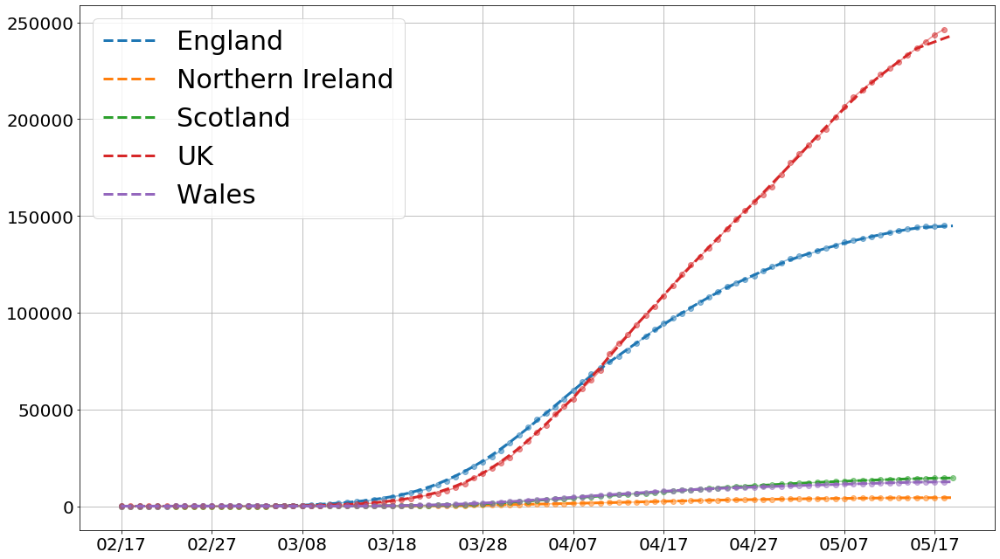

In [67]:
df = pd.read_csv('https://raw.githubusercontent.com/tomwhite/covid-19-uk-data/master/data/covid-19-indicators-uk.csv')
df=df[(df['Indicator']=='ConfirmedCases')]
df = df.pivot(index='Date',columns='Country', values='Value')

focus = df.copy().iloc[40:]

focus['time'] = pd.to_datetime(focus.index)
focus.index = focus.time.dt.strftime('%m/%d')
focus.drop('time',axis=1,inplace=True)

fig, ax=plt.subplots(nrows=1, ncols=1, figsize=(16,9))

for j, i in enumerate(list(focus)):
    ax.plot(focus[i], 'o-',c='C'+str(j), alpha=0.5)
    ax.plot(focus[i].rolling(window=7, min_periods=1, center=True).mean(), lw=3, ls='--', label=i)
    
# ax.set_yscale('log')
# ax.set_ylim(bottom=10)
ax.tick_params(labelsize=20)
ax.legend(loc=0, fontsize=30)
ax.grid()
plt.tight_layout()
ax.xaxis.set_major_locator(plt.MaxNLocator(12))

In [63]:
144984+4421+14594+12570

176569

# APACS

In [203]:
df = pd.read_excel('data/acaps_covid19_goverment_measures_dataset.xlsx',sheet_name='Database',parse_date='DATE_IMPLEMENTED').set_index('COUNTRY').sort_values('DATE_IMPLEMENTED')

In [205]:
df.loc['Iran']

,ID,ISO,ADMIN_LEVEL_NAME,PCODE,REGION,LOG_TYPE,CATEGORY,MEASURE,TARGETED_POP_GROUP,COMMENTS,NON_COMPLIANCE,DATE_IMPLEMENTED,SOURCE,SOURCE_TYPE,LINK,ENTRY_DATE,Alternative source
COUNTRY,,,,,,,,,,,,,,,,,
Iran,3142,IRN,NaN,NaN,Middle East,Introduction / extension of measures,Public health measures,General recommendations,Yes,“travel advisories have been also issued for t...,NaN,2020-01-28,Iran MoFA,Government,https://en.mfa.ir/files/Pdf/0572457-newsExport...,2020-03-31,NaN
Iran,3141,IRN,NaN,NaN,Middle East,Introduction / extension of measures,Public health measures,Strengthening the public health system,No,The Ministry of Foreign Affairs have described...,NaN,2020-01-28,Iran MoFA,Government,https://en.mfa.ir/files/Pdf/0572457-newsExport...,2020-03-31,https://en.mfa.ir/portal/newsview/572497
Iran,3145,IRN,NaN,NaN,Middle East,Introduction / extension of measures,Lockdown,Partial lockdown,No,"Partial shutdown of some factories, transporta...",NaN,2020-01-31,Iran Government Official Twitter,Government,https://twitter.com/Iran_GOV/status/1224402646...,2020-03-31,NaN
Iran,3144,IRN,NaN,NaN,Middle East,Introduction / extension of measures,Movement restrictions,Visa restrictions,Yes,Cancel passenger arrivals from China to Iran,NaN,2020-01-31,Iran Government Official Twitter,Government,https://twitter.com/Iran_GOV/status/1223315441...,2020-03-31,NaN
Iran,3143,IRN,NaN,NaN,Middle East,Introduction / extension of measures,Public health measures,Health screenings in airports and border cross...,No,All border control centers have been on alert.,NaN,2020-01-31,Iran Government Official Twitter,Government,https://twitter.com/Iran_GOV/status/1223315872...,2020-03-31,NaN
Iran,548,IRN,NaN,NaN,Middle East,Introduction / extension of measures,Movement restrictions,Border checks,Yes,Within major internal cities,NaN,2020-02-27,Ministry of Health and Medical Education,Government,https://www.voanews.com/science-health/coronav...,2020-03-16,NaN
Iran,3146,IRN,NaN,NaN,Middle East,Introduction / extension of measures,Public health measures,Strengthening the public health system,No,"Iran to receive 20,000 covid-19 test kits + ot...",NaN,2020-02-27,Iran MoFA,Government,https://en.mfa.ir/portal/newsview/576824,2020-03-31,NaN
Iran,546,IRN,NaN,NaN,Middle East,Introduction / extension of measures,Social distancing,Schools closure,Yes,NaN,NaN,2020-02-27,Ministry of Health and Medical Education,Government,https://www.voanews.com/science-health/coronav...,2020-03-16,NaN
Iran,3147,IRN,NaN,NaN,Middle East,Introduction / extension of measures,Governance and socio-economic measures,Economic measures,Yes,Iranian government denounces the US government...,NaN,2020-02-29,Iran Government,Government,https://en.mfa.ir/portal/newsview/576852,2020-03-31,http://president.ir/en/114343


# Group of country dynamics

In [20]:
africa = ['South Africa','Algeria','Cameroon','Burkina Faso','Cote d\'Ivoire','Mauritius','Nigeria','Senegal','Ghana',
              'Niger','Congo (Kinshasa)','Kenya','Guinea','Rwanda','Madagascar','Uganda','Congo (Brazzaville)','Togo','Ethiopia','Zambia','Mali','Guinea-Bissau',
              'Eritrea','Tanzania','Benin','Gabon','Equatorial Guinea','Namibia','Angola','Liberia','Seychelles','Mozambique',
              'Eswatini','Zimbabwe','Central African Republic','Chad','Cabo Verde','Mauritania','Sierra Leone','Botswana','Gambia',
              'Malawi','Sao Tome and Principe','Burundi','South Sudan','Western Sahara','Comoros','Egypt','Morocco','Tunisia',
          'Djibouti','Libya','Sudan','Somalia']

europe = ['Spain','Italy','Germany','France','United Kingdom','Switzerland','Belgium','Netherlands','Austria','Portugal',
              'Israel','Sweden','Russia','Norway','Ireland','Czechia','Denmark','Poland','Romania','Luxembourg','Serbia','Finland',
              'Greece','Iceland','Ukraine','Croatia','Estonia','Slovenia','Moldova','Lithuania','Armenia','Hungary','Belarus',
              'Bosnia and Herzegovina','Kazakhstan','Azerbaijan','North Macedonia','Bulgaria','Latvia','Andorra','Slovakia',
              'Uzbekistan','Cyprus','Albania','San Marino','Malta','Kyrgyzstan','Montenegro','Georgia','Liechtenstein','Monaco',
              'Holy See','Kosovo']

eu = 'Austria, Belgium, Bulgaria, Croatia, Cyprus, Czechia, Denmark, Estonia, Finland, France, Germany, Greece, Hungary, Ireland, Italy, Latvia, Lithuania, Luxembourg, Malta, Netherlands, Poland, Portugal, Romania, Slovakia, Slovenia, Spain, Sweden'.split(', ')
eu

['Austria',
 'Belgium',
 'Bulgaria',
 'Croatia',
 'Cyprus',
 'Czechia',
 'Denmark',
 'Estonia',
 'Finland',
 'France',
 'Germany',
 'Greece',
 'Hungary',
 'Ireland',
 'Italy',
 'Latvia',
 'Lithuania',
 'Luxembourg',
 'Malta',
 'Netherlands',
 'Poland',
 'Portugal',
 'Romania',
 'Slovakia',
 'Slovenia',
 'Spain',
 'Sweden']

In [829]:
confirm[middle_east]

Country/Region,Bahrain,Cyprus,Egypt,Iran,Iraq,Israel,Jordan,Kuwait,Lebanon,Oman,Qatar,Saudi Arabia,Syria,Turkey,United Arab Emirates,Yemen
time,,,,,,,,,,,,,,,,
01/22,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
01/23,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
01/24,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
01/25,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
01/26,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
06/27,25267,994,63923,220180,43262,23421,1111,44391,1719,36953,93663,178504,256,195883,47360,1103
06/28,25705,994,65188,222669,45402,23755,1121,44942,1740,38150,94413,182493,256,197239,47797,1118
06/29,26239,996,66754,225205,47151,24441,1128,45524,1745,39060,95106,186436,269,198613,48246,1128


In [13]:
focus.T.sort_values(focus.index[-1])

time,02/26,02/27,02/28,02/29,03/01,03/02,03/03,03/04,03/05,03/06,...,06/24,06/25,06/26,06/27,06/28,06/29,06/30,07/01,07/02,07/03
Country/Region,,,,,,,,,,,,,,,,,,,,,
Holy See,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Liechtenstein,NaN,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,-4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
Andorra,NaN,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Netherlands,NaN,1.0,0.0,5.0,4.0,8.0,6.0,14.0,44.0,46.0,...,82.0,110.0,91.0,69.0,73.0,78.0,50.0,0.0,63.0,0.0
San Marino,NaN,1.0,0.0,0.0,0.0,7.0,2.0,6.0,5.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Latvia,NaN,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,3.0,1.0,1.0,1.0,3.0,1.0,0.0
Monaco,NaN,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,3.0,0.0
Estonia,NaN,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,7.0,...,1.0,1.0,2.0,0.0,1.0,0.0,2.0,0.0,1.0,1.0
Malta,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,3.0,2.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0


No handles with labels found to put in legend.


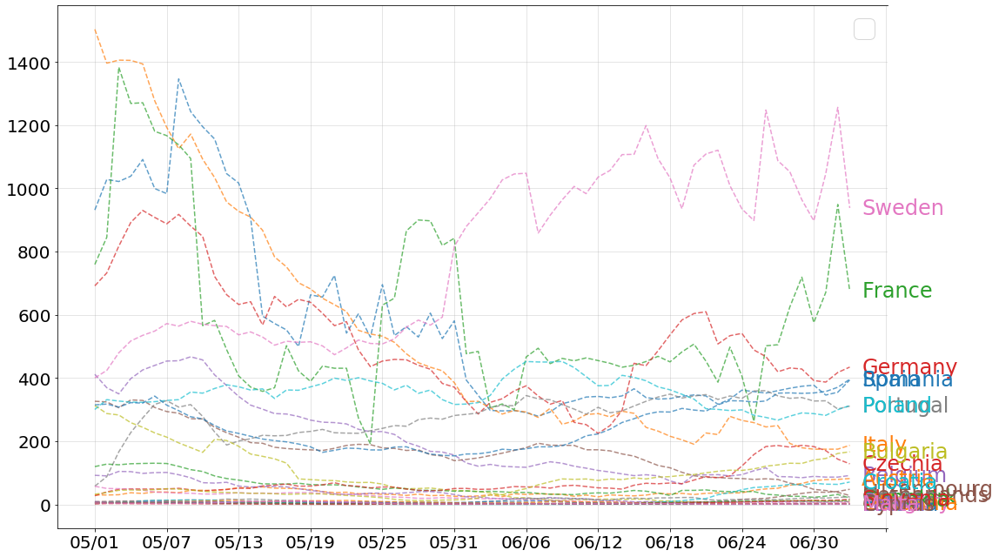

In [25]:
confirm = pd.read_csv('data/JH/confirm_agg.csv').set_index('Country/Region').T
confirm['time'] = pd.to_datetime(confirm.index)
confirm.index = confirm.time.dt.strftime('%m/%d')

offset=100

focus =  confirm[eu].copy()[offset:]
focus = focus[focus.sum().sort_values(ascending=False).index].diff()

fig, ax=plt.subplots(nrows=1, ncols=1, figsize=(16,9))
for i in list(focus):
    ax.plot(focus[i].rolling(window=7, min_periods=1, center=True).mean(),ls='--', alpha=0.7)
    

# ax.plot(focus.sum(axis=1).rolling(window=7, min_periods=1, center=True).mean(),lw=4,c='C0', label='Daily New Cases\nin Africa\n(7 day average)')
    
ax.tick_params(labelsize=20)
ax.legend(loc=0, fontsize=30)

plt.tight_layout()
ax.xaxis.set_major_locator(plt.MaxNLocator(12))
ax.format_xdata = mdates.DateFormatter('%m-%d')

for c, i in enumerate(focus.columns):
    ax.annotate(i, xy=(len(focus),focus[i].rolling(window=7, min_periods=1, center=True).mean()[-1]), color='k', ha='left', va='center', size=24, c='C'+str(c))

ax.spines['right'].set_visible(False)
plt.tight_layout()
ax.grid(alpha=0.4)
# plt.savefig('figures/Africa_7_2.png', dpi=100)

# Macro statistics comparison

In [283]:
df = pd.read_csv(r'data/worldometer/wom_latest.csv').set_index('Country/Other')
df

,Total Cases,New Cases,Total Deaths,New Deaths,Total Recovered,Active Cases,Serious/Critical,Tot Cases/ 1M pop,Deaths/ 1M pop,Total Tests,Tests/ 1M pop
Country/Other,,,,,,,,,,,
North America,1404635.0,28734.0,84758.0,2331.0,267537.0,1052340.0,18180.0,0.0,0.0,0.0,0.0
Europe,1553652.0,28748.0,148460.0,1829.0,611527.0,793665.0,15404.0,0.0,0.0,0.0,0.0
Asia,618504.0,15439.0,21204.0,398.0,338640.0,258660.0,5201.0,0.0,0.0,0.0,0.0
South America,263593.0,11982.0,13430.0,605.0,89773.0,160390.0,9986.0,0.0,0.0,0.0,0.0
Africa,54882.0,2169.0,2076.0,61.0,18997.0,33809.0,172.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...
St. Barth,6.0,0.0,0.0,0.0,6.0,0.0,0.0,607.0,0.0,0.0,0.0
Western Sahara,6.0,0.0,0.0,0.0,5.0,1.0,0.0,10.0,0.0,0.0,0.0
Anguilla,3.0,0.0,0.0,0.0,3.0,0.0,0.0,200.0,0.0,0.0,0.0


In [298]:
index_1 = 'Total Cases'
index_2 = 'Total Deaths'
s1 = df.sort_values(index_1).reset_index()['Country/Other']
s1 = pd.Series(s1.index.values, index=s1)
s2 = df.sort_values(index_2).reset_index()['Country/Other']
s2 = pd.Series(s2.index.values, index=s2)

focus = pd.DataFrame(index=s1.index, data={index_1:s1, index_2:s2})

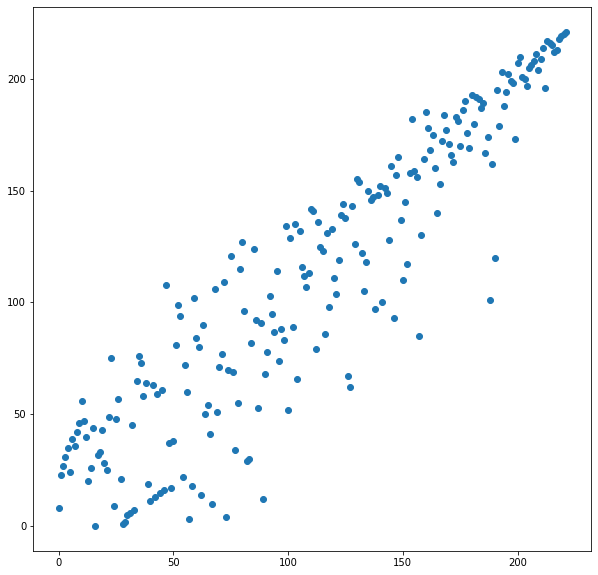

In [301]:
fig, ax = plt.subplots(figsize=(10,10))
plt.scatter(focus[index_1], focus[index_2])

# US state trailing tally

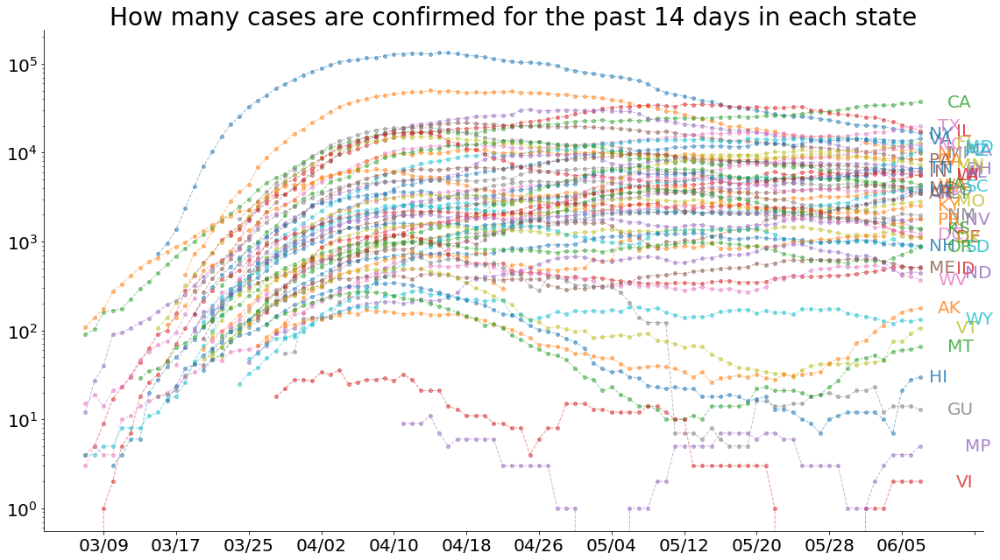

In [682]:
df = pd.read_csv('https://raw.githubusercontent.com/nytimes/covid-19-data/master/us-states.csv')
df = df.pivot(index='date',columns='state',values='cases').iloc[32:]
df = df[df.iloc[-1].sort_values(ascending=False).index]
df.index.rename('US', inplace=True)

df['time'] = pd.to_datetime(df.index)
df.index = df.time.dt.strftime('%m/%d')
df.drop('time', axis=1, inplace=True)

fig, ax=plt.subplots(nrows=1, ncols=1, figsize=(16,9))

for i,state in enumerate(df):
    ax.plot(df[state] - df[state].shift(14), 'o--', c='C'+str(i), lw=1, markersize=4, alpha=0.5)
    ax.annotate(us_state_abbrev[state], xy=(len(df)+i%5,(df[state] - df[state].shift(14))[-1]), 
                va='center',color='C'+str(i), size=20, alpha=0.8)
    
ax.tick_params(labelsize=20)
# ax.legend(loc=0, fontsize=30)
ax.xaxis.set_major_locator(plt.MaxNLocator(15))
ax.format_xdata = mdates.DateFormatter('%m-%d')
ax.set_xlim(right=len(df)+6)
ax.set_yscale('log')
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.set_title('How many cases are confirmed for the past 14 days in each state', fontsize=28)
plt.tight_layout()

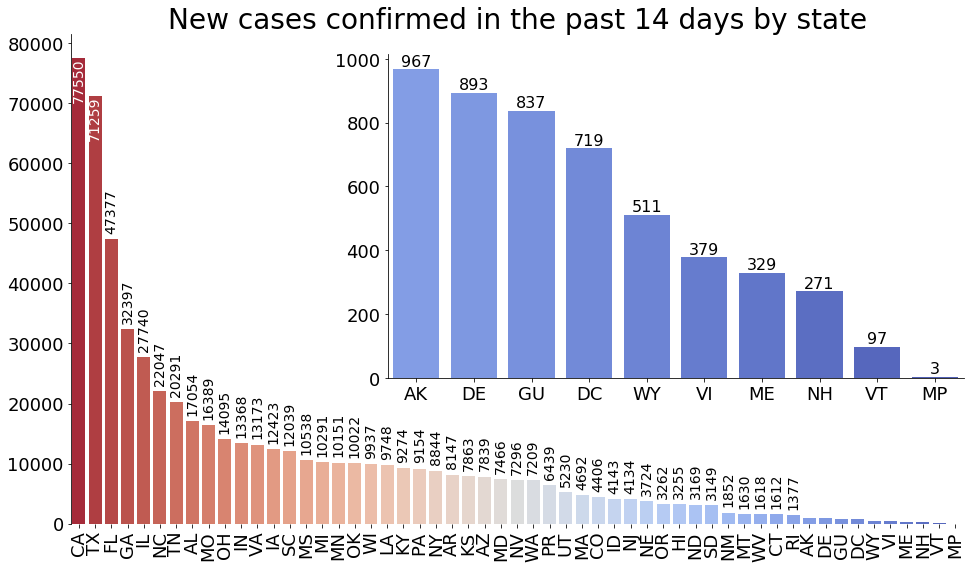

In [383]:
df = pd.read_csv('https://raw.githubusercontent.com/nytimes/covid-19-data/master/us-states.csv')
df = df.pivot(index='date',columns='state',values='cases').iloc[32:]
df = df[df.iloc[-1].sort_values(ascending=False).index]
df.index.rename('US', inplace=True)

focus = (df.iloc[-1] - df.iloc[-15]).sort_values(ascending=False)
focus.index = [us_state_abbrev[i] for i in focus.index]

fig, ax=plt.subplots(nrows=1, ncols=1, figsize=(16,9))
sns.barplot(x=focus.index, y=focus.values, palette=sns.color_palette("coolwarm_r", len(focus)))


ax2 = plt.axes([0.40, 0.35, 0.5, 0.5])
cutoff = (focus < 1000).sum()

sns.barplot(x=focus.index[-cutoff:], y=focus.values[-cutoff:], palette=sns.color_palette("coolwarm_r", len(focus))[-cutoff:], ax=ax2)


for i,v in enumerate(focus.values[:-cutoff]):
    if v > 50000:
        ax.annotate(int(v), xy=(i,v), ha='center', va='top',fontsize=14,rotation=90,c='w')
#     elif v> 20000:
#         ax.annotate(int(v), xy=(i,v), ha='center', va='top',fontsize=14,rotation=90)
    else:
        ax.annotate(int(v), xy=(i,v+1000), ha='center', va='bottom',fontsize=14,rotation=90)
    
for i,v in enumerate(focus.values[-cutoff:]):
    ax2.annotate(int(v), xy=(i,v+cutoff), ha='center',fontsize=16)

        
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['bottom'].set_visible(False)

ax2.spines['right'].set_visible(False)
ax2.spines['top'].set_visible(False)
ax.tick_params(labelsize=18)
ax.tick_params(axis='x',rotation=90)
ax2.tick_params(labelsize=18)

ax.set_title('New cases confirmed in the past 14 days by state', fontsize=28)
plt.savefig('figures/Daily_misc_9_1a.png',dpi=100)

# Fall plot main street

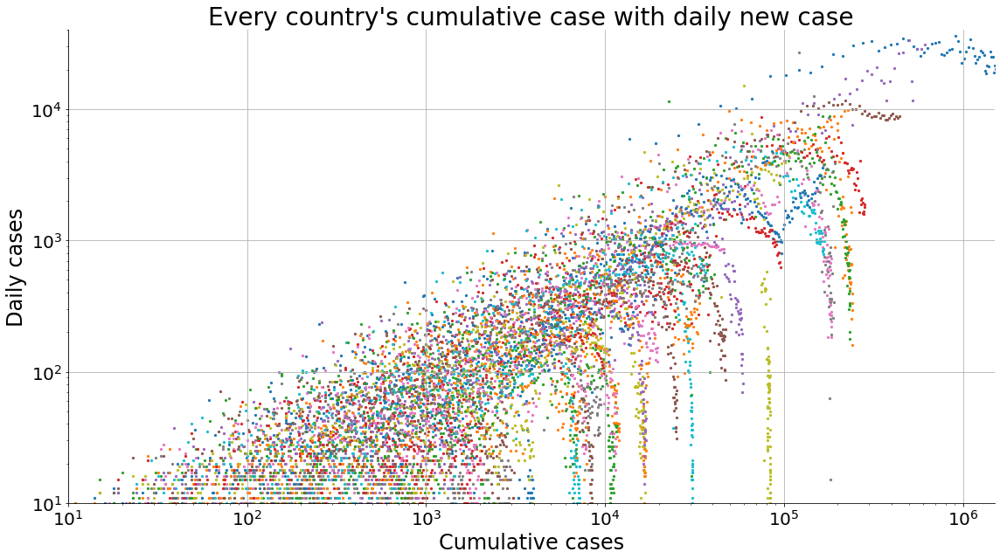

In [608]:
df = pd.read_csv('data/JH/confirm_agg.csv').set_index('Country/Region').T

df['time'] = pd.to_datetime(df.index)
df.index = df.time.dt.strftime('%m/%d')
df.drop('time', axis=1, inplace=True)
df = df[df.sum().sort_values(ascending=False).index]


fig, ax=plt.subplots(nrows=1, ncols=1, figsize=(16,9))

for country in list(df):
    focus = df[[country]].copy()
    focus['new'] = focus[country].diff()

    ax.scatter(focus[country], focus['new'],s=5)

ax.set_ylim(bottom=10,top=40000)
ax.set_xlim(left=10, right=1500000)
ax.set_xscale('log')
ax.set_yscale('log')

ax.tick_params(labelsize=20)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.set_title('Every country\'s cumulative case with daily new case', fontsize=28)
ax.set_xlabel('Cumulative cases', fontsize=24)
ax.set_ylabel('Daily cases', fontsize=24)
ax.grid()
plt.tight_layout()

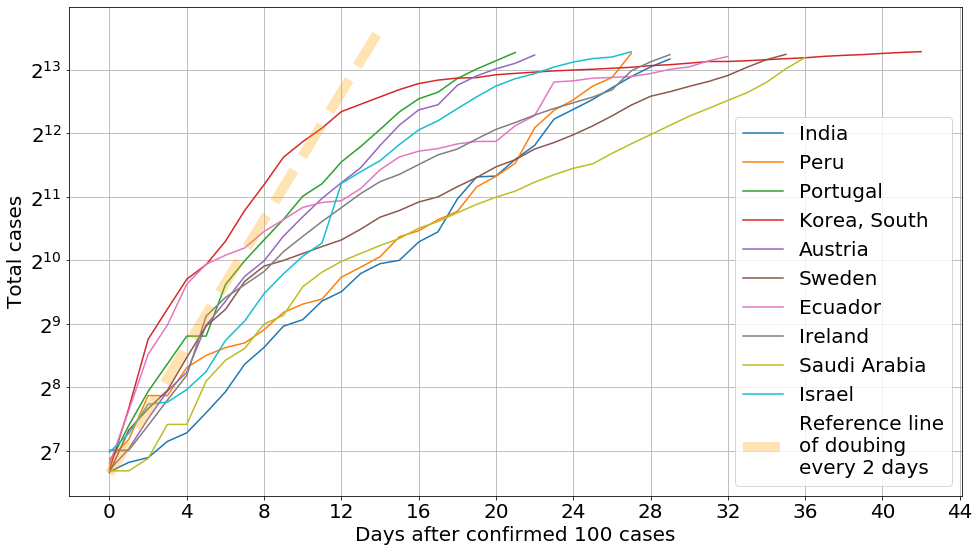

In [747]:
df = pd.read_csv('data/JH/confirm_agg.csv').set_index('Country/Region').T

df['time'] = pd.to_datetime(df.index)
df.index = df.time.dt.strftime('%m/%d')
df.drop('time', axis=1, inplace=True)
df = df[df.sum().sort_values(ascending=False).index]

fig, ax=plt.subplots(nrows=1, ncols=1, figsize=(16,9))

# for country in ['Italy','US','Spain','Iran','France']:
for country in list(df)[15:25]:
    ax.plot(df[country][np.argmax(df[country]>100):np.argmax(df[country]>10000)].values, label=country)

ax.plot([0, 14], [100, 12800], 'orange', lw=10, ls='--',alpha=0.3, label='Reference line\nof doubing\nevery 2 days')
ax.tick_params(labelsize=20)
ax.xaxis.set_major_locator(plt.MaxNLocator(12))
# ax.xaxis.set_major_locator(MaxNLocator(integer=True))
ax.legend(fontsize=20)
ax.set_yscale('log', basey=2)
ax.set_ylabel('Total cases',fontsize=20)
ax.set_xlabel('Days after confirmed 100 cases',fontsize=20)
ax.grid()


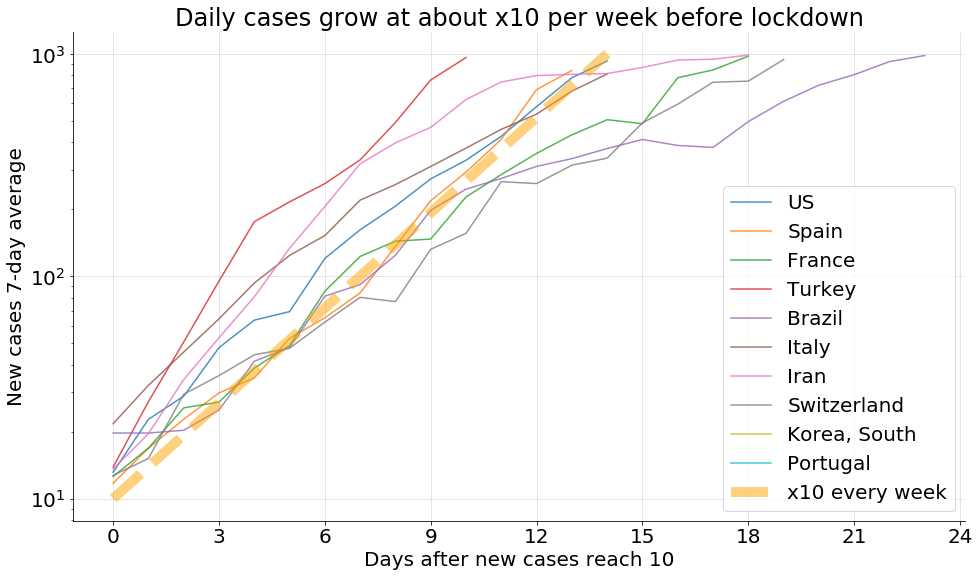

In [892]:
df = pd.read_csv('data/JH/confirm_agg.csv').set_index('Country/Region').T

df['time'] = pd.to_datetime(df.index)
df.index = df.time.dt.strftime('%m/%d')
df.drop('time', axis=1, inplace=True)
df = df[df.sum().sort_values(ascending=False).index]

for i in list(df):
    df[i] = df[i].diff().rolling(window=window, min_periods=1, center=True).mean()

fig, ax=plt.subplots(nrows=1, ncols=1, figsize=(16,9))

for country in ['US','Spain','France','Turkey','Brazil','Italy','Iran','Switzerland','Korea, South','Portugal']:
    ax.plot(df[country][np.argmax(df[country]>10):np.argmax(df[country]>1000)].values, label=country, alpha=0.8)

ax.plot([0, 14], [10, 1000], 'orange', lw=10, ls='--',alpha=0.5, label='x10 every week')
    
ax.tick_params(labelsize=20)
# ax.xaxis.set_major_locator(plt.MaxNLocator(5))
ax.xaxis.set_major_locator(MaxNLocator(integer=True))
ax.legend(fontsize=20)
ax.set_yscale('log')
ax.set_ylabel('New cases 7-day average',fontsize=20)
ax.set_xlabel('Days after new cases reach 10',fontsize=20)
ax.grid(alpha=0.4)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
# ax.set_title('Daily cases are doubling faster than every 2 days in many countries in early stages', fontsize=24)
ax.set_title('Daily cases grow at about x10 per week before lockdown', fontsize=24)

plt.savefig('figures/Daily_misc_5_10a.png',dpi=600)


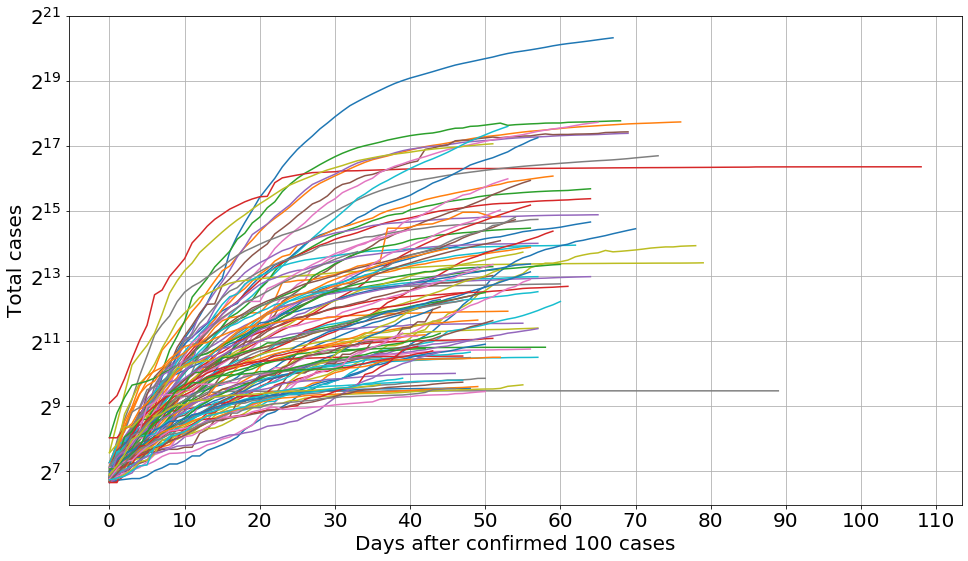

In [536]:
from matplotlib.ticker import MaxNLocator

# focus = df['Spain'][33:55]

fig, ax=plt.subplots(nrows=1, ncols=1, figsize=(16,9))

for country in list(df)[:100]:
    ax.plot(df[country][np.argmax(df[country]>100):].values, label=country)

ax.tick_params(labelsize=20)
ax.xaxis.set_major_locator(plt.MaxNLocator(12))
# ax.xaxis.set_major_locator(MaxNLocator(integer=True))
# ax.legend(fontsize=20)
ax.set_yscale('log', basey=2)
ax.set_ylabel('Total cases',fontsize=20)
ax.set_xlabel('Days after confirmed 100 cases',fontsize=20)
ax.grid()


# Death rate dynamics

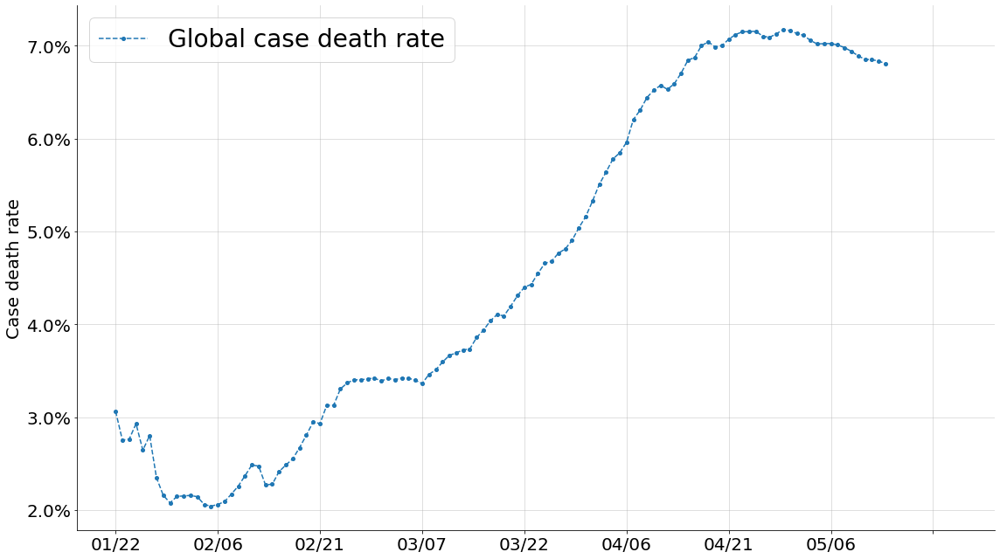

In [23]:
case = pd.read_csv('data/JH/confirm_agg.csv').set_index('Country/Region').T
death = pd.read_csv('data/JH/death_agg.csv').set_index('Country/Region').T

focus = pd.DataFrame(death.sum(axis=1) / case.sum(axis=1))
focus['time'] = pd.to_datetime(focus.index)
focus.index = focus.time.dt.strftime('%m/%d')

fig, ax=plt.subplots(nrows=1, ncols=1, figsize=(16,9))

ax.plot(focus[0]*100,'o--',markersize=4, label='Global case death rate')

country_rate = death.sum()/case.sum()
# for i, country in enumerate(['US','Germany','Spain','Italy','United Kingdom',
#                              'Brazil','China','Turkey','Belgium','Netherlands','Saudi Arabia','Mexico']):
# #     ax.plot(death[country]/case[country]*100, c='C'+str(i))
#     ax.annotate(str(round(100*country_rate[country],2)) + '  ' + country,
#                 xy=(len(focus),country_rate[country]*100), c='C'+str(i), fontsize=24)

ax.tick_params(labelsize=20)
ax.xaxis.set_major_locator(plt.MaxNLocator(12))
ax.yaxis.set_major_formatter(mtick.PercentFormatter())
ax.set_ylabel('Case death rate',fontsize=20)
# ax.set_title('Dynamics of case death rate', fontsize=28)
# ax.set_ylim(top=15,bottom=0)
ax.set_xlim(right=len(focus)+15)
ax.legend(fontsize=28, loc=0)

ax.grid(alpha=0.5)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
plt.tight_layout()
# plt.savefig('figures/Daily_misc_5_10c.png', dpi=600)


# US partisan growth

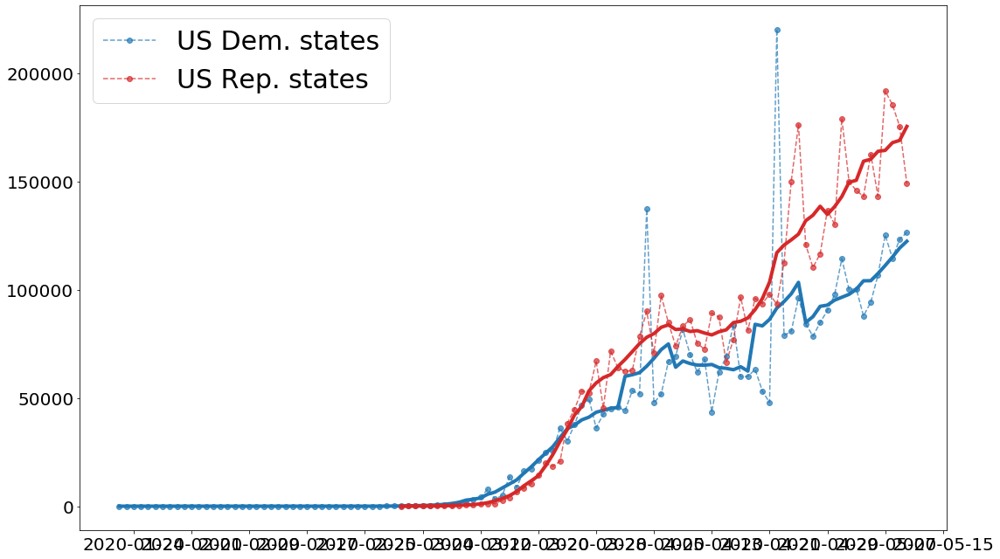

In [5]:
import urllib.request, json 

with urllib.request.urlopen("https://covidtracking.com/api/v1/states/daily.json") as url:
    data = json.loads(url.read().decode())
df = pd.DataFrame(data)
df['date'] = pd.to_datetime(df.date, format='%Y%m%d')
df.iloc[0]['date']

# by current governor
dem = 'Hawaii,New York,Rhode Island,California,Delaware,Connecticut,Oregon,Washington,Minnesota,Colorado,Pennsylvania,Virginia,Montana,Louisiana,West Virginia,North Carolina'.split(',')
rep = 'Vermont,New Hampshire,Missouri,Maryland,Massachusetts,Illinois,New Jersey,Maine,Michigan,New Mexico,Nevada,Wisconsin,Iowa,Ohio,Florida,Indiana,Georgia,Arizona,South Carolina,Mississippi,North Dakota,South Dakota,Texas,Kansas,Nebraska,Tennessee,Kentucky,Alabama,Arkansas,Idaho,Oklahoma,Utah,Wyoming'.split(',')

us_state_abbrev = {
    'Alabama': 'AL',
    'Alaska': 'AK',
    'American Samoa': 'AS',
    'Arizona': 'AZ',
    'Arkansas': 'AR',
    'California': 'CA',
    'Colorado': 'CO',
    'Connecticut': 'CT',
    'Delaware': 'DE',
    'District of Columbia': 'DC',
    'Florida': 'FL',
    'Georgia': 'GA',
    'Guam': 'GU',
    'Hawaii': 'HI',
    'Idaho': 'ID',
    'Illinois': 'IL',
    'Indiana': 'IN',
    'Iowa': 'IA',
    'Kansas': 'KS',
    'Kentucky': 'KY',
    'Louisiana': 'LA',
    'Maine': 'ME',
    'Maryland': 'MD',
    'Massachusetts': 'MA',
    'Michigan': 'MI',
    'Minnesota': 'MN',
    'Mississippi': 'MS',
    'Missouri': 'MO',
    'Montana': 'MT',
    'Nebraska': 'NE',
    'Nevada': 'NV',
    'New Hampshire': 'NH',
    'New Jersey': 'NJ',
    'New Mexico': 'NM',
    'New York': 'NY',
    'North Carolina': 'NC',
    'North Dakota': 'ND',
    'Northern Mariana Islands':'MP',
    'Ohio': 'OH',
    'Oklahoma': 'OK',
    'Oregon': 'OR',
    'Pennsylvania': 'PA',
    'Puerto Rico': 'PR',
    'Rhode Island': 'RI',
    'South Carolina': 'SC',
    'South Dakota': 'SD',
    'Tennessee': 'TN',
    'Texas': 'TX',
    'Utah': 'UT',
    'Vermont': 'VT',
    'Virgin Islands': 'VI',
    'Virginia': 'VA',
    'Washington': 'WA',
    'West Virginia': 'WV',
    'Wisconsin': 'WI',
    'Wyoming': 'WY'
}

dem_abb = [us_state_abbrev[i] for i in dem]
rep_abb = [us_state_abbrev[i] for i in rep]

dem_test = df.set_index('state').loc[dem_abb].groupby('date').sum()['totalTestResultsIncrease']
rep_test = df.set_index('state').loc[rep_abb].groupby('date').sum()['totalTestResultsIncrease']

fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(16,9))

ax.plot(dem_test, 'o--', label='US Dem. states',  alpha=0.7)
ax.plot(dem_test.rolling(window=7, min_periods=1, center=True).mean(), lw=4, c='C0', alpha=3)

ax.plot(rep_test, 'o--', label='US Rep. states',  alpha=0.7, c='C3')
ax.plot(rep_test.rolling(window=7, min_periods=1, center=True).mean(), lw=4, c='C3', alpha=3)

ax.tick_params(labelsize=20)
ax.legend(loc="upper left", fontsize=30)

plt.tight_layout()
ax.xaxis.set_major_locator(plt.MaxNLocator(15))
# plt.savefig('figures/NYNJ_vs_US.png' , dpi=600)

# Italy regions

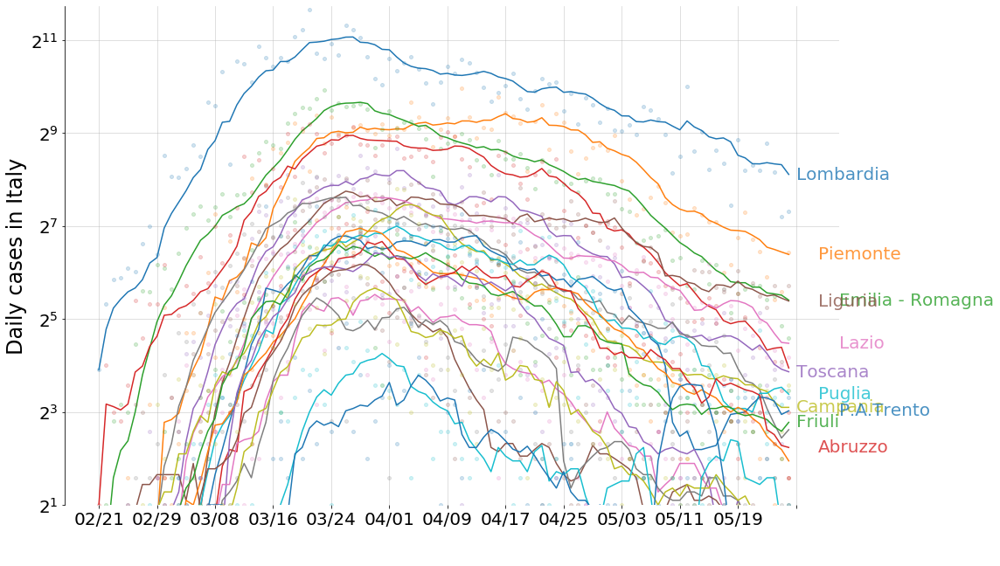

In [513]:
s = '1-5iveo3Bhf0dY5J6-THcffVPapKyJjJ9SSBXstUzmns'
gid = '&gid=81743903'
path = 'https://docs.google.com/spreadsheets/d/' + s + '/export?format=csv&id=' + s + gid

df = pd.read_csv(path, skiprows=[1]).set_index(['Italy']).iloc[2:,:21]

df['time'] = pd.to_datetime(df.index)
df.index = df.time.dt.strftime('%m/%d')
df.drop('time', axis=1, inplace=True)

fig, ax=plt.subplots(nrows=1, ncols=1, figsize=(16,9))

for i,state in enumerate(df):
    ax.plot(df[state], 'o', c='C'+str(i), lw=1, markersize=4, alpha=0.2)
    t = df[state].rolling(window=7, min_periods=1, center=True).mean().clip(lower=1)
    ax.plot(t, c='C'+str(i))
#     if i < 21:
    ax.annotate(state, xy=(len(df)+(i%4)*3,t[-1]), va='center',color='C'+str(i), size=20, alpha=0.8)
    
ax.tick_params(labelsize=20)
# ax.legend(loc=0, fontsize=30)
ax.xaxis.set_major_locator(plt.MaxNLocator(15))
ax.format_xdata = mdates.DateFormatter('%m-%d')
ax.set_xlim(right=len(df)+6)
ax.set_ylim(bottom=2)
ax.set_yscale('log',basey=2)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.set_ylabel('Daily cases in Italy', fontsize=24)
ax.grid(alpha=0.5)
plt.tight_layout()
# plt.savefig('figures/Daily_misc_5_26.png',dpi=600)

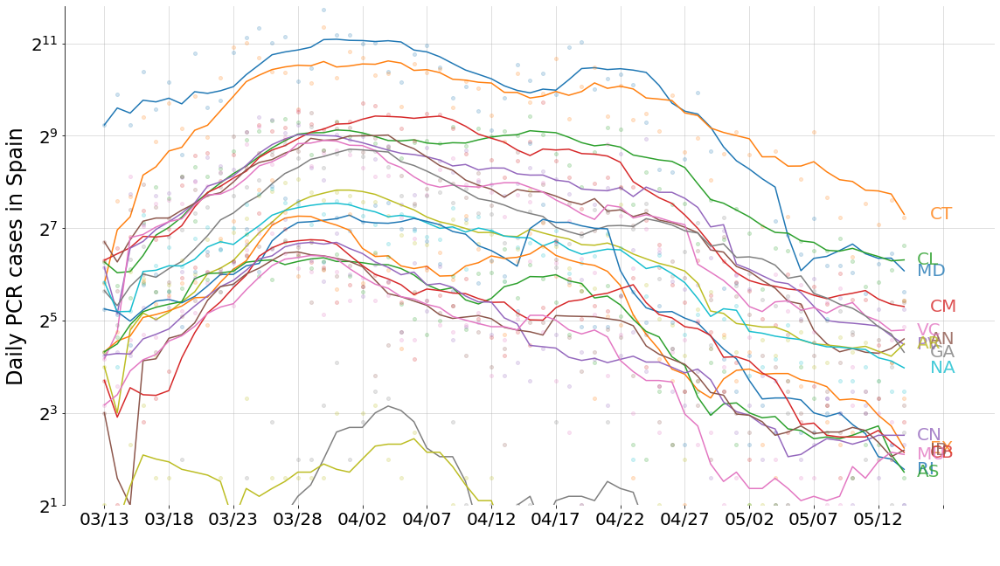

In [32]:
s = '1nhZ0LaPdxgniyJa22MpqgQxUM88AIgSgJagyyA-VjGU'
gid = '&gid=1674121059'
path = 'https://docs.google.com/spreadsheets/d/' + s + '/export?format=csv&id=' + s + gid

df = pd.read_csv(path, skiprows=[1]).set_index(['Spain']).iloc[2:,:19]

df['time'] = pd.to_datetime(df.index)
df.index = df.time.dt.strftime('%m/%d')
df.drop('time', axis=1, inplace=True)

fig, ax=plt.subplots(nrows=1, ncols=1, figsize=(16,9))

for i,state in enumerate(df):
    ax.plot(df[state], 'o', c='C'+str(i), lw=1, markersize=4, alpha=0.2)
    t = df[state].rolling(window=7, min_periods=1, center=True).mean().clip(lower=1)
    ax.plot(t, c='C'+str(i))
#     if i < 21:
    ax.annotate(state, xy=(len(df)+(i%2),t[-1]), va='center',color='C'+str(i), size=20, alpha=0.8)
    
ax.tick_params(labelsize=20)
# ax.legend(loc=0, fontsize=30)
ax.xaxis.set_major_locator(plt.MaxNLocator(15))
ax.format_xdata = mdates.DateFormatter('%m-%d')
ax.set_xlim(right=len(df)+6)
ax.set_ylim(bottom=2)
ax.set_yscale('log',basey=2)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.set_ylabel('Daily PCR cases in Spain', fontsize=24)
ax.grid(alpha=0.5)
plt.tight_layout()
plt.savefig('figures/Daily_misc_5_16.png',dpi=600)

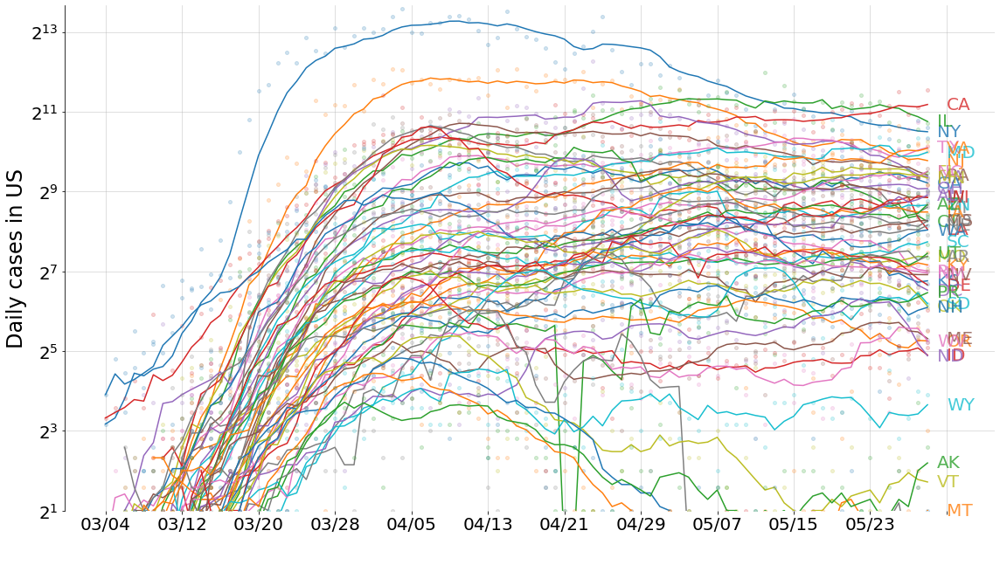

In [115]:
s = '1-5iveo3Bhf0dY5J6-THcffVPapKyJjJ9SSBXstUzmns'
gid = '&gid=572010606'
path = 'https://docs.google.com/spreadsheets/d/' + s + '/export?format=csv&id=' + s + gid

df = pd.read_csv(path, skiprows=[1]).set_index(['US']).iloc[10:,:-3]

df['time'] = pd.to_datetime(df.index)
df.index = df.time.dt.strftime('%m/%d')
df.drop('time', axis=1, inplace=True)

fig, ax=plt.subplots(nrows=1, ncols=1, figsize=(16,9))

for i,state in enumerate(df):
    ax.plot(df[state], 'o', c='C'+str(i), lw=1, markersize=4, alpha=0.2)
    t = df[state].rolling(window=7, min_periods=1, center=True).mean().clip(lower=1)
    ax.plot(t, c='C'+str(i))
#     if i < 21:
    ax.annotate(us_state_abbrev[state], xy=(len(df)+(i%2),t[-1]), va='center',color='C'+str(i), size=20, alpha=0.8)
    
ax.tick_params(labelsize=20)
# ax.legend(loc=0, fontsize=30)
ax.xaxis.set_major_locator(plt.MaxNLocator(15))
ax.format_xdata = mdates.DateFormatter('%m-%d')
ax.set_xlim(right=len(df)+6)
ax.set_ylim(bottom=2)
ax.set_yscale('log',basey=2)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.set_ylabel('Daily cases in US', fontsize=24)
ax.grid(alpha=0.5)
plt.tight_layout()
# plt.savefig('figures/Daily_misc_5_11_c.png',dpi=600)

# US bubble plot

In [119]:
s = '1-5iveo3Bhf0dY5J6-THcffVPapKyJjJ9SSBXstUzmns'
gid = '&gid=572010606'
path = 'https://docs.google.com/spreadsheets/d/' + s + '/export?format=csv&id=' + s + gid

df = pd.read_csv(path, skiprows=[1]).set_index(['US']).iloc[10:,:-3]
focus = df.copy()
for i in list(focus):
    focus[i] = focus[i].rolling(window=7, min_periods=1, center=True).mean()
    
# df.iloc[-1]/df.iloc[-8]
t = pd.DataFrame(index=list(focus))
t['Compared to last week'] = focus.iloc[-1]/focus.iloc[-8]
t['Yesterday'] = df.iloc[-1]
t['Abb'] = [us_state_abbrev[i] for i in list(focus)]
t['Sum'] = df.sum()
t.to_csv('data/for_tab_US_bubble.csv')

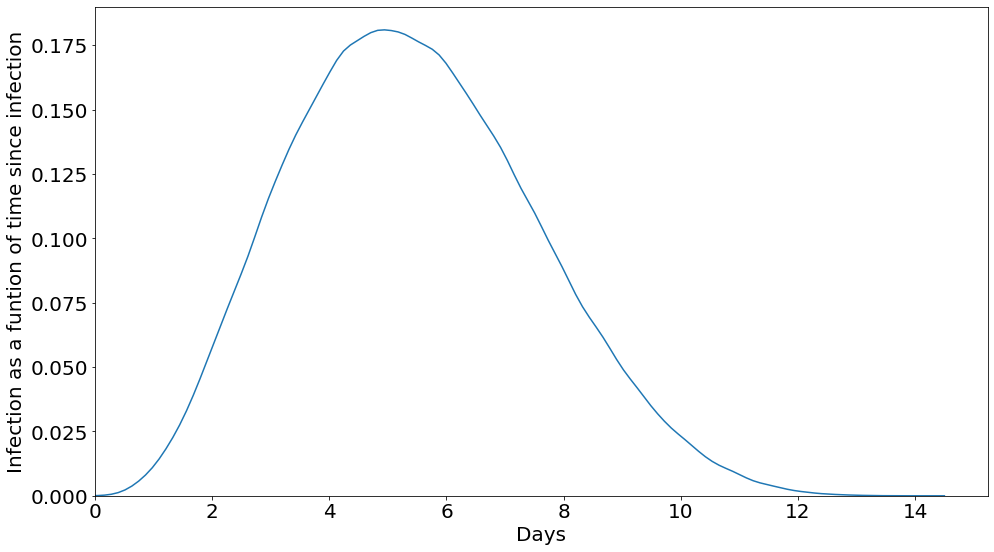

In [21]:
sample =np.random.beta(4, 7, size=500000) * 15
# sample = np.random.gamma(12, scale=.4, size=500000)

fig, ax = plt.subplots(figsize=(16,9))
ax.tick_params(labelsize=20)
ax.set_xlabel('Days', fontsize=20)
ax.set_ylabel('Infection as a funtion of time since infection', fontsize=20)

sns.distplot(sample, ax=ax, bins=100,hist=False)
ax.set_xlim(left=0)

beta_t = (np.histogram(sample, bins = range(15))[0] / len(sample))
# plt.savefig('figures/for paper/betatau.png', dpi=600)

# Brazil

In [2]:
df = pd.read_csv('https://raw.githubusercontent.com/wcota/covid19br/master/cases-brazil-states.csv')

In [7]:
brazil_fire = df.pivot_table(index='date',columns='state',values='newCases').fillna(0).drop('TOTAL',axis=1)
brazil_fire[brazil_fire.sum().sort_values(ascending=False).index].to_clipboard()
focus = brazil_fire[brazil_fire.sum().sort_values(ascending=False).index]

In [331]:
df.query('state=="TOTAL"')

,date,country,state,city,newDeaths,deaths,newCases,totalCases,deathsMS,totalCasesMS,deaths_per_100k_inhabitants,totalCases_per_100k_inhabitants,deaths_by_totalCases,recovered,suspects,tests,tests_per_100k_inhabitants
1,2020-02-25,Brazil,TOTAL,TOTAL,0,0,1,1,0,0,0.00000,0.00048,0.00000,NaN,NaN,NaN,NaN
3,2020-02-26,Brazil,TOTAL,TOTAL,0,0,0,1,0,1,0.00000,0.00048,0.00000,NaN,NaN,NaN,NaN
5,2020-02-27,Brazil,TOTAL,TOTAL,0,0,0,1,0,1,0.00000,0.00048,0.00000,NaN,NaN,NaN,NaN
7,2020-02-28,Brazil,TOTAL,TOTAL,0,0,1,2,0,1,0.00000,0.00095,0.00000,NaN,NaN,NaN,NaN
9,2020-02-29,Brazil,TOTAL,TOTAL,0,0,0,2,0,2,0.00000,0.00095,0.00000,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2001,2020-05-22,Brazil,TOTAL,TOTAL,1031,21157,21807,334567,21048,330890,10.06771,159.20608,0.06324,130340.0,384682.0,705048.0,335.50209
2029,2020-05-23,Brazil,TOTAL,TOTAL,1046,22203,16998,351565,22013,347398,10.56546,167.29470,0.06315,150562.0,391357.0,705289.0,335.61677
2057,2020-05-24,Brazil,TOTAL,TOTAL,652,22855,14362,365927,22666,363211,10.87571,174.12896,0.06246,162845.0,401334.0,705289.0,335.61677
2085,2020-05-25,Brazil,TOTAL,TOTAL,720,23575,12123,378050,23473,374898,11.21833,179.89777,0.06236,170285.0,401927.0,846669.0,402.89345


# Declining phase

In [374]:
from scipy import optimize

def linear_fit(x, a, b):
    return  a*x+b

confirm = pd.read_csv('data/JH/confirm_agg.csv').set_index('Country/Region').T
confirm['time'] = pd.to_datetime(confirm.index)
confirm.index = confirm.time.dt.strftime('%m/%d')

In [343]:
df = pd.read_csv('https://raw.githubusercontent.com/nytimes/covid-19-data/master/us-states.csv')
df = df.pivot(index='date',columns='state',values='cases').iloc[32:].fillna(0).astype(int)
df['time'] = pd.to_datetime(df.index)
df.index = df.time.dt.strftime('%m/%d')

In [386]:
focus.head(20)

time
03/26    5650.571429
03/27    5639.571429
03/28    5556.285714
03/29    5507.285714
03/30    5401.714286
03/31    5230.857143
04/01    5169.714286
04/02    4950.428571
04/03    4761.285714
04/04    4594.285714
04/05    4465.571429
04/06    4401.142857
04/07    4256.285714
04/08    4121.142857
04/09    4054.857143
04/10    3964.285714
04/11    3948.428571
04/12    3916.428571
04/13    3852.714286
04/14    3843.142857
Name: Italy, dtype: float64

Italy, 64, [(0,33),(33,60),(60,64)]
Turkey, 85, [(0,8),(8,43)]
Germany, 71, [(0,8),(8,36),(36,57)]
Austria, 66, [(0,14),(14,28),(28,62)]
Switzerland, 63, [(0,14),(14,65)]
Luxembourg, 63, [(0,14),(14,52)]
China, 23, [(0,6),(6,27)]
New York, 47, [(0,8),(8,36),(36,50)]
Massachusetts, 63, [(0,34)]

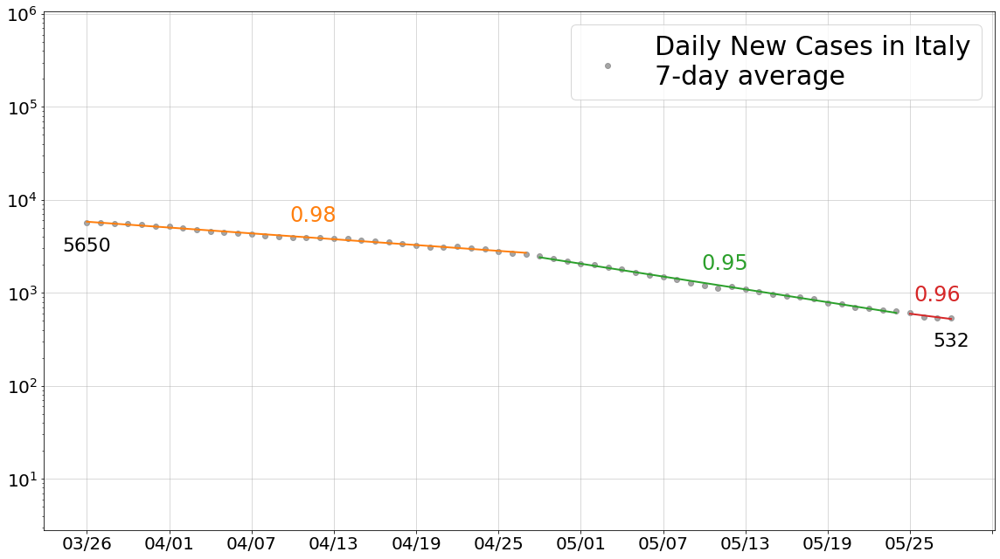

In [396]:
country = ''
focus = confirm[country].rolling(window=7, min_periods=1, center=True).mean().clip(lower=1).diff()

offset = 64
focus = focus.iloc[offset:]

fig, ax = plt.subplots(nrows=1, ncols=1, sharey=True, figsize=(16,9))
ax.set_yscale('log')

ax.scatter(focus.index, focus.values, label='Daily New Cases in %s\n7-day average'%country, c='gray', alpha=0.7)

days = [(0,33),(33,60),(60,64)]
for i,(a,b) in enumerate(days):
    slope, intercept = optimize.curve_fit(linear_fit, np.arange(a,b), np.log(focus.values[a:b]+1))[0]
    ax.plot(np.arange(a,b), np.exp(np.arange(a,b)*slope + intercept), c=('C'+str(i+1)), lw=2)
    ax.annotate(np.round(np.exp(slope),2), 
                xy=((a+b)/2, np.exp((a+b)/2*slope + intercept + 0.3)), va='bottom', ha='center', fontsize=24, c=('C'+str(i+1)))                    

ax.annotate(int(focus[0]), xy=(0, int(focus[0]* 0.7)), va='top', ha='center', fontsize=22)
ax.annotate(int(focus[-1]), xy=(len(focus)-1, int(focus[-1]* 0.7)), va='top', ha='center', fontsize=22)

ax.legend(prop={'size': 30})
ax.tick_params(labelsize=20)
ax.xaxis.set_major_locator(plt.MaxNLocator(12))
ax.format_xdata = mdates.DateFormatter('%m-%d')
ax.grid(alpha=0.6)
plt.tight_layout()

plt.savefig(r'figures/for paper/decline trend/%s.png'%country, dpi=100)

# CFR

In [398]:
cases = 1746019
deaths = 102809

In [414]:
cfr_s[-1]

0.0736024350250484

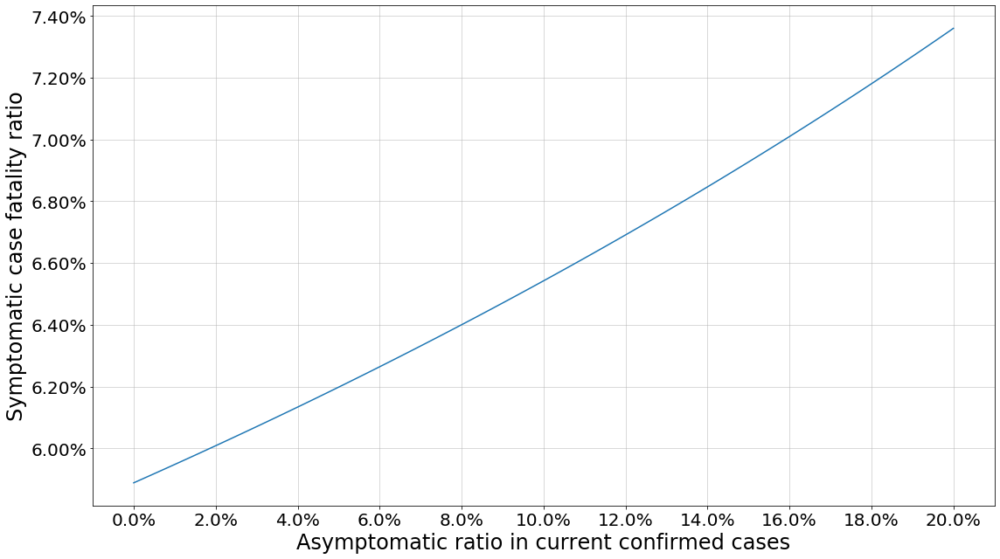

In [468]:
# Symptomatic Case Fatality Ratio
a = np.linspace(0,0.2, 100)
cfr_s = deaths / (cases * (1-a))

fig, ax = plt.subplots(figsize=(16,9))

ax.plot(a*100, cfr_s * 100)

ax.tick_params(labelsize=20)
ax.xaxis.set_major_locator(plt.MaxNLocator(12))
ax.format_xdata = mdates.DateFormatter('%m-%d')
ax.grid(alpha=0.6)
ax.yaxis.set_major_formatter(mtick.PercentFormatter())
ax.xaxis.set_major_formatter(mtick.PercentFormatter())
ax.set_ylabel('Symptomatic case fatality ratio', fontsize=24)
ax.set_xlabel('Asymptomatic ratio in current confirmed cases', fontsize=24)

plt.tight_layout()
plt.savefig('figures/Daily_misc_5-30a.png', dpi=100)

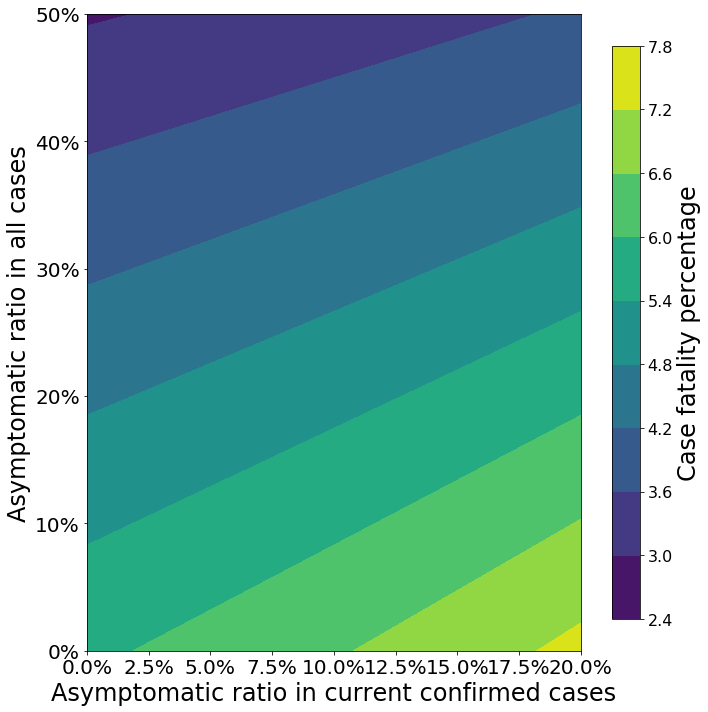

In [511]:
a = np.linspace(0,0.2, 100)
b = np.linspace(0,0.5, 100)

x, y = np.meshgrid(np.linspace(0,0.2,100), np.linspace(0,0.5,100))
z = deaths / (cases * (1-x) / (1-y))

fig, ax = plt.subplots(figsize=(10,10))
 
cs = ax.contourf(x*100, y*100, z*100)
ax.yaxis.set_major_formatter(mtick.PercentFormatter())
ax.xaxis.set_major_formatter(mtick.PercentFormatter())
cbar = fig.colorbar(cs, ax=ax, shrink=0.9)
cbar.ax.set_ylabel('Case fatality percentage', fontsize=24)
cbar.ax.tick_params(labelsize=16)


# cbar.ax.yaxis.set_major_formatter(mtick.PercentFormatter())
ax.tick_params(labelsize=20)



ax.set_ylabel('Asymptomatic ratio in all cases', fontsize=24)
ax.set_xlabel('Asymptomatic ratio in current confirmed cases', fontsize=24)
plt.tight_layout()
# plt.savefig('figures/Daily_misc_5-30b.png', dpi=100)

# Brazil regions

In [482]:
df = pd.read_csv('https://raw.githubusercontent.com/wcota/covid19br/master/cases-brazil-states.csv')
df = df.pivot_table(index='date',columns='state',values='newCases').fillna(0).drop('TOTAL',axis=1).fillna(0).astype(int)
df = df[df.sum().sort_values(ascending=False).index]

df['time'] = pd.to_datetime(df.index)
df.index = df.time.dt.strftime('%m/%d')
df.drop('time', axis=1, inplace=True)


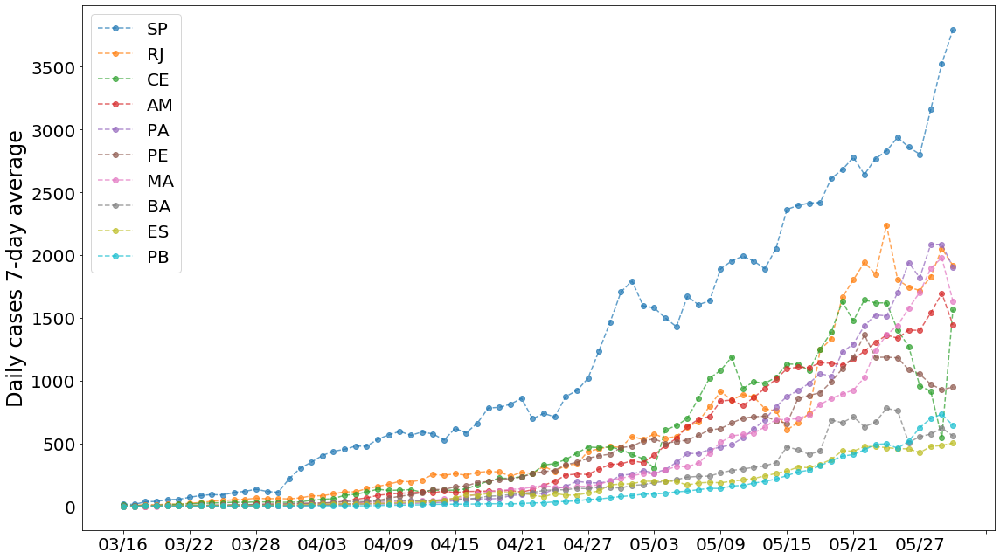

In [501]:
focus = df.iloc[20:]

fig, ax = plt.subplots(figsize=(16,9))
for i in list(focus)[:10]:
    ax.plot(focus[i].rolling(window=7, min_periods=1, center=True).mean(), 'o--', alpha=0.7, label=i)
    
ax.tick_params(labelsize=20)
ax.legend(loc=0, fontsize=20)
ax.format_xdata = mdates.DateFormatter('%m-%d')
ax.xaxis.set_major_locator(plt.MaxNLocator(15))
# ax.set_yscale('log')
ax.set_ylabel('Daily cases 7-day average', fontsize=24)

plt.tight_layout()
# plt.savefig('figures/Daily_misc_5_30c.png', dpi=100)

# Positive rate and daily multiplier

In [534]:
# df = pd.read_csv('https://raw.githubusercontent.com/pcm-dpc/COVID-19/master/dati-regioni/dpc-covid19-ita-regioni.csv')
focus = df.set_index('denominazione_regione').loc['Lombardia'].set_index('data').drop(['stato','codice_regione','lat','long','note_it','note_en'], axis=1)
focus.index = pd.to_datetime(focus.index).strftime('%m-%d')
focus['new_cases'] = focus['nuovi_positivi'].rolling(window=7, min_periods=1, center=True).mean()
focus['daily_pos_rate'] = focus['new_cases'] / focus['casi_testati'].diff()
focus['daily_multiplier'] = focus['new_cases'] / focus['nuovi_positivi'].shift(1)

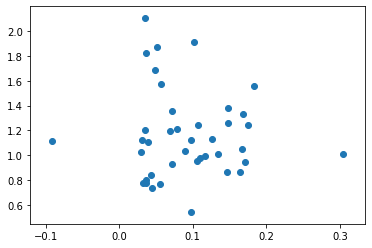

In [535]:
plt.scatter(focus['daily_pos_rate'], focus['daily_multiplier'])
# plt.yscale('log')

# US CFR progressoin

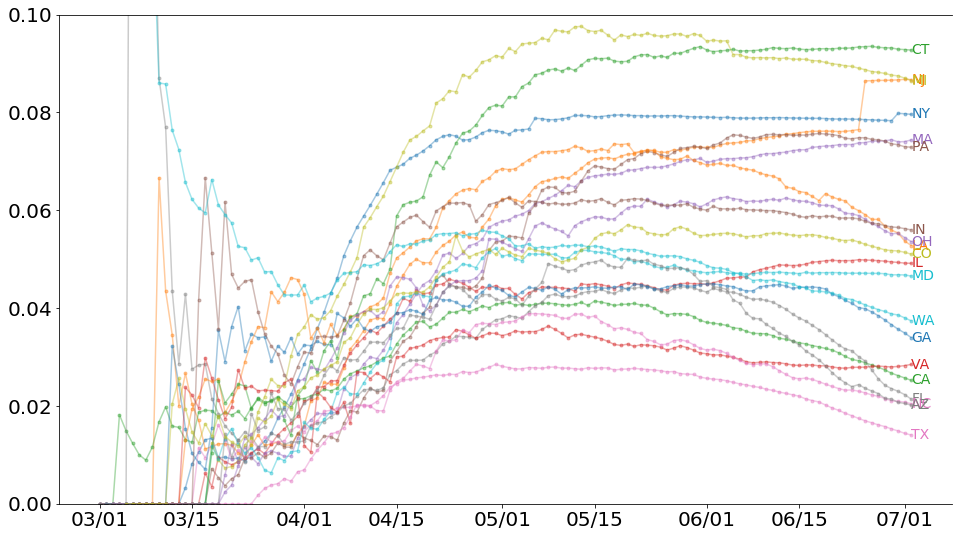

In [818]:
df = pd.read_csv('https://raw.githubusercontent.com/nytimes/covid-19-data/master/us-states.csv')
df.date = pd.to_datetime(df.date)
us_case = df.pivot(index='date',columns='state',values='cases').iloc[40:]
us_case = us_case[us_case.sum().sort_values(ascending=False).index].fillna(0).astype(int)

us_death = df.pivot(index='date',columns='state',values='deaths').iloc[40:]
us_death = us_death[us_death.sum().sort_values(ascending=False).index].fillna(0).astype(int)

fig, ax = plt.subplots(figsize=(16,9))

for j, i in enumerate(us_case.columns[:20]):
    ax.plot(us_death[i] / us_case[i], 'o-', c='C'+str(j), alpha=0.4, markersize=3)
    ax.annotate(us_state_abbrev[i], xy=(us_case.index[-1], (us_death[i] / us_case[i]).values[-1]),
               va='center', ha='left', fontsize=14, c='C'+str(j))

ax.xaxis.set_major_formatter(mdates.DateFormatter('%m/%d'))
ax.set_ylim(top=0.1, bottom=0)
ax.tick_params(labelsize=20)
ax.spines['right'].set_visible(False)
# plt.savefig('figures/Daily_misc_6_6b.png', dpi=100)

# Arizona data

In [76]:
import glob
files = glob.glob('data/Country detailed/Arizona/*.xls')
df_cols = [a.split('\\')[1][:5] for a in files]

df = pd.read_excel('data/Country detailed/Arizona\\05-26-COVID19CONFIRMED_BYZIP_excel.xls').drop('ConfirmedCaseCategory', axis=1)
for file in files[1:]:
    df = pd.merge(left=df, right=pd.read_excel(file).drop('ConfirmedCaseCategory', axis=1),
                  left_on='POSTCODE', right_on='POSTCODE')
df.set_index('POSTCODE', inplace=True)
df.columns = df_cols

In [77]:
df.replace({'1-5':1, '6-10':6, 'Data Suppressed':np.nan}).to_csv('data/Country detailed/Arizona/agg.csv')

# US region vs the rest

US cases by state fetched for 2020-07-14


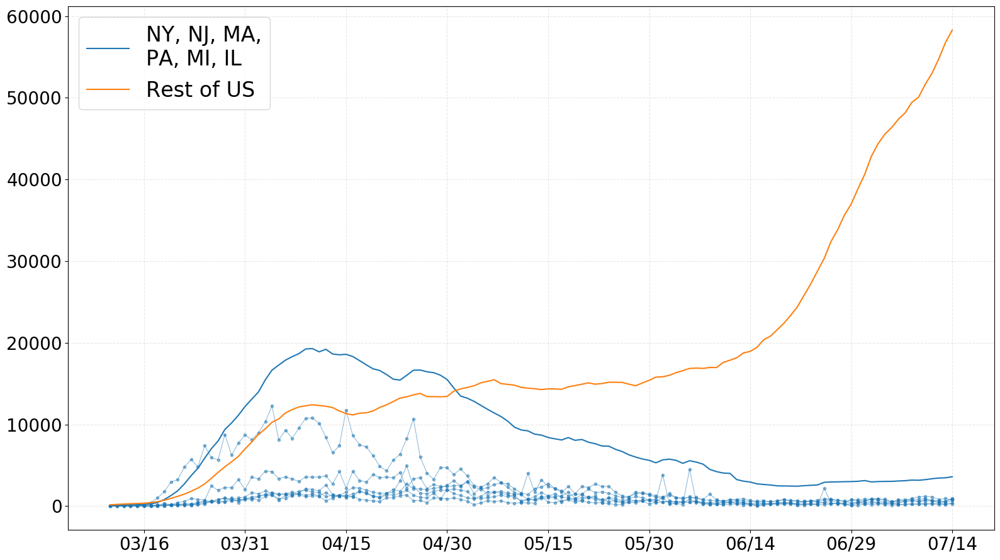

In [23]:
df = get_US()[50:]

region = ['New York','New Jersey','Illinois','Massachusetts','Pennsylvania','Michigan']
region = df[region]

rest = df.drop(region, axis=1)

fig, ax = plt.subplots(figsize=(16,9))

ax.plot(region.sum(axis=1).rolling(window=7, min_periods=1, center=True).mean(), label='NY, NJ, MA,\nPA, MI, IL')
for state in list(region):
    ax.plot(region[state], 'o-', c='C0', alpha=0.5, markersize=3, lw=0.8)

ax.plot(rest.sum(axis=1).rolling(window=7, min_periods=1, center=True).mean(), label='Rest of US')
# for state in list(rest)[:6]:
#     ax.plot(rest[state].rolling(window=7, min_periods=1, center=True).mean(), c='C1', alpha=0.3)

ax.legend(loc='upper left', fontsize=24)
ax.grid(alpha=0.3, ls='--')
ax.tick_params(labelsize=20)
ax.xaxis.set_major_locator(plt.MaxNLocator(12))
ax.xaxis.set_major_formatter(mdates.DateFormatter('%m/%d'))
plt.tight_layout()
# plt.savefig('figures/Daily_misc_6_23.png', dpi=100)

# US states comparing to two weeks ago

US cases by state fetched for 2020-10-10


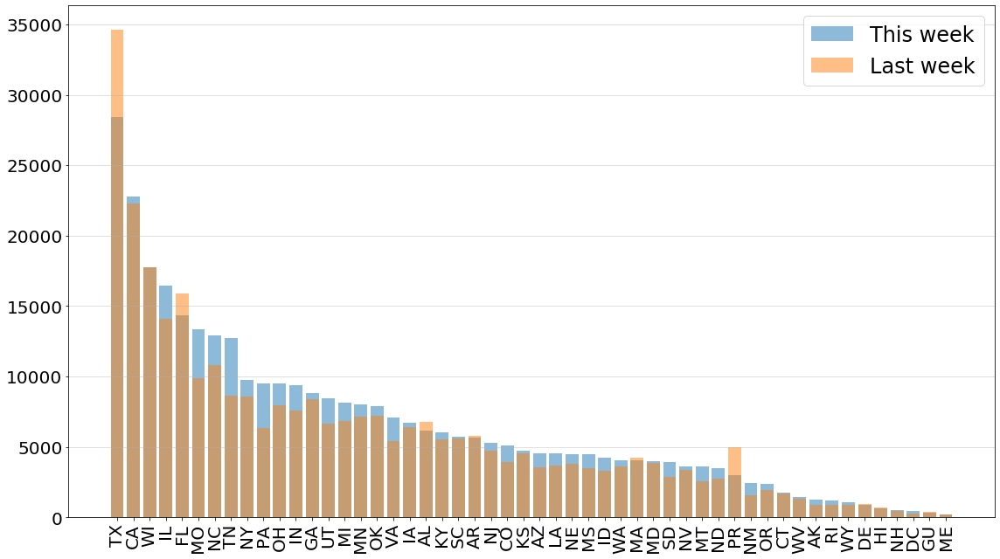

In [233]:
df = np.cumsum(get_US())

t1 = df.iloc[-1] - df.iloc[-8]
t2 = df.iloc[-8] - df.iloc[-15]

t2 = t2[t1.sort_values(ascending=False).index][:-3]
t1 = t1[t1.sort_values(ascending=False).index][:-3]

fig, ax = plt.subplots(figsize=(16, 9))

ax.bar(t1.index, t1.values, alpha=0.5, label='This week', )
ax.bar(t2.index, t2.values, alpha=0.5, label='Last week')

ax.tick_params(labelsize=20)
ax.tick_params(axis='x', labelrotation=90)
ax.legend(fontsize=24)
ax.grid(alpha=0.5, axis='y')

ax.set_xticklabels([us_state_abbrev[i] for i in t1.index])
fig.tight_layout()
plt.savefig('figures/Daily_misc_10_11a.png', dpi=100)

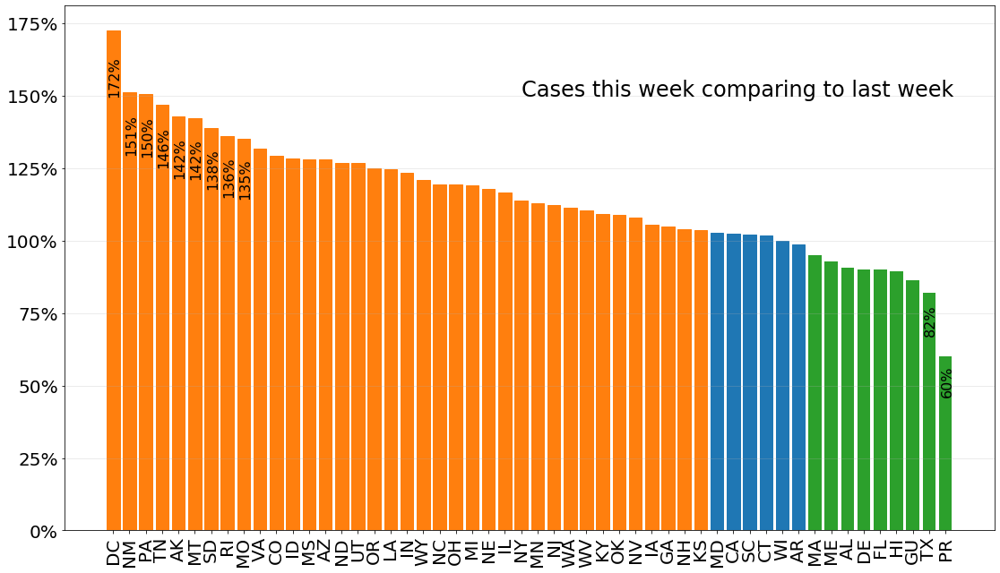

In [235]:
t = (t1/t2).sort_values(ascending=False) * 100
fig, ax = plt.subplots(figsize=(16, 9))

bars = ax.bar(t.index, t.values, color='C2')
sep1 = t.index.get_loc(t[t<103].index[0])
sep2 = t.index.get_loc(t[t<97].index[0])

for i in range(sep1):
    bars[i].set_color('C1')
for i in range(sep1, sep2):
    bars[i].set_color('C0')
    
for i in [0,1,2,3,4,5,6,7,8,50,51]:
    ax.annotate(str(int(t.values[i])) + '%', xy=(i+0.1,t.values[i]*0.95), ha='center',va='top', fontsize=16, rotation=90)

ax.tick_params(labelsize=20)
ax.tick_params(axis='x', labelrotation=90)
# ax.legend(fontsize=24)
ax.text(x=25,y=150, s='Cases this week comparing to last week', fontsize=24)
ax.grid(alpha=0.3, axis='y')

ax.set_xticklabels([us_state_abbrev[i] for i in t.index])
ax.yaxis.set_major_formatter(mtick.PercentFormatter())
fig.tight_layout()
plt.savefig('figures/Daily_misc_10_11a.png', dpi=100)

# Continental lineplot

Global cases (total) by country fetched for 09-30


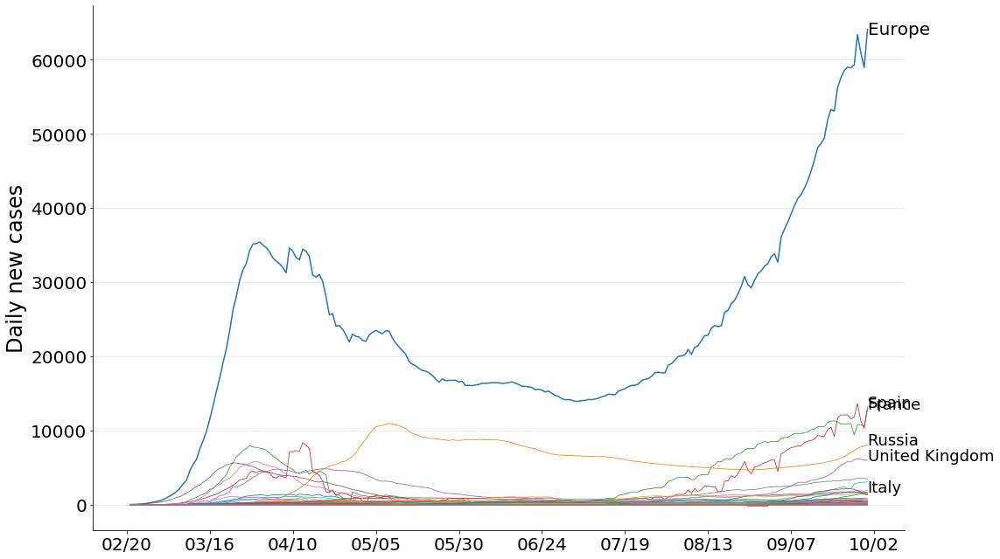

In [494]:
confirm = get_global_cases_total()
# df = confirm[set(africa) -set(['Puerto Rico', 'French Guiana'])]
df = confirm[set(europe) - set(['Kazakhstan','Turkey'])]
df = df.T.sort_values(df.index[-1], ascending=False).T.diff()[30:]
df = df[df.sum().sort_values(ascending=False).index]

fig, ax = plt.subplots(figsize=(16, 9))

ax.plot(df.sum(axis=1).rolling(window=7, min_periods=1, center=True).mean(), label='Daiy cases in Africa')
ax.annotate('Europe', xy=(df.index[-1],df.sum(axis=1).rolling(window=7, min_periods=1, center=True).mean().values[-1]), ha='left', va='center', fontsize=20)

for j, i in enumerate(df.columns):
    ax.plot(df[i].rolling(window=7, min_periods=1, center=True).mean(), lw=0.8)
    if j < 5:
        ax.annotate(i, xy=(df.index[-1],df[i].rolling(window=7, min_periods=1, center=True).mean().values[-1]),
                    ha='left', fontsize=18)

# ax.legend(fontsize=24)
ax.tick_params(labelsize=20)
ax.xaxis.set_major_locator(plt.MaxNLocator(12))
ax.xaxis.set_major_formatter(mdates.DateFormatter('%m/%d'))
ax.grid(axis='y', alpha=0.3)
ax.set_ylabel('Daily new cases', fontsize=24)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
# ax.set_yscale('log')
# ax.set_ylim(top=2000)
plt.tight_layout()

plt.savefig('figures/Daily_misc_10_2.png', dpi=100)

# Continental increase/decrease by month

In [482]:
confirm = get_global_cases_total()
# df = confirm[africa].drop(['Lesotho'], axis=1)
df = confirm[europe].drop(['Armenia','Azerbaijan','Kazakhstan'], axis=1)
# df = confirm[america].drop(['Trinidad and Tobago'], axis=1)
# df = confirm[asia]

def truncate(s, threshold):
    if len(s) > threshold:
        return s[:threshold-2] + '..'
    else:
        return s

df.columns = [truncate(s, 11) for s in df.columns]

too_small = list(df.columns[(df.iloc[-31] - df.iloc[-61]) < 1])
df = df.drop(too_small, axis=1)
df = df.iloc[:]

Global cases (total) by country fetched for 09-30


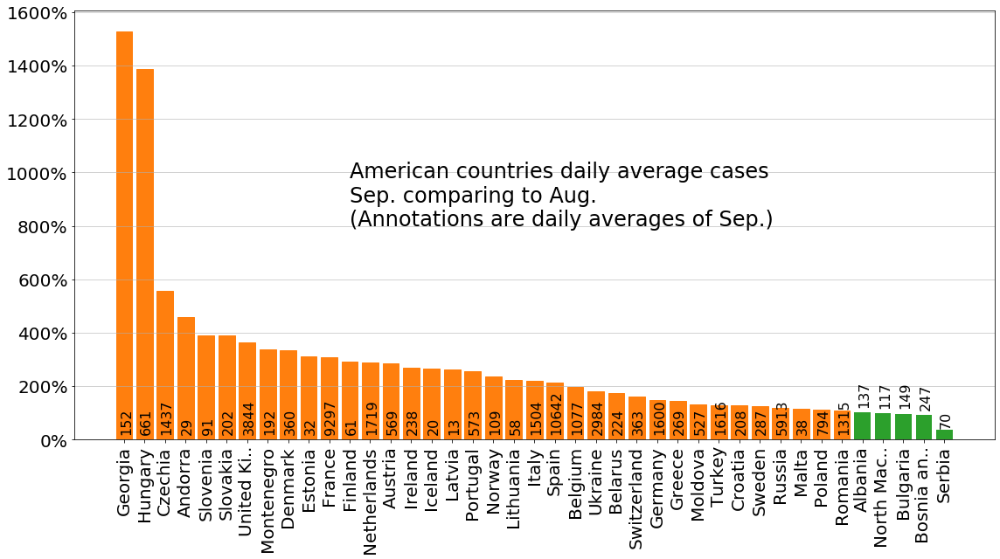

In [484]:
period = 31
# offset = 1
daily = ((df.iloc[-1] - df.iloc[-1-period])/ period).astype(int)
df = df.drop(daily[daily<=10].index, axis=1)

t = ((df.iloc[-1] - df.iloc[-1-period]) / (df.iloc[-1-period] - df.iloc[-1-2*period])).sort_values(ascending=False) * 100

fig, ax = plt.subplots(figsize=(16, 9))

bars = ax.bar(t.index, t.values, color='C2')
sep1 = t.index.get_loc(t[t<103].index[0])
sep2 = t.index.get_loc(t[t<97].index[0])

# for i in range(sep1):
#     bars[i].set_color('C1')
# for i in range(sep1, sep2):
#     bars[i].set_color('C0')
  
for i in range(sep1):
    ax.annotate(daily[t.index[i]], xy=(i+0.1,20), ha='center',va='bottom', fontsize=16, rotation=90)
    bars[i].set_color('C1')
for i in range(sep1, len(t)):
    ax.annotate(daily[t.index[i]], xy=(i+0.1,1.2*t[i]), ha='center',va='bottom', fontsize=16, rotation=90)
#     bars[i].set_color('C0')

ax.tick_params(labelsize=20)
ax.tick_params(axis='x', labelrotation=90)
# # ax.legend(fontsize=24)
ax.text(x=11,y=800, s='American countries daily average cases\nSep. comparing to Aug.\n(Annotations are daily averages of Sep.)', fontsize=24)
ax.grid(alpha=0.7, axis='y',)

# ax.set_xticklabels([us_state_abbrev[i] for i in t.index])
ax.yaxis.set_major_formatter(mtick.PercentFormatter())
fig.tight_layout()
plt.savefig('figures/Daily_misc_10_2Europe.png', dpi=100)

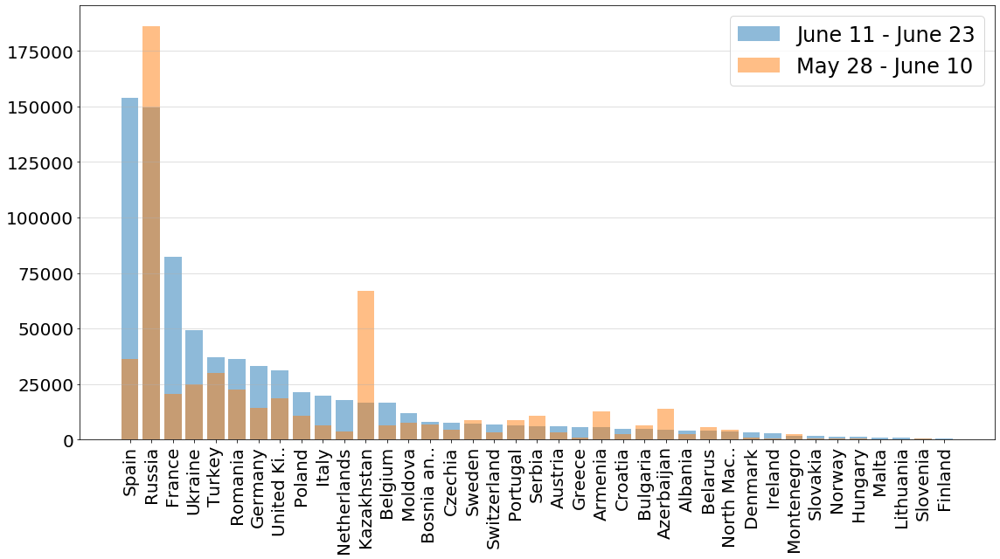

In [389]:
t1 = df.iloc[-1] - df.iloc[-31]
t2 = df.iloc[-31] - df.iloc[-61]

t2 = t2[t1.sort_values(ascending=False).index]
t1 = t1[t1.sort_values(ascending=False).index]

fig, ax = plt.subplots(figsize=(16, 9))

ax.bar(t1.index, t1.values, alpha=0.5, label='June 11 - June 23', )
ax.bar(t2.index, t2.values, alpha=0.5, label='May 28 - June 10')

ax.tick_params(labelsize=20)
ax.tick_params(axis='x', labelrotation=90)
ax.legend(fontsize=24)
ax.grid(alpha=0.5, axis='y')

# ax.set_yscale('log')
fig.tight_layout()
# plt.savefig('figures/Daily_misc_6_25.png', dpi=100)

# US ICU and death

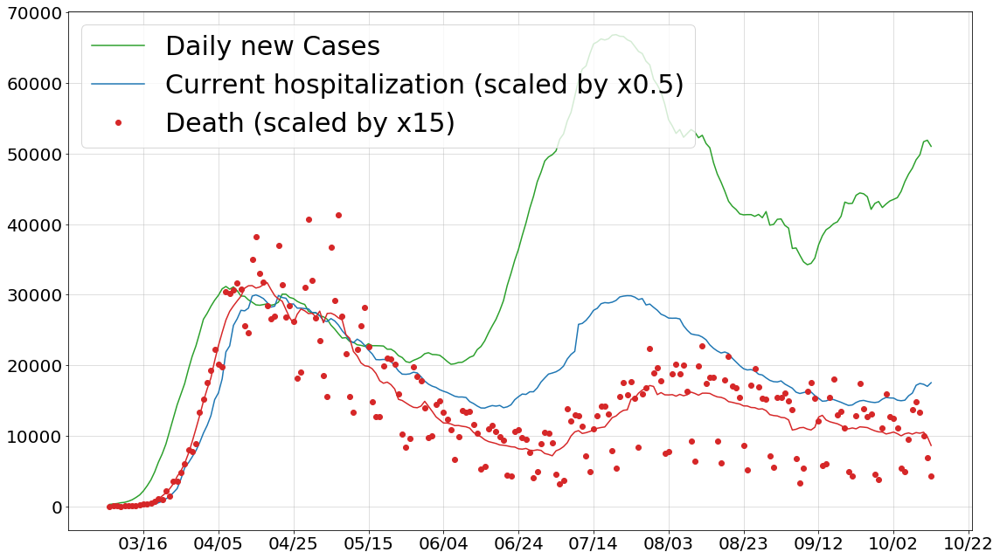

In [271]:
with urllib.request.urlopen("https://covidtracking.com/api/v1/states/daily.json") as url:
    data = json.loads(url.read().decode())
df = pd.DataFrame(data)
df.date = pd.to_datetime(df.date,yearfirst=True, format='%Y%m%d')

c = df.groupby('date').agg('sum').iloc[45:]

fig, ax = plt.subplots(figsize=(16, 9))

# ax.plot((c.positive - c.recovered - c.death).rolling(window=7, min_periods=1, center=True).mean()*0.1, label='New Cases')
ax.plot(c.positive.diff().rolling(window=7, min_periods=1, center=True).mean(), label='Daily new Cases', c='C2')
# ax.axvline(c.index[89],ymax=0.5, ls='--', lw=2, alpha=0.7, c='C2')

ax.plot(c.hospitalizedCurrently*0.5, label='Current hospitalization (scaled by x0.5)')
# ax.plot(c.inIcuCurrently*2, label='ICU (scaled by x2)')
ax.plot(c.deathIncrease*15, 'o', label='Death (scaled by x15)', c='C3', )
ax.plot(c.deathIncrease.rolling(window=7, min_periods=1, center=True).mean()*15, c='C3', )

ax.legend(loc=0, fontsize=30)
ax.tick_params(labelsize=20)
ax.xaxis.set_major_formatter(mdates.DateFormatter('%m/%d'))
ax.xaxis.set_major_locator(plt.MaxNLocator(15))
ax.grid(alpha=0.5)
# ax.axvline(c.index[99],ymax=0.43, ls='--', lw=2, alpha=0.7, c='C0')
# ax.axvline(c.index[106],ymax=0.34, ls='--', lw=2, alpha=0.7, c='C1')
plt.tight_layout()
plt.savefig('figures/Daily_misc_10_12.png', dpi=100)

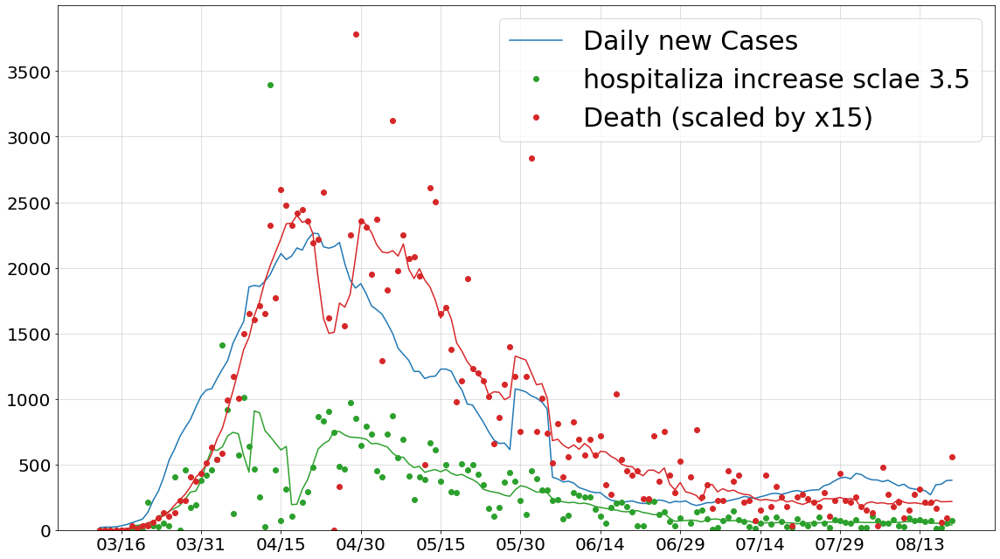

In [48]:
with urllib.request.urlopen("https://covidtracking.com/api/v1/states/daily.json") as url:
    data = json.loads(url.read().decode())
df = pd.DataFrame(data)
df.date = pd.to_datetime(df.date,yearfirst=True, format='%Y%m%d')

# c = df.groupby('date').agg('sum').iloc[45:]
c = df.query('state=="MA"').set_index('date').sort_index()

fig, ax = plt.subplots(figsize=(16, 9))

# ax.plot((c.positive - c.recovered - c.death).rolling(window=7, min_periods=1, center=True).mean()*0.1, label='New Cases')
ax.plot(c.positive.diff().rolling(window=7, min_periods=1, center=True).mean(), label='Daily new Cases', c='C0')
# ax.axvline(c.index[89],ymax=0.5, ls='--', lw=2, alpha=0.7, c='C2')

# ax.plot(c.hospitalizedCurrently*0.5, label='Current hospitalization (scaled by x0.5)')
ax.plot(c.hospitalizedIncrease*3.5, 'o', label='hospitaliza increase sclae 3.5', c='C2')
ax.plot(c.hospitalizedIncrease.rolling(window=7, min_periods=1, center=True).mean()*3.5, c='C2')

ax.plot(c.deathIncrease*15, 'o', label='Death (scaled by x15)', c='C3', )
ax.plot(c.deathIncrease.rolling(window=7, min_periods=1, center=True).mean()*15, c='C3', )

ax.legend(loc=0, fontsize=30)
ax.tick_params(labelsize=20)
ax.xaxis.set_major_formatter(mdates.DateFormatter('%m/%d'))
ax.xaxis.set_major_locator(plt.MaxNLocator(15))
ax.grid(alpha=0.5)
# ax.axvline(c.index[99],ymax=0.43, ls='--', lw=2, alpha=0.7, c='C0')
# ax.axvline(c.index[106],ymax=0.34, ls='--', lw=2, alpha=0.7, c='C1')
ax.set_ylim(bottom=0)
plt.tight_layout()
# plt.savefig('figures/Daily_misc_7_10.png', dpi=100)

# US state single day increase

US cases by state fetched for 2020-08-19


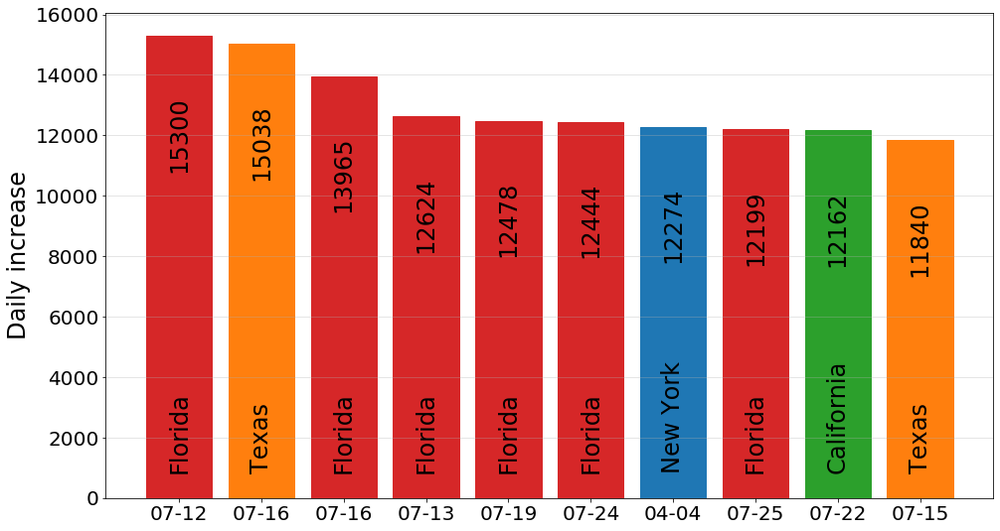

In [58]:
df = get_US()
t = df.unstack().sort_values(ascending=False).head(10)
labels = [i[0] + '_' + i[1].strftime('%m-%d') for i in t.index]

fig, ax = plt.subplots(figsize=(16, 9))

bars = ax.bar(labels, t.values, color='C2')

for i, state in enumerate(t.index.get_level_values('state')):
    bars[i].set_color('C'+str(['New York','Texas','California','Florida'].index(state)))
# #     bars[i].set_color('C'+str(t.index.get_level_values('state').unique().get_loc(state)))
    ax.annotate(state, xy=(i, 1000), rotation=90, fontsize=24, ha='center')
    ax.annotate(t.values[i], xy=(i, t.values[i]-2000), rotation=90, fontsize=24, ha='center', va='top')
    
ax.grid(axis='y', alpha=0.4)
ax.tick_params(labelsize=20)
ax.set_ylabel('Daily increase', fontsize=24)
ax.set_xticklabels([i.split('_')[1] for i in labels])
# plt.savefig('figures/Daily_misc_7_17.png', dpi=100)
plt.show()

# Ridge plot

D:\Anaconda\lib\site-packages\seaborn\axisgrid.py:861: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations
  self.fig.tight_layout()
D:\Anaconda\lib\site-packages\seaborn\axisgrid.py:861: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations
  self.fig.tight_layout()


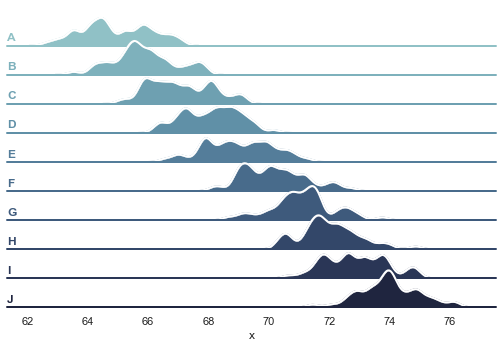

In [9]:
sns.set(style="white", rc={"axes.facecolor": (0, 0, 0, 0)})

# Create the data
rs = np.random.RandomState(1979)
x = rs.randn(500)
g = np.tile(list("ABCDEFGHIJ"), 50)
df = pd.DataFrame(dict(x=x, g=g))
m = df.g.map(ord)
df["x"] += m

# Initialize the FacetGrid object
pal = sns.cubehelix_palette(10, rot=-.25, light=.7)
g = sns.FacetGrid(df, row="g", hue="g", aspect=15, height=.5, palette=pal)

# Draw the densities in a few steps
g.map(sns.kdeplot, "x", clip_on=False, shade=True, alpha=1, lw=1.5, bw=.2)
g.map(sns.kdeplot, "x", clip_on=False, color="w", lw=2, bw=.2)
g.map(plt.axhline, y=0, lw=2, clip_on=False)


# Define and use a simple function to label the plot in axes coordinates
def label(x, color, label):
    ax = plt.gca()
    ax.text(0, .2, label, fontweight="bold", color=color,
            ha="left", va="center", transform=ax.transAxes)


g.map(label, "x")

# Set the subplots to overlap
g.fig.subplots_adjust(hspace=-.25)

# Remove axes details that don't play well with overlap
g.set_titles("")
g.set(yticks=[])
g.despine(bottom=True, left=True)

In [6]:
s='s=%r;print(s%%s)';print(s%s)

s='s=%r;print(s%%s)';print(s%s)


# Spain recent

Global cases (total) by country fetched for 08-04


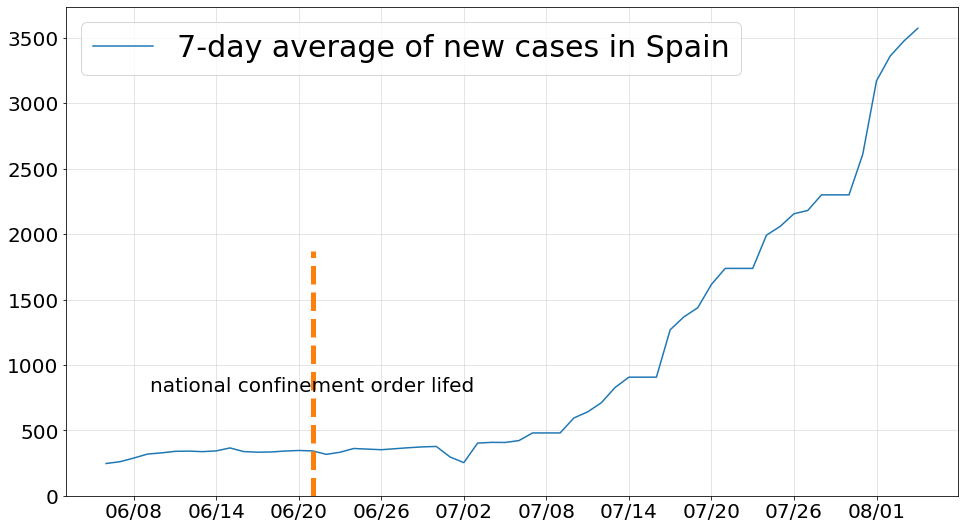

In [240]:
confirm = get_global_cases_total()

fig, ax = plt.subplots(figsize=(16, 9))

ax.plot(confirm['Spain'].diff()[-60:].rolling(window=7, min_periods=1, center=True).mean(),
        label='7-day average of new cases in Spain')

ax.xaxis.set_major_formatter(mdates.DateFormatter('%m/%d'))
ax.xaxis.set_major_locator(plt.MaxNLocator(12))
ax.set_ylim(bottom=0)
ax.legend(loc=0, fontsize=30)
ax.tick_params(labelsize=20)
ax.axvline(x=confirm.index[151], ymax=0.5, c='C1', lw=5, ls='--')
ax.text(x=confirm.index[151], y=800, s='national confinement order lifed', ha='center', fontsize=20)
ax.grid(alpha=0.4)
# plt.savefig('figures/Daily_misc_7_25a.png', dpi=100)

# US death

US deaths by state fetched for 2020-09-19
6
Index(['Missouri', 'Hawaii', 'Montana', 'North Dakota', 'South Dakota',
       'West Virginia', 'Puerto Rico'],
      dtype='object', name='state')


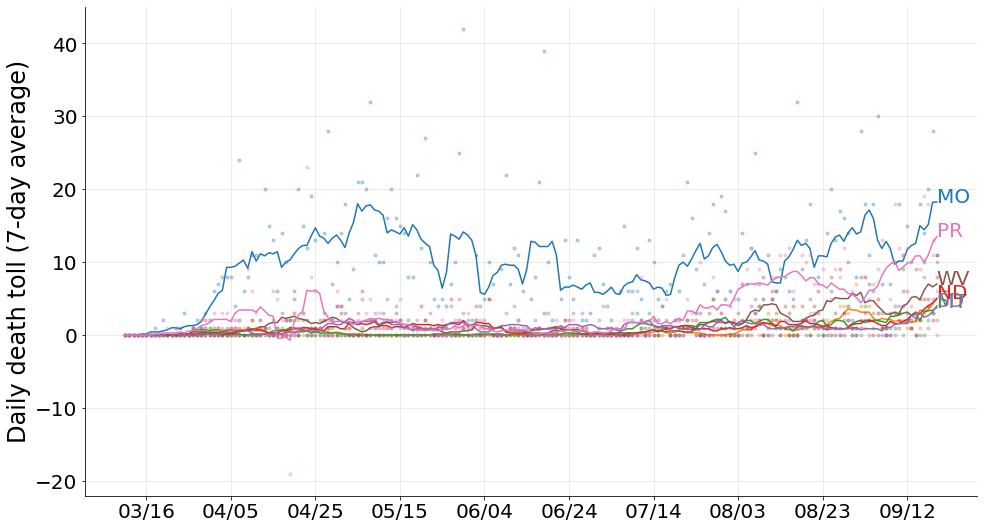

In [287]:
df = get_US_death().iloc[50:]
death_mean = df.rolling(window=7, min_periods=1, center=True).mean()

t = (death_mean / death_mean.max()).T.sort_values(death_mean.index[-1], ascending=False).T

fig, ax = plt.subplots(figsize=(16,9))

for i, state in enumerate(t.columns[:(t.iloc[-1] >= 1).sum()]):
    ax.plot(death_mean[state], c='C'+str(i))
    ax.plot(df[state], 'o', c='C'+str(i), alpha=0.3, markersize=3)
    ax.annotate(s=us_state_abbrev[state], xy=(df.index[-1], death_mean[state].values[-1]), 
                c='C'+str(i), fontsize=20)

print(i)
ax.xaxis.set_major_formatter(mdates.DateFormatter('%m/%d'))
ax.xaxis.set_major_locator(plt.MaxNLocator(12))
ax.tick_params(labelsize=20)
ax.grid(alpha=0.3)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.set_ylabel('Daily death toll (7-day average)', fontsize=24)
ax.set_ylim()
# plt.savefig('figures/Daily_misc_7_28.png', dpi=100)

print(t.T[t.T[t.index[-1]] == 1].index)

US deaths by state fetched for 2020-07-29


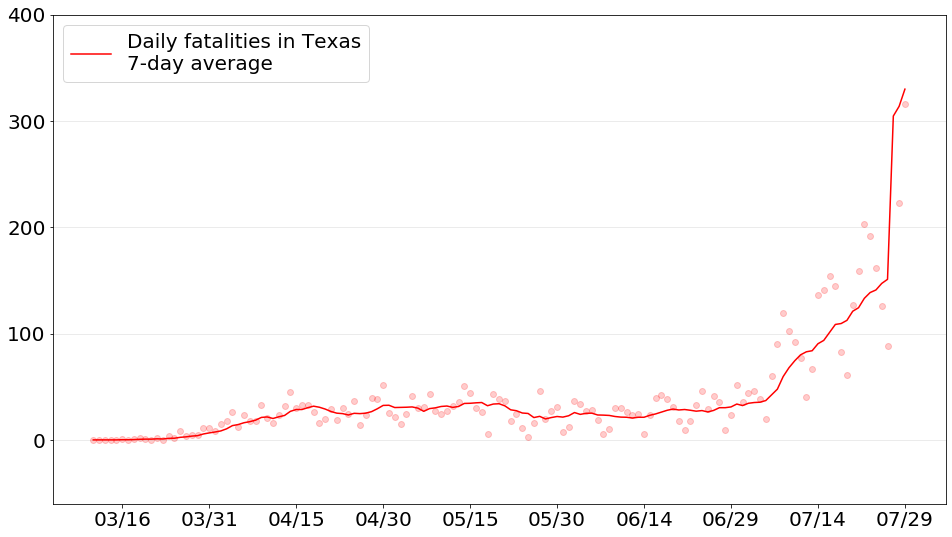

In [130]:
state = 'Texas'
df = get_US_death()
t = df[state].iloc[50:]

fig, ax = plt.subplots(figsize=(16,9))
ax.plot(t.rolling(window=7, min_periods=1).mean(), 'r', label='Daily fatalities in %s\n7-day average'%state)
ax.plot(t, 'o', c='r', alpha=0.2)

ax.set_ylim(top=400)
ax.xaxis.set_major_formatter(mdates.DateFormatter('%m/%d'))
ax.xaxis.set_major_locator(plt.MaxNLocator(12))
ax.tick_params(labelsize=20)
ax.legend(fontsize=20)
ax.grid(axis='y', alpha=0.3)
plt.savefig('figures/Daily_misc_7_30.png', dpi=100)

## Peaking time

In [64]:
confirm

Country/Region,Global,US,Brazil,India,Russia,South Africa,Peru,Mexico,Chile,United Kingdom,...,Fiji,Saint Lucia,Timor-Leste,Grenada,Laos,Dominica,Saint Kitts and Nevis,Holy See,Western Sahara,MS Zaandam
Global,,,,,,,,,,,,,,,,,,,,,
2020-01-22,555,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2020-01-23,654,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2020-01-24,941,2,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2020-01-25,1434,2,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2020-01-26,2118,5,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-07-19,14507589,3773260,2098389,1118206,770311,364328,353590,344224,330930,296358,...,27,23,24,23,19,18,17,12,10,9
2020-07-20,14714367,3834677,2118646,1155338,776212,373628,357681,349396,333029,296944,...,27,23,24,23,19,18,17,12,10,9
2020-07-21,14947822,3899211,2159654,1193078,782040,381798,362087,356255,334683,297389,...,27,23,24,23,19,18,17,12,10,9


# Israel R

$$\text{Infection}_{t} = \frac{R}{\text{GAMMA}}\times\sum_{i=1}^{GAMMA}\text{Infection}_{t-i}$$

Global cases (total) by country fetched for 10-09


IndexError: list index out of range

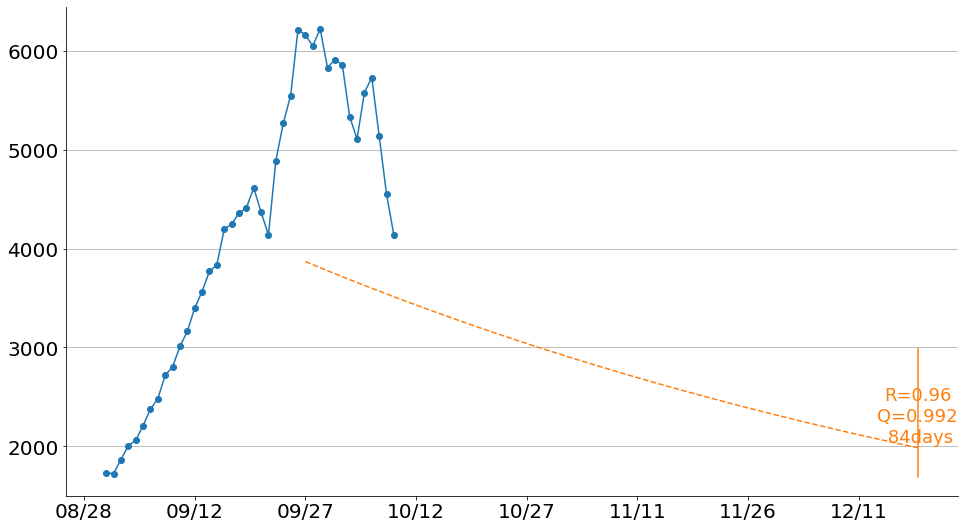

In [110]:
GAMMA = 7

confirm = get_global_cases_total()
now = confirm['Israel'].diff()[-60:].rolling(window=7, min_periods=1).mean()

forecasts = []
for q in [0.992]:
    t = np.array([now.values[-14]])
    while t[-1] > 2000:
        t = np.append(t, t[-1:] * q)
    t = t[len(now)-1:]
    forecast = pd.Series(data=t, index=pd.date_range(pd.to_datetime('2020-09-27'), periods=len(t), freq='D'))
    forecasts.append((q, forecast, len(forecast)))
    
fig, ax = plt.subplots(figsize=(16,9))

ax.plot(now[20:], 'o-')
for i, forecast in enumerate(forecasts):
    ax.plot(forecast[1], ls='--')
    ax.annotate(s='R=%s\nQ=%s\n %sdays'%(np.round(forecast[0]**4.5,2),forecast[0], forecast[2]), xy=(forecast[1].index[-1], 2000), 
               va='bottom', ha='center', fontsize=18, c='C'+str(i+1))
    ax.axvline(x=forecast[1].index[-1], ymin=0.038, ymax=0.3, c='C'+str(i+1))

ax.xaxis.set_major_formatter(mdates.DateFormatter('%m/%d'))
ax.xaxis.set_major_locator(plt.MaxNLocator(12))
ax.tick_params(labelsize=20)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.grid(axis='x', alpha=0.3)
ax.grid()
# plt.savefig('figures/Israel.png', dpi=100)

pd.DataFrame(index=forecasts[0][1].index[1:], data={'Senario A':forecasts[0][1].astype(int),
                                               'Senario B':forecasts[1][1].astype(int),
                                               'Senario C':forecasts[2][1].astype(int),
                                               }).to_csv('Israel_to_1.csv')

Global cases (total) by country fetched for 08-22
Global cases (total) by country fetched for 08-22
Global deaths (total) by country fetched for 08-22
Global recovers (total) by country fetched for 08-22


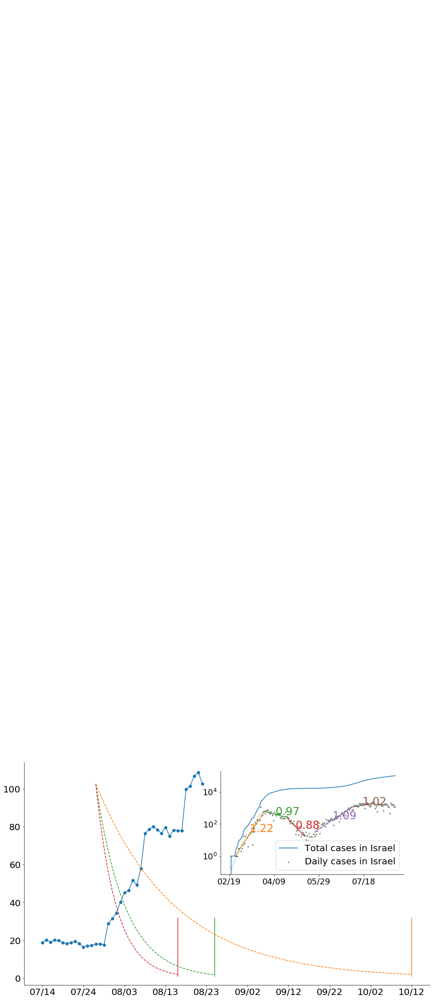

In [103]:
def linear_fit(x, a, b):
    return  a*x+b

def country_dynamics(category, country, cut, days):
    fig, ax = plt.subplots(nrows=1, ncols=1, sharey=True, figsize=(16,9))
    ax.set_yscale('log')
    cum = data[category].copy().T[[country]]
    cum['time'] = pd.to_datetime(cum.index)
    cum.index = cum.time.dt.strftime('%m/%d')
    cum.drop('time', axis=1, inplace=True)
    
    focus = (cum - cum.shift(1)).iloc[cut:,:]
    
    ax.plot(cum.iloc[cut:,:], alpha=0.8, lw=2, label='Daily Cases in ' + country )
    ax.scatter(focus.index, focus[country], c='gray', s=5)
    ax.plot(focus[country].rolling(window=7, min_periods=1, center=True).mean(), c='green',alpha=0.3)
    
    for i,(a,b) in enumerate(days):
        slope, intercept = optimize.curve_fit(linear_fit, np.arange(a,b), np.log(focus[country].values[a:b]+1))[0]
        ax.plot(np.arange(a,b), np.exp(np.arange(a,b)*slope + intercept), c=('C'+str(i+1)))
        ax.annotate(np.round(np.exp(slope),2), 
                    xy=((a+b-2)/2, np.exp((a+b+2)/2*slope + intercept)), fontsize=24, c=('C'+str(i+1)))                    
            
    ax.legend(prop={'size': 30})
    ax.tick_params(labelsize=20)
    ax.xaxis.set_major_locator(plt.MaxNLocator(12))
    ax.format_xdata = mdates.DateFormatter('%m-%d')
#     plt.tight_layout()
    return ax


GAMMA = 7

confirm = get_global_cases_total()
now = confirm['Ireland'].diff()[-60:].rolling(window=7, min_periods=1).mean()

forecasts = []
for q in [0.95, 0.87, 0.82]:
    t = now.values
    while t[-1] > 2:
        t = np.append(t, t[-1:] * q)
    t = t[len(now)-1:]
    forecast = pd.Series(data=t, index=pd.date_range(pd.to_datetime('2020-07-27'), periods=len(t), freq='D'))
    forecasts.append((q, forecast, len(forecast)))
    
fig, ax = plt.subplots(figsize=(16,9))

ax.plot(now[20:], 'o-')
for i, forecast in enumerate(forecasts):
    ax.plot(forecast[1], ls='--')
    ax.annotate(s='R=%s\nQ=%s\n %sdays'%(np.round(forecast[0]**4,2),forecast[0], forecast[2]), xy=(forecast[1].index[-1], 500), 
               va='bottom', ha='center', fontsize=18, c='C'+str(i+1))
    ax.axvline(x=forecast[1].index[-1], ymin=0.038, ymax=0.3, c='C'+str(i+1))

ax.xaxis.set_major_formatter(mdates.DateFormatter('%m/%d'))
ax.xaxis.set_major_locator(plt.MaxNLocator(12))
ax.tick_params(labelsize=20)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
# ax.grid(axis='x', alpha=0.3)
# ax.grid()

ax2 = plt.axes([0.50, 0.5, 0.35, 0.35])
confirm = get_global_cases_total()
death = get_global_deaths_total()
recover = get_global_recovers_total()
data = {'Confirmed':confirm.T, 'Death':death.T, 'Recovered':recover}
category = 'Confirmed'
country = 'Israel'
cut = 28
days = [(7,40),(40,65),(65,85),(95,137),(137,162)]
# ax2 = country_dynamics('Confirmed', 'Israel',28, [(7,40),(40,65),(65,85),(95,137),(137,162)])


ax2.set_yscale('log')
cum = data[category].copy().T[[country]]
cum['time'] = pd.to_datetime(cum.index)
cum.index = cum.time.dt.strftime('%m/%d')
cum.drop('time', axis=1, inplace=True)

focus = (cum - cum.shift(1)).iloc[cut:,:]

ax2.plot(cum.iloc[cut:,:], alpha=0.8, lw=2, label='Total cases in ' + country )
ax2.scatter(focus.index, focus[country], c='gray', s=5, label='Daily cases in ' + country )
ax2.plot(focus[country].rolling(window=7, min_periods=1, center=True).mean(), c='green',alpha=0.3)

for i,(a,b) in enumerate(days):
    slope, intercept = optimize.curve_fit(linear_fit, np.arange(a,b), np.log(focus[country].values[a:b]+1))[0]
    ax2.plot(np.arange(a,b), np.exp(np.arange(a,b)*slope + intercept), c=('C'+str(i+1)))
    ax2.annotate(np.round(np.exp(slope),2), 
                xy=((a+b-2)/2, np.exp((a+b+2)/2*slope + intercept)), fontsize=24, c=('C'+str(i+1)))                    

ax2.legend(prop={'size': 20})
ax2.tick_params(labelsize=18)
ax2.xaxis.set_major_locator(plt.MaxNLocator(5))
ax2.format_xdata = mdates.DateFormatter('%m-%d')
ax2.spines['right'].set_visible(False)
ax2.spines['top'].set_visible(False)
# ax2.spines['left'].set_visible(False)
# ax2.spines['bottom'].set_visible(False)

# plt.savefig('figures/Israel_2.png', dpi=100)



Global cases (total) by country fetched for 08-24
Global cases (total) by country fetched for 08-24
Global deaths (total) by country fetched for 08-24
Global recovers (total) by country fetched for 08-24


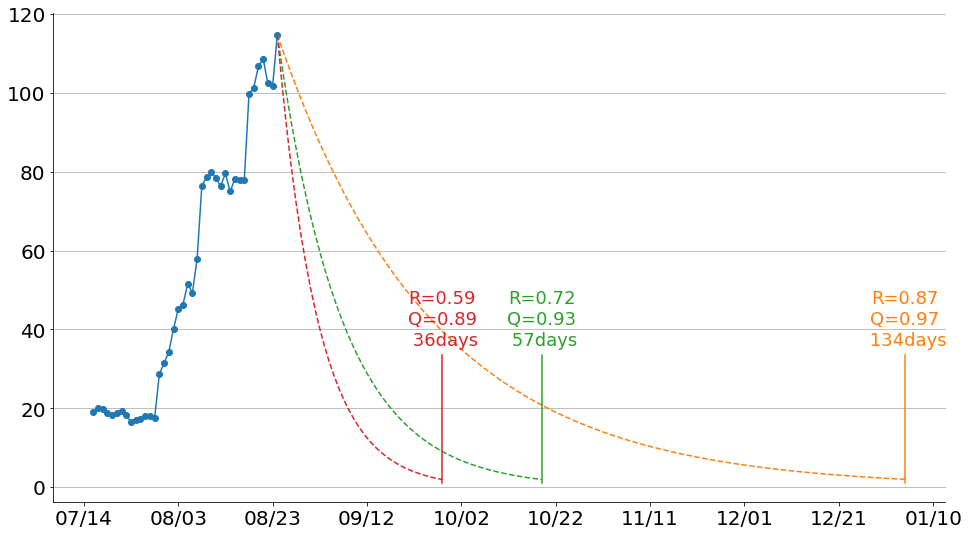

In [149]:
GAMMA = 4.5

confirm = get_global_cases_total()
now = confirm['Ireland'].diff()[-60:].rolling(window=7, min_periods=1).mean()

forecasts = []
for q in [0.97, 0.93, 0.89]:
    t = now.values
    while t[-1] > 2:
        t = np.append(t, t[-1:] * q)
    t = t[len(now)-1:]
    forecast = pd.Series(data=t, index=pd.date_range(pd.to_datetime('2020-08-24'), periods=len(t), freq='D'))
    forecasts.append((q, forecast, len(forecast)))
    
fig, ax = plt.subplots(figsize=(16,9))

ax.plot(now[20:], 'o-')
for i, forecast in enumerate(forecasts):
    ax.plot(forecast[1], ls='--')
    ax.annotate(s='R=%s\nQ=%s\n %sdays'%(np.round(forecast[0]**GAMMA,2),forecast[0], forecast[2]), xy=(forecast[1].index[-1], 35), 
               va='bottom', ha='center', fontsize=18, c='C'+str(i+1))
    ax.axvline(x=forecast[1].index[-1], ymin=0.038, ymax=0.3, c='C'+str(i+1))

ax.xaxis.set_major_formatter(mdates.DateFormatter('%m/%d'))
ax.xaxis.set_major_locator(plt.MaxNLocator(12))
ax.tick_params(labelsize=20)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.grid(axis='x', alpha=0.3)
ax.grid()

# ax2 = plt.axes([0.50, 0.5, 0.35, 0.35])
confirm = get_global_cases_total()
death = get_global_deaths_total()
recover = get_global_recovers_total()
data = {'Confirmed':confirm.T, 'Death':death.T, 'Recovered':recover}
category = 'Confirmed'
country = 'Ireland'
cut = 40
days = [(25,48),(48,84)]
# ax2 = country_dynamics('Confirmed', 'Ireland',40, [(25,48),(48,84)])


# ax2.set_yscale('log')
# cum = data[category].copy().T[[country]]
# cum['time'] = pd.to_datetime(cum.index)
# cum.index = cum.time.dt.strftime('%m/%d')
# cum.drop('time', axis=1, inplace=True)

# focus = (cum - cum.shift(1)).iloc[cut:,:]

# ax2.plot(cum.iloc[cut:,:], alpha=0.8, lw=2, label='Total cases in ' + country )
# ax2.scatter(focus.index, focus[country], c='gray', s=5, label='Daily cases in ' + country )
# ax2.plot(focus[country].rolling(window=7, min_periods=1, center=True).mean(), c='green',alpha=0.3)

# for i,(a,b) in enumerate(days):
#     slope, intercept = optimize.curve_fit(linear_fit, np.arange(a,b), np.log(focus[country].values[a:b]+1))[0]
#     ax2.plot(np.arange(a,b), np.exp(np.arange(a,b)*slope + intercept), c=('C'+str(i+1)))
#     ax2.annotate(np.round(np.exp(slope),2), 
#                 xy=((a+b-2)/2, np.exp((a+b+2)/2*slope + intercept)), fontsize=24, c=('C'+str(i+1)))                    

# ax2.legend(prop={'size': 20})
# ax2.tick_params(labelsize=18)
# ax2.xaxis.set_major_locator(plt.MaxNLocator(5))
# ax2.format_xdata = mdates.DateFormatter('%m-%d')
# ax2.spines['right'].set_visible(False)
# ax2.spines['top'].set_visible(False)

# ax2.spines['left'].set_visible(False)
# ax2.spines['bottom'].set_visible(False)

# plt.savefig('figures/Israel_2.png', dpi=100)

Global cases (total) by country fetched for 08-29
Global cases (total) by country fetched for 08-29
Global deaths (total) by country fetched for 08-29
Global recovers (total) by country fetched for 08-29


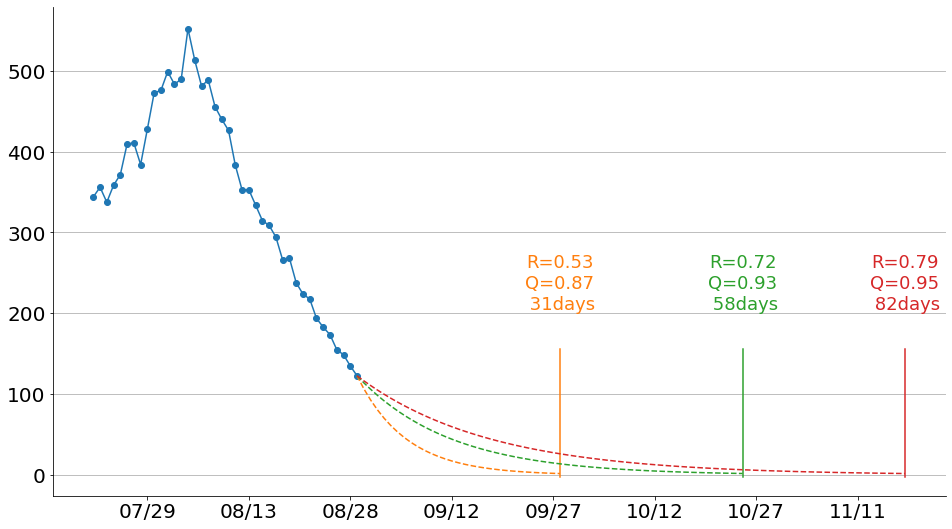

In [318]:
GAMMA = 4.5

confirm = get_global_cases_total()
now = confirm['Australia'].diff()[-60:].rolling(window=7, min_periods=1).mean()

forecasts = []
for q in [0.87, 0.93, 0.95]:
    t = now.values
    while t[-1] > 2:
        t = np.append(t, t[-1:] * q)
    t = t[len(now)-1:]
    forecast = pd.Series(data=t, index=pd.date_range(pd.to_datetime('2020-08-29'), periods=len(t), freq='D'))
    forecasts.append((q, forecast, len(forecast)))
    
fig, ax = plt.subplots(figsize=(16,9))

ax.plot(now[20:], 'o-')
for i, forecast in enumerate(forecasts):
    ax.plot(forecast[1], ls='--')
    ax.annotate(s='R=%s\nQ=%s\n %sdays'%(np.round(forecast[0]**GAMMA,2),forecast[0], forecast[2]), xy=(forecast[1].index[-1], 200), 
               va='bottom', ha='center', fontsize=18, c='C'+str(i+1))
    ax.axvline(x=forecast[1].index[-1], ymin=0.038, ymax=0.3, c='C'+str(i+1))

# ax.set_yscale('log')
ax.xaxis.set_major_formatter(mdates.DateFormatter('%m/%d'))
ax.xaxis.set_major_locator(plt.MaxNLocator(12))
ax.tick_params(labelsize=20)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.grid(axis='x', alpha=0.3)
ax.grid()

# ax2 = plt.axes([0.50, 0.5, 0.35, 0.35])
confirm = get_global_cases_total()
death = get_global_deaths_total()
recover = get_global_recovers_total()
data = {'Confirmed':confirm.T, 'Death':death.T, 'Recovered':recover}
category = 'Confirmed'
country = 'Australia'
cut = 40
days = [(25,48),(48,84)]
# ax2 = country_dynamics('Confirmed', 'Ireland',40, [(25,48),(48,84)])


# ax2.set_yscale('log')
# cum = data[category].copy().T[[country]]
# cum['time'] = pd.to_datetime(cum.index)
# cum.index = cum.time.dt.strftime('%m/%d')
# cum.drop('time', axis=1, inplace=True)

# focus = (cum - cum.shift(1)).iloc[cut:,:]

# ax2.plot(cum.iloc[cut:,:], alpha=0.8, lw=2, label='Total cases in ' + country )
# ax2.scatter(focus.index, focus[country], c='gray', s=5, label='Daily cases in ' + country )
# ax2.plot(focus[country].rolling(window=7, min_periods=1, center=True).mean(), c='green',alpha=0.3)

# for i,(a,b) in enumerate(days):
#     slope, intercept = optimize.curve_fit(linear_fit, np.arange(a,b), np.log(focus[country].values[a:b]+1))[0]
#     ax2.plot(np.arange(a,b), np.exp(np.arange(a,b)*slope + intercept), c=('C'+str(i+1)))
#     ax2.annotate(np.round(np.exp(slope),2), 
#                 xy=((a+b-2)/2, np.exp((a+b+2)/2*slope + intercept)), fontsize=24, c=('C'+str(i+1)))                    

# ax2.legend(prop={'size': 20})
# ax2.tick_params(labelsize=18)
# ax2.xaxis.set_major_locator(plt.MaxNLocator(5))
# ax2.format_xdata = mdates.DateFormatter('%m-%d')
# ax2.spines['right'].set_visible(False)
# ax2.spines['top'].set_visible(False)

# ax2.spines['left'].set_visible(False)
# ax2.spines['bottom'].set_visible(False)

# plt.savefig('figures/Israel_2.png', dpi=100)

# US states test positive 

In [31]:
with urllib.request.urlopen("https://covidtracking.com/api/v1/states/daily.json") as url:
    data = json.loads(url.read().decode())
df = pd.DataFrame(data)
df['date'] = pd.to_datetime(df.date, format='%Y%m%d')

t = df.set_index('date')[['state','positiveIncrease','totalTestResultsIncrease']]
t = t[t.totalTestResultsIncrease > 0]
t['positiverate'] = t['positiveIncrease'] / t['totalTestResultsIncrease']
t = t.pivot_table(index=t.index, columns='state', values='positiverate')[40:]

t.iloc[-1].sort_values()

state
MP    0.004854
VT    0.006356
NY    0.007172
CT    0.008356
AK    0.012098
WV    0.012364
ME    0.012441
MA    0.014251
NJ    0.014940
MT    0.014995
NH    0.015355
DC    0.018908
NM    0.020068
CO    0.025381
MI    0.025578
MD    0.033088
LA    0.034996
PA    0.036725
VA    0.037460
DE    0.037727
OH    0.040008
GU    0.042000
IL    0.046358
CA    0.047691
NC    0.052097
WY    0.056040
NE    0.061939
MS    0.062120
AZ    0.072965
UT    0.074051
TN    0.075247
IN    0.075944
SC    0.076690
VI    0.076923
OR    0.078099
WI    0.078481
HI    0.081918
GA    0.082686
KY    0.084400
AL    0.087860
MO    0.088314
MN    0.094488
ND    0.096931
IA    0.105339
KS    0.114270
FL    0.132260
ID    0.144664
SD    0.165703
NV    0.167172
TX    0.198459
PR    1.000000
OK    1.000000
WA    1.000000
AR    1.000000
AS         NaN
RI         NaN
Name: 2020-08-17 00:00:00, dtype: float64

# Egypt reduction

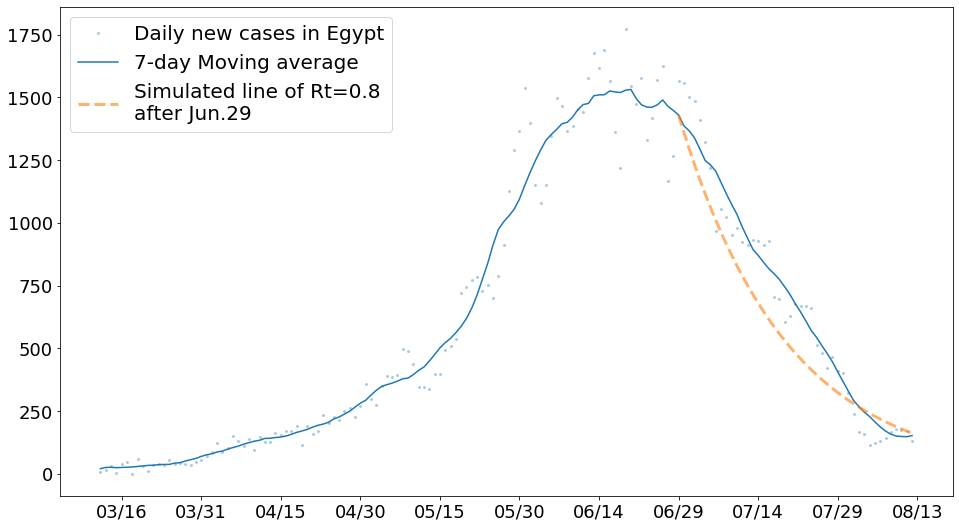

In [419]:
confirm = pd.read_csv('data/JH/confirm_agg.csv').set_index('Country/Region')
t = confirm.T['Egypt'].diff()[50:]
t.index = pd.to_datetime(t.index)

offset = 109
start = np.array([t.rolling(window=14, min_periods=1, center=True).mean().values[offset]])
for i in range(offset+1, len(t)):
    start = np.append(start, start[-1] * np.power(0.8, 1/4.5))
t1 = pd.Series(index=t.index[offset:], data=start)

fig, ax = plt.subplots(figsize=(16,9))

ax.plot(t,'o', markersize=2, alpha=0.3, label='Daily new cases in Egypt')
ax.plot(t.rolling(window=14, min_periods=1, center=True).mean(), c='C0', label='7-day Moving average')
ax.plot(t1, '--', lw=3, alpha=0.6, label='Simulated line of Rt=0.8\nafter Jun.29')

ax.legend(fontsize=20)
ax.tick_params(labelsize=18)
ax.xaxis.set_major_locator(plt.MaxNLocator(12))
ax.xaxis.set_major_formatter(mdates.DateFormatter('%m/%d'))

# plt.savefig('figures/Egypt1.png', dpi=100)

# Would growth

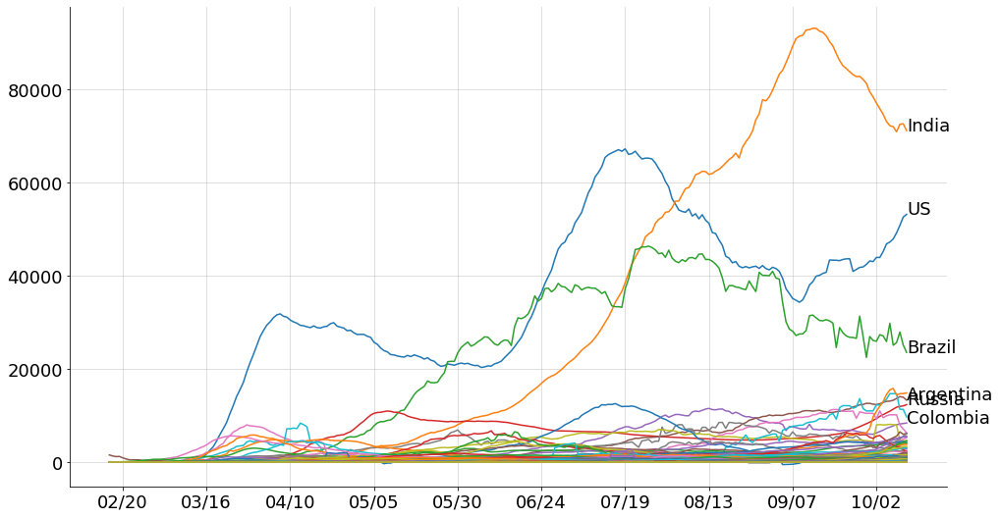

In [281]:
confirm = pd.read_csv('data/JH/confirm_agg.csv').set_index('Country/Region')
confirm = confirm.sort_values(confirm.columns[-1], ascending=False).T.diff().iloc[-240:]
confirm.index = pd.to_datetime(confirm.index)

confirm = confirm[:-1]

fig, ax = plt.subplots(figsize=(16,9))

# ax.plot(confirm.sum(axis=1).rolling(window=7, min_periods=1, center=True).mean())
for i, country in enumerate(confirm.columns):
# for i, country in enumerate([i for i in confirm.columns if i in africa]):    
    ax.plot(confirm[country].rolling(window=7, min_periods=1, center=True).mean())
    if i < 6:
        ax.annotate(country, xy=(confirm.index[-1], confirm[country].rolling(window=7, min_periods=1, center=True).mean().values[-1]),
                   fontsize=18)

# ax.legend(fontsize=20)

ax.tick_params(labelsize=18)
ax.xaxis.set_major_locator(plt.MaxNLocator(12))
ax.xaxis.set_major_formatter(mdates.DateFormatter('%m/%d'))
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.grid(alpha=0.5)
plt.savefig('figures/daily_misc_10_13.png', dpi=100)

# Target Line Segemented Regression

In [248]:
focus

2020-07-30    1737.0
2020-07-31     934.0
2020-08-01    1248.0
2020-08-02     597.0
2020-08-03    1615.0
               ...  
2020-10-07    4455.0
2020-10-08    3855.0
2020-10-09    2522.0
2020-10-10    2017.0
10-11          618.0
Name: Israel, Length: 74, dtype: float64

In [177]:
focus.index[207]

'09-25'

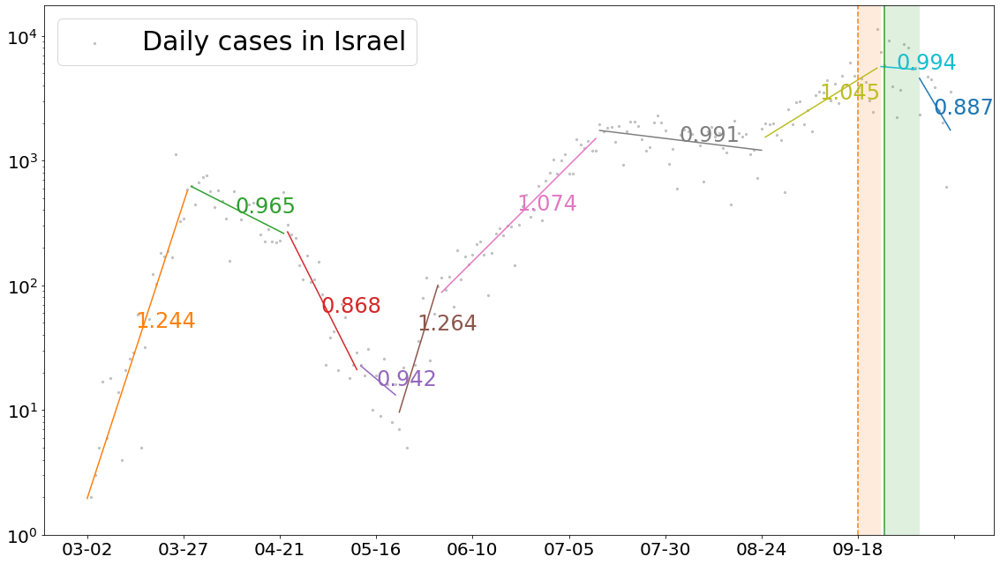

In [272]:
def linear_fit(x, a, b):
    return  a*x+b


title = 'Israel'
days = [(0,27),(27,52),(52,71),(71,81),(81,92),(92,133),(133,176),(176,206),(206,216),(216,225)]


confirm = pd.read_csv('data/JH/confirm_agg.csv').set_index('Country/Region').T
focus = confirm['Israel'].diff()[40:]
focus.index = pd.to_datetime(focus.index).strftime('%m-%d')
fig, ax = plt.subplots(nrows=1, ncols=1, sharey=True, figsize=(16,9))
ax.scatter(focus.index, focus.values, c='gray', s=5, alpha=0.4, label=r'Daily cases in %s'%title)
# ax.plot(focus.rolling(window=3, min_periods=1, center=True).mean(), c='green',alpha=0.3)

for i,(a,b) in enumerate(days):
    slope, intercept = optimize.curve_fit(linear_fit, np.arange(a,b), np.log(focus.values[a:b]+1))[0]
    ax.plot(np.arange(a,b), np.exp(np.arange(a,b)*slope + intercept), c=('C'+str(i+1)))
    ax.annotate(np.round(np.exp(slope),3), 
                xy=((a+b-2)/2, np.exp((a+b+2)/2*slope + intercept)), fontsize=24, c=('C'+str(i+1)))                    

ax.legend(prop={'size': 30})
ax.tick_params(labelsize=20)
ax.xaxis.set_major_locator(plt.MaxNLocator(12))
ax.format_xdata = mdates.DateFormatter('%m-%d')
ax.set_yscale('log')
ax.set_ylim(bottom=1, )
ax.axvline(x=focus.index[200], ls='--', c='C1')
ax.axvspan(xmin=focus.index[200],  xmax=focus.index[206], facecolor='C1', alpha=0.15)
ax.axvline(x=focus.index[207], c='C2')
ax.axvspan(xmin=focus.index[207],  xmax=focus.index[216], facecolor='C2', alpha=0.15)

plt.tight_layout()

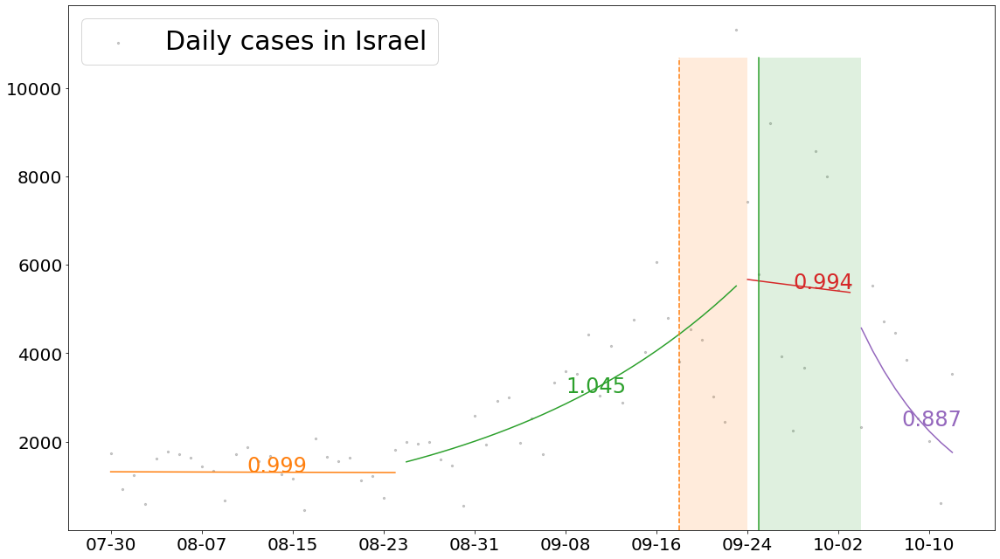

In [279]:
def linear_fit(x, a, b):
    return  a*x+b


title = 'Israel'
days = [(0,26),(26,56),(56,66),(66,75)]


confirm = pd.read_csv('data/JH/confirm_agg.csv').set_index('Country/Region').T
focus = confirm['Israel'].diff()[190:]
# focus = focus.rolling(window=3, min_periods=1, center=True).mean()
focus.index = pd.to_datetime(focus.index).strftime('%m-%d')
fig, ax = plt.subplots(nrows=1, ncols=1, sharey=True, figsize=(16,9))
ax.scatter(focus.index, focus.values, c='gray', s=5, alpha=0.4, label=r'Daily cases in %s'%title)
# ax.plot(focus.rolling(window=3, min_periods=1, center=True).mean(), c='green',alpha=0.3)

for i,(a,b) in enumerate(days):
    slope, intercept = optimize.curve_fit(linear_fit, np.arange(a,b), np.log(focus.values[a:b]+1))[0]
    ax.plot(np.arange(a,b), np.exp(np.arange(a,b)*slope + intercept), c=('C'+str(i+1)))
    ax.annotate(np.round(np.exp(slope),3), 
                xy=((a+b-2)/2, np.exp((a+b+2)/2*slope + intercept)), fontsize=24, c=('C'+str(i+1)))                    

ax.legend(prop={'size': 30})
ax.tick_params(labelsize=20)
ax.xaxis.set_major_locator(plt.MaxNLocator(12))
ax.format_xdata = mdates.DateFormatter('%m-%d')
# ax.set_yscale('log')
ax.set_ylim(bottom=1, )
ax.axvline(x=focus.index[50], ls='--', c='C1', ymax=0.9)
ax.axvspan(xmin=focus.index[50],  xmax=focus.index[56], facecolor='C1', ymax=0.9, alpha=0.15)
ax.axvline(x=focus.index[57], c='C2', ymax=0.9)
ax.axvspan(xmin=focus.index[57],  xmax=focus.index[66], facecolor='C2', ymax=0.9, alpha=0.15)


# a = np.array([5500])
# for i in range(19):
#     a = np.append(a, a[-1]*1.045)
# ax.plot(np.arange(55,75), a, ls='-.', c='C2')
# ax.annotate(s='Today(Oct.12) \n%s'%int(a[-1]), xy=(55+19, a[-1]+100), fontsize=20, va='bottom', ha='center', c='C2')

# b = np.array([1750])
# while b[-1] > 10:
#     b = np.append(b, b[-1]*.887)
# ax.plot(np.arange(74,74+len(b)), b, ls='-.', c='C4')
# ax.annotate(s=str(len(b))+' days', xy=(71+len(b), 100), fontsize=20, ha='center', c='C4')
# ax.set_ylim(top=14000)
plt.tight_layout()



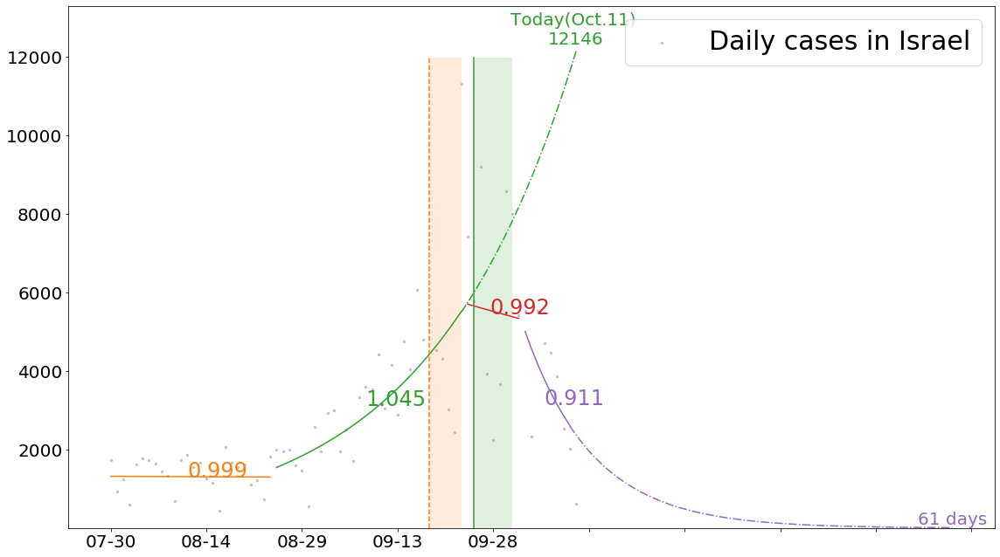

In [251]:
def linear_fit(x, a, b):
    return  a*x+b


title = 'Israel'
days = [(0,26),(26,56),(56,65),(65,73)]


confirm = pd.read_csv('data/JH/confirm_agg.csv').set_index('Country/Region').T
focus = confirm['Israel'].diff()[190:]
# focus = focus.rolling(window=3, min_periods=1, center=True).mean()
focus.index = pd.to_datetime(focus.index).strftime('%m-%d')
fig, ax = plt.subplots(nrows=1, ncols=1, sharey=True, figsize=(16,9))
ax.scatter(focus.index, focus.values, c='gray', s=5, alpha=0.4, label=r'Daily cases in %s'%title)
# ax.plot(focus.rolling(window=3, min_periods=1, center=True).mean(), c='green',alpha=0.3)

for i,(a,b) in enumerate(days):
    slope, intercept = optimize.curve_fit(linear_fit, np.arange(a,b), np.log(focus.values[a:b]+1))[0]
    ax.plot(np.arange(a,b), np.exp(np.arange(a,b)*slope + intercept), c=('C'+str(i+1)))
    ax.annotate(np.round(np.exp(slope),3), 
                xy=((a+b-2)/2, np.exp((a+b+2)/2*slope + intercept)), fontsize=24, c=('C'+str(i+1)))                    

ax.legend(prop={'size': 30})
ax.tick_params(labelsize=20)
ax.xaxis.set_major_locator(plt.MaxNLocator(12))
ax.format_xdata = mdates.DateFormatter('%m-%d')
# ax.set_yscale('log')
ax.set_ylim(bottom=1, )
ax.axvline(x=focus.index[50], ls='--', c='C1', ymax=0.9)
ax.axvspan(xmin=focus.index[50],  xmax=focus.index[55], facecolor='C1', ymax=0.9, alpha=0.15)
ax.axvline(x=focus.index[57], c='C2', ymax=0.9)
ax.axvspan(xmin=focus.index[57],  xmax=focus.index[63], facecolor='C2', ymax=0.9, alpha=0.15)


a = np.array([5500])
for i in range(18):
    a = np.append(a, a[-1]*1.045)
ax.plot(np.arange(55,74), a, ls='-.', c='C2')
ax.annotate(s='Today(Oct.11) \n%s'%int(a[-1]), xy=(54+19, a[-1]+100), fontsize=20, va='bottom', ha='center', c='C2')

b = np.array([2600])
while b[-1] > 10:
    b = np.append(b, b[-1]*.911)
ax.plot(np.arange(72,72+len(b)), b, ls='-.', c='C4')
ax.annotate(s=str(len(b))+' days', xy=(71+len(b), 100), fontsize=20, ha='center', c='C4')
ax.set_ylim(top=13300)
plt.tight_layout()



In [151]:
b

array([ 6214.        ,  6512.272     ,  6824.861056  ,  7152.45438669,
        7495.77219725,  7855.56926272,  8232.63658733,  8627.80314352,
        9041.93769441,  9475.95070374,  9930.79633752, 10407.47456172,
       10907.03334068, 11430.57094104, 11979.23834621, 12554.24178682,
       13156.84539259, 12512.15996835])

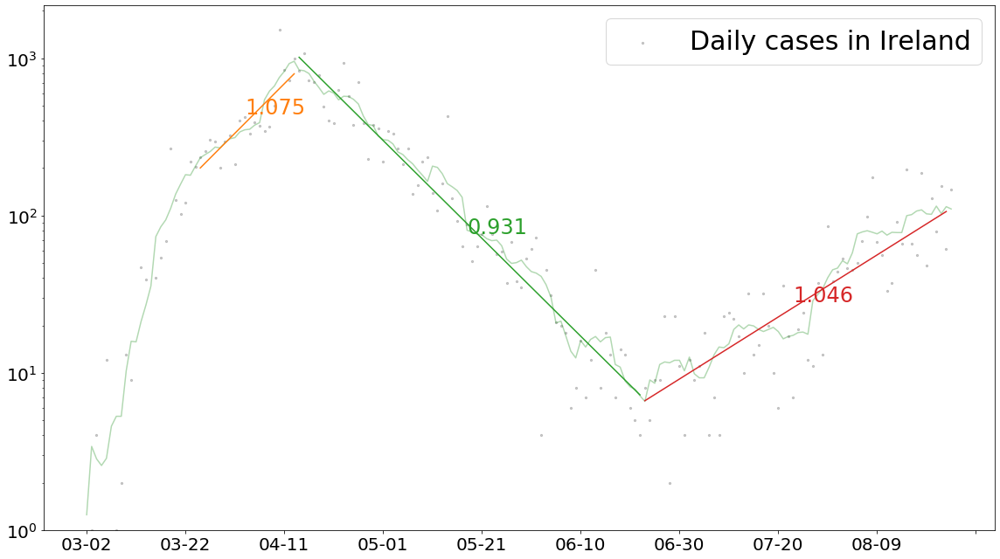

In [164]:
def linear_fit(x, a, b):
    return  a*x+b

def target_segmented_reg(focus, title, days):
    fig, ax = plt.subplots(nrows=1, ncols=1, sharey=True, figsize=(16,9))
    ax.scatter(focus.index, focus.values, c='gray', s=5, alpha=0.4, label=r'Daily cases in %s'%title)
    ax.plot(focus.rolling(window=7, min_periods=1, center=True).mean(), c='green',alpha=0.3)

    for i,(a,b) in enumerate(days):
        slope, intercept = optimize.curve_fit(linear_fit, np.arange(a,b), np.log(focus.values[a:b]+1))[0]
        ax.plot(np.arange(a,b), np.exp(np.arange(a,b)*slope + intercept), c=('C'+str(i+1)))
        ax.annotate(np.round(np.exp(slope),3), 
                    xy=((a+b-2)/2, np.exp((a+b+2)/2*slope + intercept)), fontsize=24, c=('C'+str(i+1)))                    

    ax.legend(prop={'size': 30})
    ax.tick_params(labelsize=20)
    ax.xaxis.set_major_locator(plt.MaxNLocator(12))
    ax.format_xdata = mdates.DateFormatter('%m-%d')
    ax.set_yscale('log')
    ax.set_ylim(bottom=1, )
    plt.tight_layout()
    
# df = get_Australia()
# focus = df['VIC']
# focus.index = focus.index.strftime('%m-%d')

confirm = pd.read_csv('data/JH/confirm_agg.csv').set_index('Country/Region').T
focus = confirm['Ireland'].diff()[40:]
focus.index = pd.to_datetime(focus.index).strftime('%m-%d')


target_segmented_reg(focus, 'Iseraelreland', days = [(23,43),(43,113),(113,175)])
# country_dynamics('Confirmed', 'Ireland',40, [(23,43),(43,113),(113,175)])

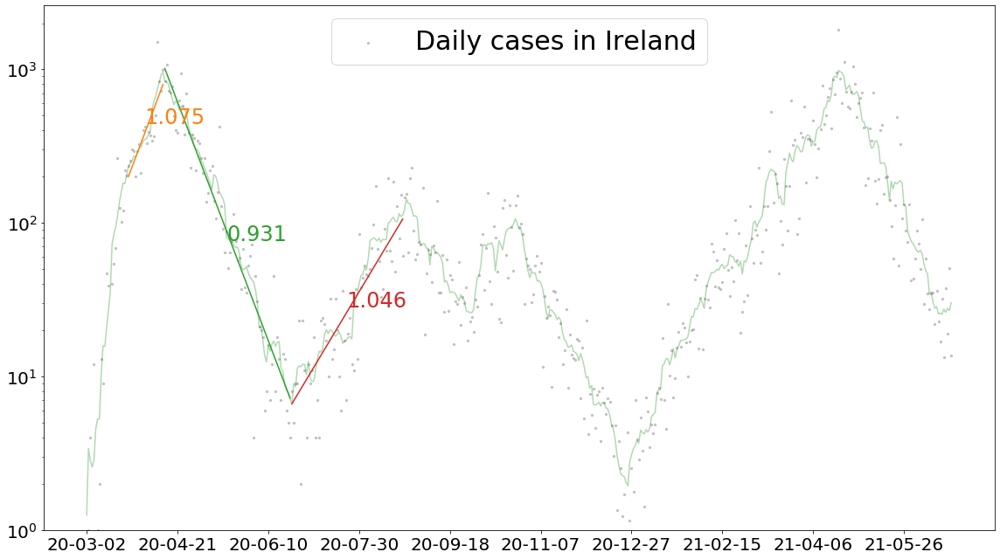

In [225]:
now = focus.values.tolist()
start = len(now)

switch = [0, 30, 60, 120, 240, 301]

for i in range(len(switch) - 1):
    for j in range(switch[i], switch[i+1]):
        if i%2:
            now.append(now[-1] * 1.05)
        else:
            now.append(now[-1] * 0.94)
            
for i in range(start, len(now)):
    now[i] *= np.random.lognormal(mean=0.0, sigma=0.5)

now = pd.Series(now)
now.index = pd.date_range(start='2020-03-02', end='2021-06-21', freq='D').strftime('%y-%m-%d')

target_segmented_reg(now, 'Ireland', days = [(23,43),(43,113),(113,175)])

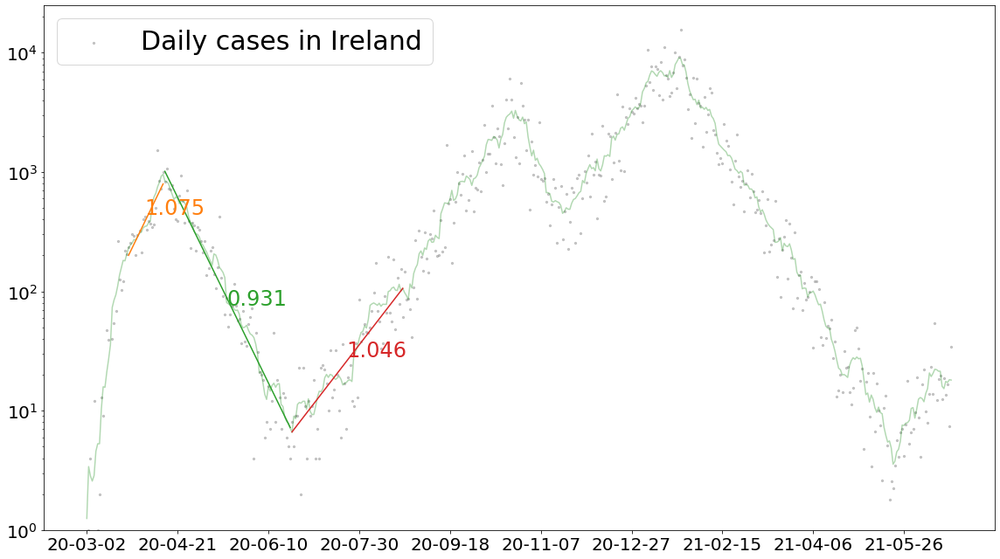

In [227]:
now = focus.values.tolist()
start = len(now)

switch = [0, 30, 60, 120, 240, 301]
switch = [0, 60, 90, 150, 270, 301]

for i in range(len(switch) - 1):
    for j in range(switch[i], switch[i+1]):
        if i%2:
            now.append(now[-1] * 0.94)
        else:
            now.append(now[-1] * 1.05)
            
for i in range(start, len(now)):
    now[i] *= np.random.lognormal(mean=0.0, sigma=0.5)

now = pd.Series(now)
now.index = pd.date_range(start='2020-03-02', end='2021-06-21', freq='D').strftime('%y-%m-%d')

target_segmented_reg(now, 'Ireland', days = [(23,43),(43,113),(113,175)])

## Overlay

(1.0, 15000)

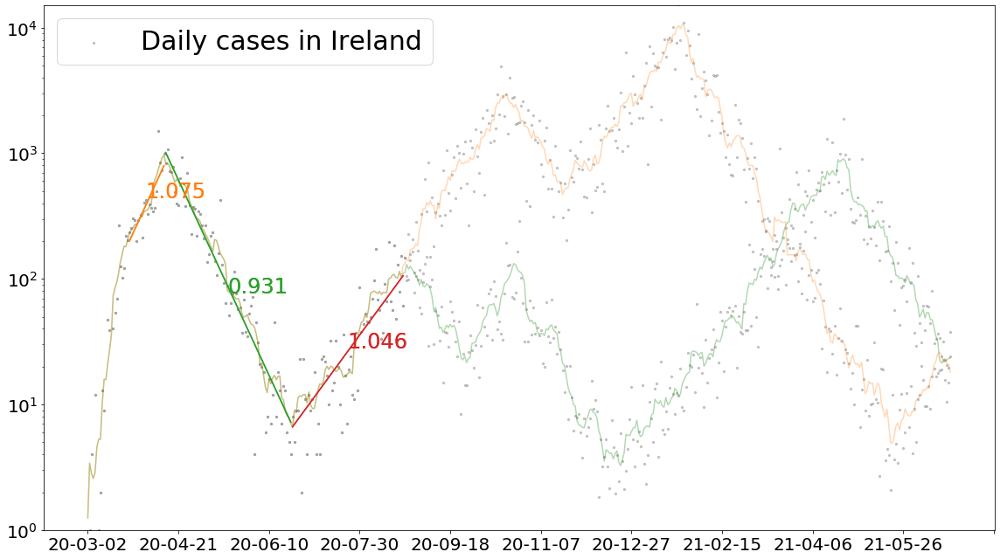

In [241]:
def linear_fit(x, a, b):
    return  a*x+b

def target_segmented_reg_2(focus, title, days, fig, ax, color='green',label=True):
#     fig, ax = plt.subplots(nrows=1, ncols=1, sharey=True, figsize=(16,9))
    ax.scatter(focus.index, focus.values, c='gray', s=5, alpha=0.4, label=r'Daily cases in %s'%title)
    ax.plot(focus.rolling(window=7, min_periods=1, center=True).mean(), c=color,alpha=0.3)

    for i,(a,b) in enumerate(days):
        slope, intercept = optimize.curve_fit(linear_fit, np.arange(a,b), np.log(focus.values[a:b]+1))[0]
        ax.plot(np.arange(a,b), np.exp(np.arange(a,b)*slope + intercept), c=('C'+str(i+1)))
        ax.annotate(np.round(np.exp(slope),3), 
                    xy=((a+b-2)/2, np.exp((a+b+2)/2*slope + intercept)), fontsize=24, c=('C'+str(i+1)))                    
    
    if label:
        ax.legend(prop={'size': 30})
    ax.tick_params(labelsize=20)
    ax.xaxis.set_major_locator(plt.MaxNLocator(12))
    ax.format_xdata = mdates.DateFormatter('%m-%d')
    ax.set_yscale('log')
    ax.set_ylim(bottom=1, )
    plt.tight_layout()
    
# df = get_Australia()
# focus = df['VIC']
# focus.index = focus.index.strftime('%m-%d')

confirm = pd.read_csv('data/JH/confirm_agg.csv').set_index('Country/Region').T
focus = confirm['Ireland'].diff()[40:]
focus.index = pd.to_datetime(focus.index).strftime('%m-%d')

fig, ax = plt.subplots(nrows=1, ncols=1, sharey=True, figsize=(16,9))


now = focus.values.tolist()
start = len(now)

switch = [0, 30, 60, 120, 240, 301]

for i in range(len(switch) - 1):
    for j in range(switch[i], switch[i+1]):
        if i%2:
            now.append(now[-1] * 1.05)
        else:
            now.append(now[-1] * 0.94)
            
for i in range(start, len(now)):
    now[i] *= np.random.lognormal(mean=0.0, sigma=0.5)

now = pd.Series(now)
now.index = pd.date_range(start='2020-03-02', end='2021-06-21', freq='D').strftime('%y-%m-%d')

target_segmented_reg_2(now, 'Ireland', days = [(23,43),(43,113),(113,175)], fig=fig, ax=ax)



now = focus.values.tolist()
start = len(now)

switch = [0, 30, 60, 120, 240, 301]
switch = [0, 60, 90, 150, 270, 301]

for i in range(len(switch) - 1):
    for j in range(switch[i], switch[i+1]):
        if i%2:
            now.append(now[-1] * 0.94)
        else:
            now.append(now[-1] * 1.05)
            
for i in range(start, len(now)):
    now[i] *= np.random.lognormal(mean=0.0, sigma=0.5)

now = pd.Series(now)
now.index = pd.date_range(start='2020-03-02', end='2021-06-21', freq='D').strftime('%y-%m-%d')

target_segmented_reg_2(now, 'Ireland', days = [(23,43),(43,113),(113,175)], fig=fig, ax=ax, color='C1', label=False)
ax.set_ylim(top=15000)


# France - alternative source

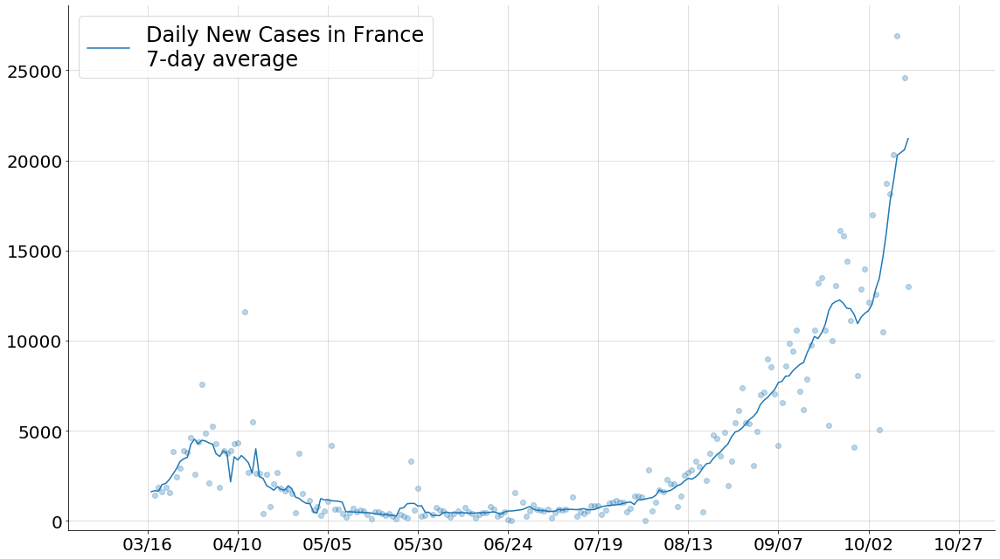

In [283]:
df = pd.read_csv('https://raw.githubusercontent.com/ronanren/Covid19bot/master/data/dataFrance.csv').set_index('Date')
df.index = pd.to_datetime(df.index)
t = (df['Total Cases'].diff())*1000

fig, ax = plt.subplots(figsize=(16,9))

ax.scatter(t.index, t.values, alpha=0.3)
ax.plot(t.rolling(window=7, min_periods=1, center=True).mean(), label='Daily New Cases in France\n7-day average')

ax.tick_params(labelsize=20)
ax.xaxis.set_major_locator(plt.MaxNLocator(12))
ax.xaxis.set_major_formatter(mdates.DateFormatter('%m/%d'))

ax.set_ylim(bottom=-500)
ax.legend(fontsize=24)
ax.grid(alpha=0.5)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
plt.tight_layout()
plt.savefig('figures/Daily_misc_10_13a.png', dpi=100)


# Spain -alternative source

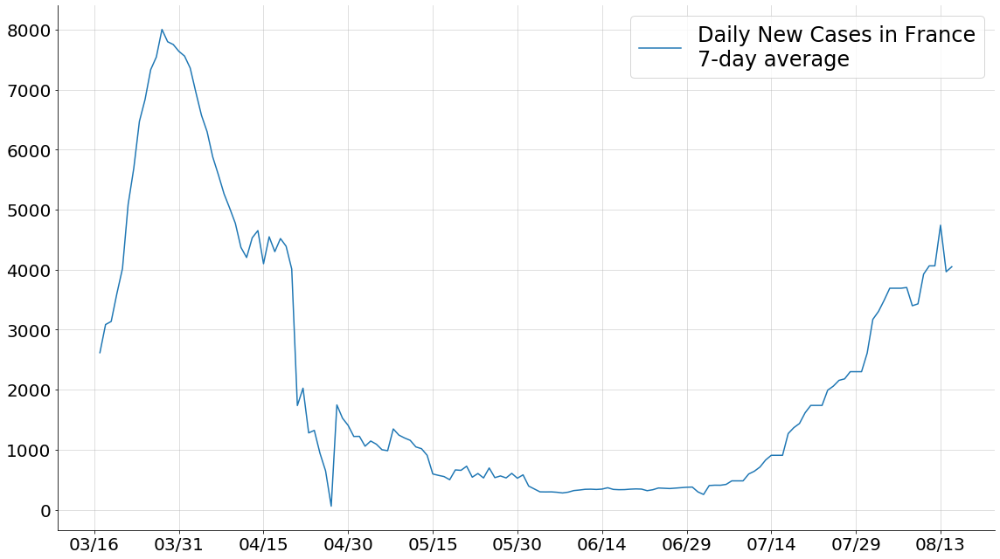

In [487]:
df = pd.read_csv('https://raw.githubusercontent.com/davidjayjackson/COVID-19-Camino/master/spain_daily.csv').set_index('date')
df.index = pd.to_datetime(df.index)
t = df['confirmed'].diff()[45:]

fig, ax = plt.subplots(figsize=(16,9))

ax.plot(t.rolling(window=7, min_periods=1, center=True).mean(), label='Daily New Cases in France\n7-day average')

ax.tick_params(labelsize=20)
ax.xaxis.set_major_locator(plt.MaxNLocator(12))
ax.xaxis.set_major_formatter(mdates.DateFormatter('%m/%d'))


ax.legend(fontsize=24)
ax.grid(alpha=0.5)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
plt.tight_layout()
# plt.savefig('figures/Daily_misc_8_29.png', dpi=100)

# US 6M

2020-07-16 00:00:00
2020-08-06 00:00:00
2020-08-22 00:00:00
2020-09-04 00:00:00
2020-09-15 00:00:00
2020-09-27 00:00:00


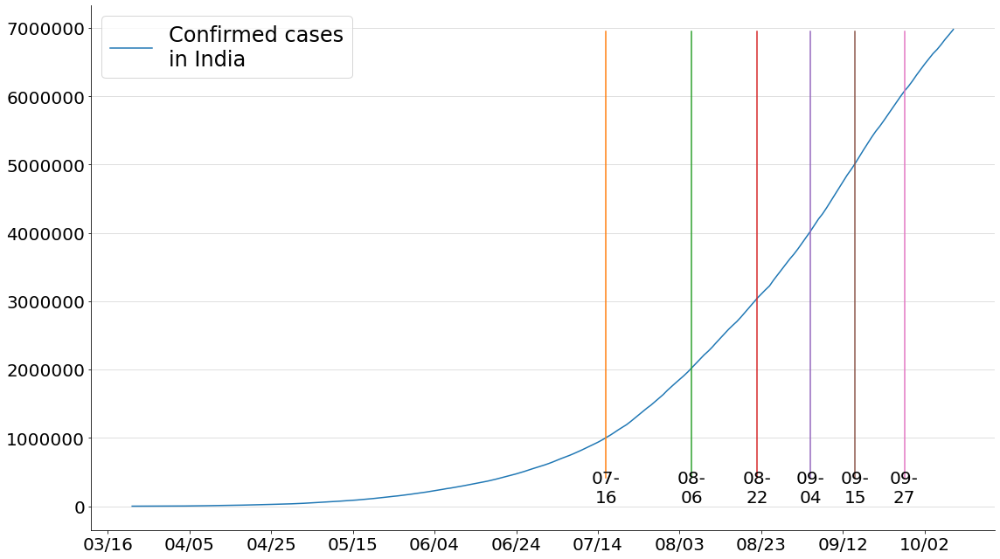

In [62]:
confirm = pd.read_csv('data/JH/confirm_agg.csv').set_index('Country/Region')
# confirm = pd.read_csv('data/JH/death_agg.csv').set_index('Country/Region')

t = confirm.T['India'][60:]
t.index = pd.to_datetime(t.index)

fig, ax = plt.subplots(nrows=1, ncols=1, sharey=True, figsize=(16,9))

ax.plot(t, label='Confirmed cases\nin India')

unit = 1000000
for i in range(1, t[-1]//unit+1):
    date = t[t.ge(i * unit)].index[0]
    print(date)
    ax.axvline(x=date, c='C'+str(i), ymin=0.1, ymax=.95)
    ax.annotate(date.strftime('%m-\n%d'), xy=(date, 60000), ha='center', fontsize=20)


ax.legend(fontsize=24)
ax.grid(alpha=0.5, axis='y')
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.tick_params(labelsize=20)
ax.xaxis.set_major_locator(plt.MaxNLocator(12))
ax.xaxis.set_major_formatter(mdates.DateFormatter('%m/%d'))
plt.tight_layout()
plt.savefig('figures/Daily_misc_10_10.png', dpi=100)

# France deatiled

In [489]:
df = pd.read_csv('https://raw.githubusercontent.com/ronanren/Covid19bot/master/data/dataFrance.csv', thousands='.').set_index('Date')

df.index = pd.to_datetime(df.index)
df

,Total Cases,New Cases,Total Deaths,New Deaths,Total Recovered,Active Cases,Critical,New Recovered,New Active,New Critical,PlaceInWorld,Total Tests,New Tests
Date,,,,,,,,,,,,,
2020-03-17,7730,1097,175,27,602,6953,699,0,0,0,7,0,0
2020-03-18,9134,1404,264,89,1000,8268,771,398,1315,232,6,0,0
2020-03-19,10995,1861,372,108,1300,9328,1002,300,1060,191,7,0,0
2020-03-20,12612,1617,450,78,1587,10575,1297,287,1247,175,7,0,0
2020-03-21,14459,1847,562,112,1811,12310,1525,224,1735,228,7,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-09-28,542639,4070,31808,81,95426,415405,1118,535,3454,20,11,10712335,155861
2020-09-29,550690,8051,31893,85,96327,422470,1204,901,7065,86,11,10806709,94374
2020-09-30,563535,12845,31956,63,96797,434782,1238,470,12312,34,11,10841327,34618


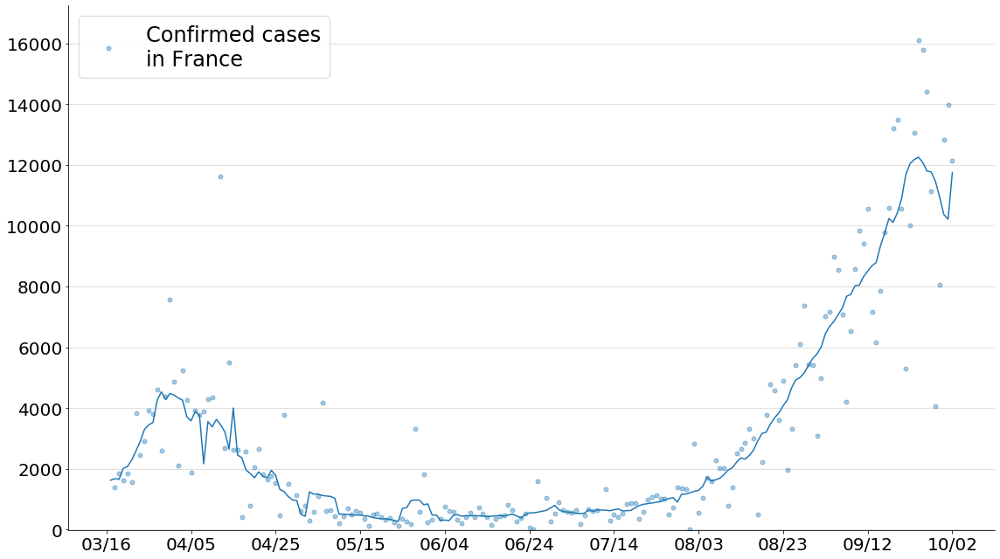

In [491]:
fig, ax = plt.subplots(nrows=1, ncols=1, sharey=True, figsize=(16,9))

ax.plot(df['Total Cases'].diff(), 'o', label='Confirmed cases\nin France', markersize=5, alpha=0.4)
ax.plot(df['Total Cases'].diff().rolling(window=7, min_periods=1, center=True).mean(), c='C0')

ax.legend(fontsize=24)
ax.grid(alpha=0.5, axis='y')
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.tick_params(labelsize=20)
ax.set_ylim(bottom=-10)
ax.xaxis.set_major_locator(plt.MaxNLocator(12))
ax.xaxis.set_major_formatter(mdates.DateFormatter('%m/%d'))
plt.tight_layout()
plt.savefig('figures/Daily_misc_10_2.png', dpi=100)

# Gompertz function

In [356]:
from scipy.optimize import curve_fit

def gompertz(x,a,b,c):
    return a*np.exp(-b*np.exp(-c*x))  

confirm = pd.read_csv('data/JH/confirm_agg.csv').set_index('Country/Region').T

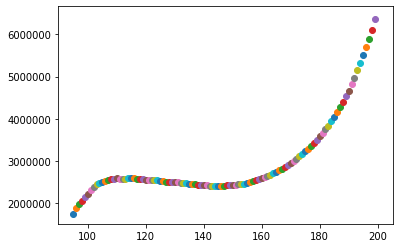

In [380]:
for end in range(95,200):


    country = 'Italy'
    t = confirm[country][:end]

    xdata = t.reset_index().index.tolist()
    ydata = t.values

    popt, pcov = curve_fit(gompertz, xdata, ydata)

    # y_est = ngompertz(i, popt[0], popt[1], popt[2]) for i 
    def fn(x):
        return gompertz(x, popt[0], popt[1], popt[2]) 

    error = np.power((np.array(list(map(fn, xdata))) - ydata), 2)
    mse = error.sum()/end
    plt.scatter(x=end, y=mse)
# mse

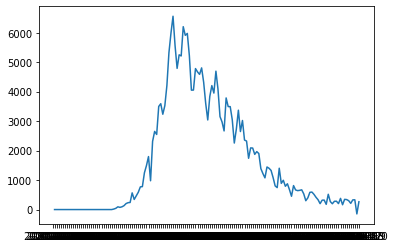

In [381]:
country = 'Italy'
t = confirm[country][:-95]
plt.plot(t.diff())

In [336]:
xdata = t.reset_index().index.tolist()
ydata = t.values

popt, pcov = curve_fit(gompertz, xdata, ydata)

# y_est = ngompertz(i, popt[0], popt[1], popt[2]) for i 
def fn(x):
    return gompertz(x, popt[0], popt[1], popt[2]) 

s = np.power((np.array(list(map(fn, xdata))) - ydata), 2)

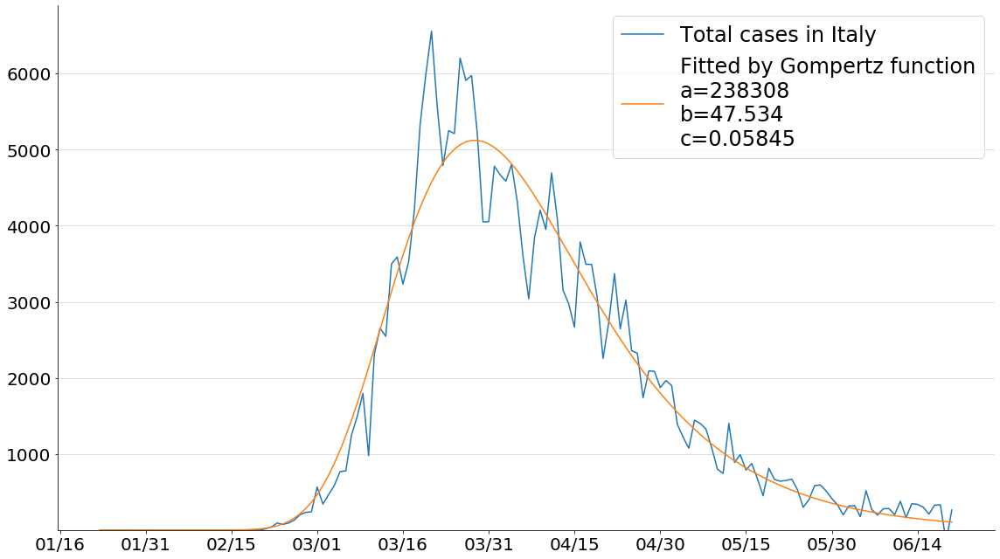

In [383]:
xdata = t.reset_index().index.tolist()
ydata = t.values

popt, pcov = curve_fit(gompertz, xdata, ydata)

k = pd.DataFrame(t)
k['fit'] = [gompertz(x, popt[0], popt[1], popt[2]) for x in xdata]
k.index = pd.to_datetime(k.index)

fig, ax = plt.subplots(nrows=1, ncols=1, sharey=True, figsize=(16,9))

ax.plot(k[country].diff(), label='Total cases in %s'%country)
ax.plot(k['fit'].diff(), label='Fitted by Gompertz function\na=%s\nb=%s\nc=%s'%(int(popt[0]), np.round(popt[1], 3), np.round(popt[2], 6)))

ax.legend(fontsize=24)
ax.grid(alpha=0.5, axis='y')
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.tick_params(labelsize=20)
ax.set_ylim(bottom=1)
ax.xaxis.set_major_locator(plt.MaxNLocator(12))
ax.xaxis.set_major_formatter(mdates.DateFormatter('%m/%d'))
# ax.set_yscale('log')
plt.tight_layout()
# plt.savefig('figures/Daily_misc_Gompertz_%s.png'%country, dpi=100)

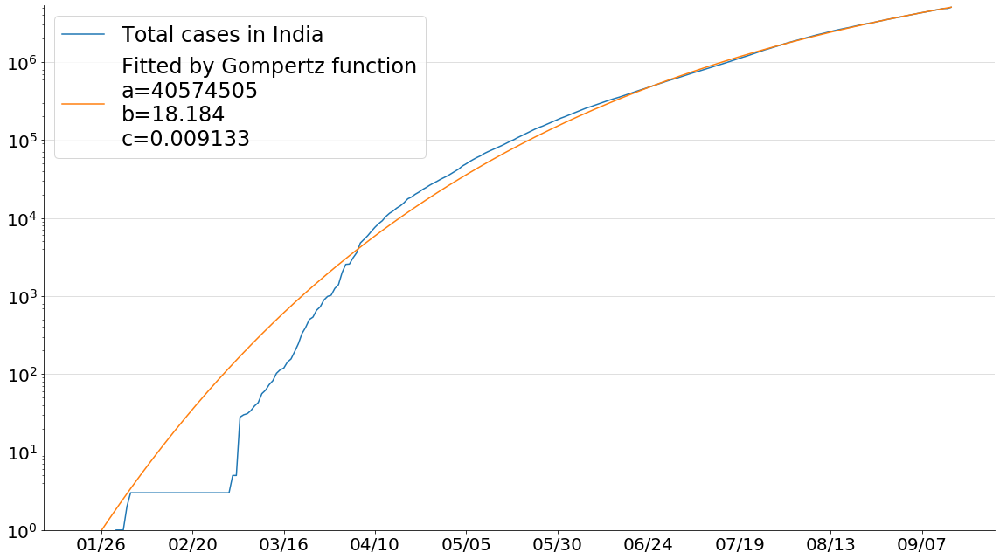

In [263]:
xdata = t.reset_index().index.tolist()
ydata = t.values

popt, pcov = curve_fit(gompertz, xdata, ydata)

k = pd.DataFrame(t)
k['fit'] = [gompertz(x, popt[0], popt[1], popt[2]) for x in xdata]
k.index = pd.to_datetime(k.index)

fig, ax = plt.subplots(nrows=1, ncols=1, sharey=True, figsize=(16,9))

ax.plot(k[country], label='Total cases in %s'%country)
ax.plot(k['fit'], label='Fitted by Gompertz function\na=%s\nb=%s\nc=%s'%(int(popt[0]), np.round(popt[1], 3), np.round(popt[2], 6)))

ax.legend(fontsize=24)
ax.grid(alpha=0.5, axis='y')
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.tick_params(labelsize=20)
ax.set_ylim(bottom=1)
ax.xaxis.set_major_locator(plt.MaxNLocator(12))
ax.xaxis.set_major_formatter(mdates.DateFormatter('%m/%d'))
ax.set_yscale('log')
plt.tight_layout()
plt.savefig('figures/Daily_misc_Gompertz_%s.png'%country, dpi=100)

# OWID testing data

In [284]:
df = pd.read_csv('https://raw.githubusercontent.com/owid/covid-19-data/master/public/data/testing/covid-testing-all-observations.csv')

test = df.pivot_table(index='Date', columns='Entity', values='Daily change in cumulative total').fillna(0)
test = test.drop(test.columns[['people' in i for i in test.columns]], axis=1).astype(int)
test.columns = [i.split(' -')[0] for i in test.columns]
test.index = pd.to_datetime(test.index)

new_case = pd.read_csv('https://raw.githubusercontent.com/owid/covid-19-data/master/public/data/ecdc/new_cases.csv').set_index('date')[1:]
new_case.index = pd.to_datetime(new_case.index)


In [45]:
test.columns

Index(['Argentina', 'Australia', 'Austria', 'Bahrain', 'Bangladesh', 'Belarus',
       'Belgium', 'Bolivia', 'Bulgaria', 'Chile', 'Colombia', 'Cote d'Ivoire',
       'Cuba', 'Czech Republic', 'Democratic Republic of Congo', 'Denmark',
       'Dominican Republic', 'El Salvador', 'Estonia', 'Ethiopia', 'Fiji',
       'Finland', 'France', 'Ghana', 'Greece', 'Hungary', 'Iceland', 'India',
       'Iran', 'Iraq', 'Ireland', 'Israel', 'Italy', 'Japan', 'Kazakhstan',
       'Kenya', 'Kuwait', 'Latvia', 'Libya', 'Lithuania', 'Luxembourg',
       'Madagascar', 'Malawi', 'Maldives', 'Malta', 'Mozambique', 'Myanmar',
       'Namibia', 'Nepal', 'New Zealand', 'Nigeria', 'Oman', 'Pakistan',
       'Palestine', 'Panama', 'Paraguay', 'Poland', 'Portugal', 'Romania',
       'Russia', 'Rwanda', 'Saudi Arabia', 'Senegal', 'Slovakia', 'Slovenia',
       'Spain', 'Sri Lanka', 'Sweden', 'Switzerland', 'Thailand', 'Togo',
       'Tunisia', 'Turkey', 'Uganda', 'Ukraine', 'United Arab Emirates',
       'United

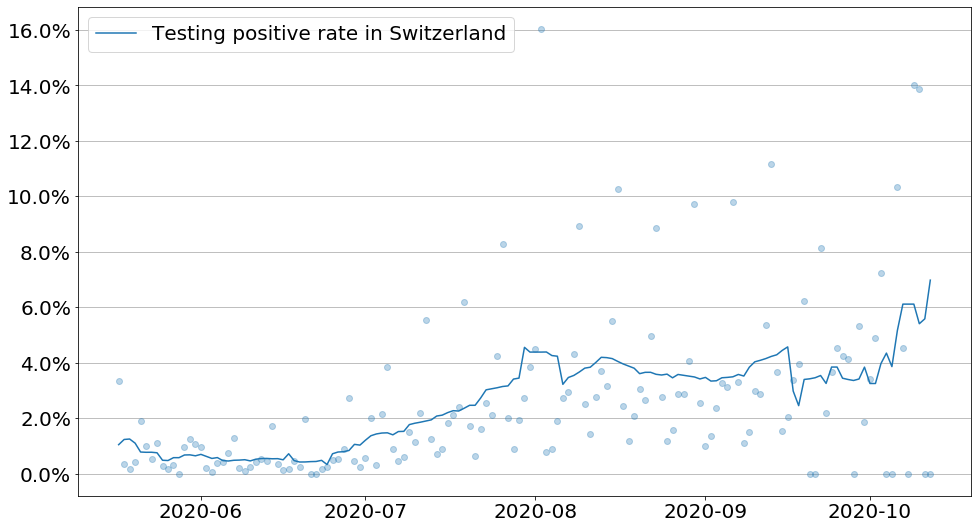

In [286]:
country = 'Switzerland'

fig, ax = plt.subplots(nrows=1, ncols=1, sharey=True, figsize=(16,9))
ax.plot((new_case[country] / test[country]*100).rolling(window=7, min_periods=1, center=True).mean()[-150:-1], label='Testing positive rate in %s'%country)
ax.plot((new_case[country] / test[country]*100)[-150:], 'o', c='C0', alpha=0.3)

ax.legend(fontsize=20)
ax.yaxis.set_major_formatter(mtick.PercentFormatter())
ax.tick_params(labelsize=20)
ax.grid(axis='y')
# plt.savefig('figures/Daily_misc_10_9.png', dpi=100)

# Alpha_peak

In [512]:
df = pd.read_csv('data/alpha_peak.csv').set_index('Unnamed: 0')

In [514]:
df['peak']/df['pop']

Unnamed: 0
Germany        69.975904
Greece         10.280374
France         57.641791
Australia      16.600000
Russia         73.584775
Ireland        44.693878
Netherlands    42.543353
dtype: float64

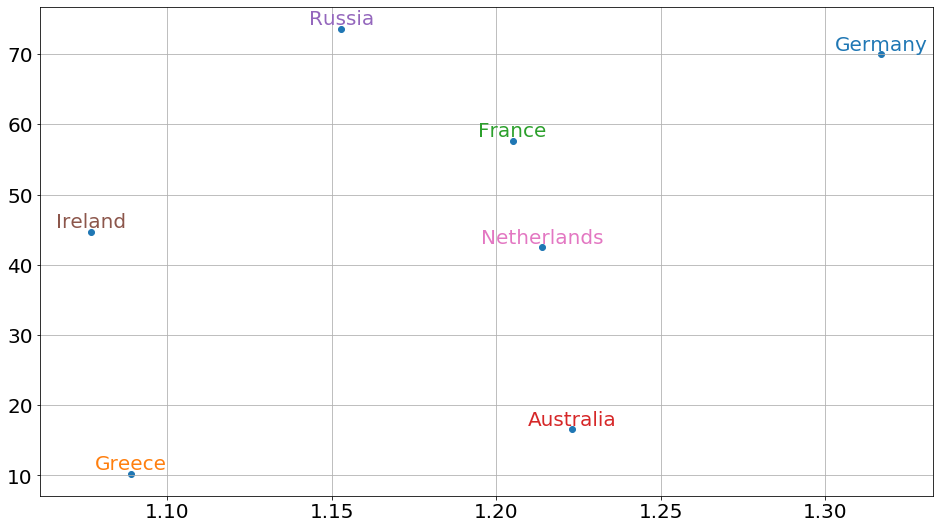

In [519]:
fig, ax = plt.subplots(figsize=(16,9))

ax.scatter(x=df['alpha'], y=(df['peak']/df['pop']))

for i in range(len(df)):
    ax.annotate(df.index[i], (df['alpha'][i], (df['peak']/df['pop'])[i]), va='bottom', ha='center', fontsize=20, c='C'+str(i))
    
ax.tick_params(labelsize=20)
ax.grid()

In [305]:
df = pd.read_csv('data/case_gdp.csv')
df = df[df['GDP Q2'].notnull()].reset_index()
df.columns

Index(['index', 'Country/Other', '#', 'Total Cases', 'Total Deaths',
       'Active Cases', 'Tot Cases/ 1M pop', 'Deaths/ 1M pop', 'Population',
       'GDP Q2', 'GDP Q3'],
      dtype='object')

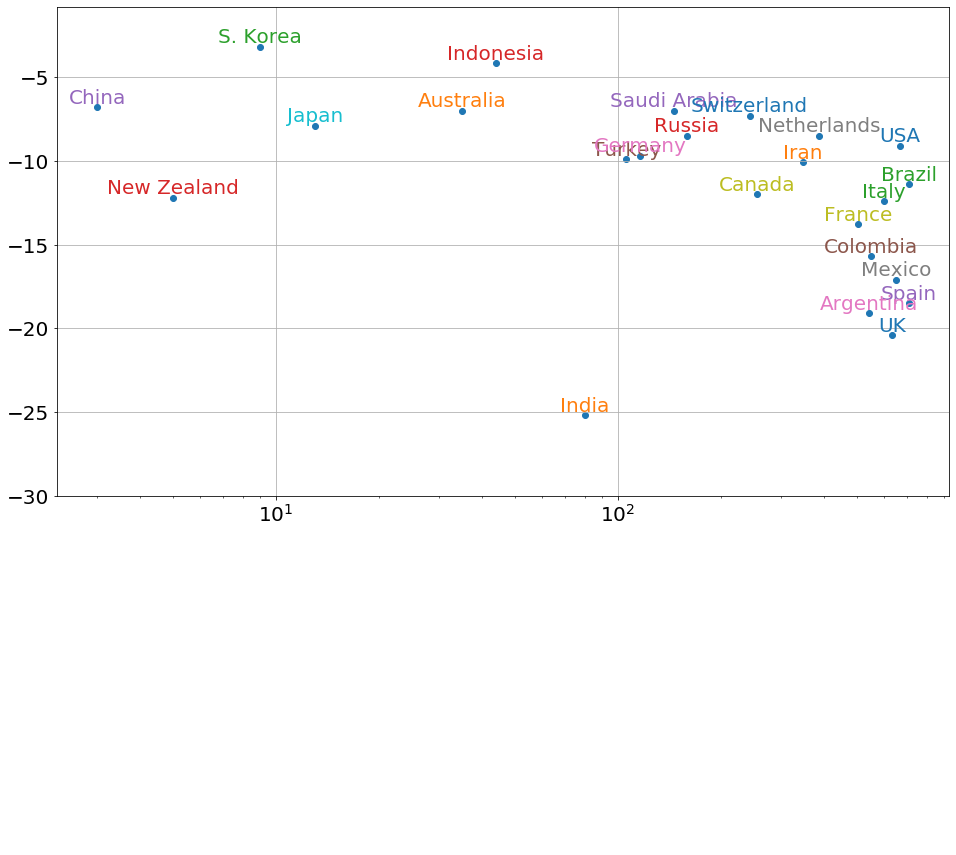

In [309]:
fig, ax = plt.subplots(figsize=(16,9))

v1 = df['Deaths/ 1M pop']
v2 = df['GDP Q2']
ax.scatter(x=v1, y=v2)

for i in range(len(df)):
    ax.annotate(df['Country/Other'][i], (v1[i], v2[i]), va='bottom', ha='center', fontsize=20, c='C'+str(i))
    
ax.tick_params(labelsize=20)
ax.set_xscale('log')
ax.set_ylim(bottom=-30)
ax.grid()